In [1]:
#import user modules
#--- MATPLOTLIB
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.markers import MarkerStyle
from matplotlib.gridspec import GridSpec
import matplotlib.colors as mcolors
import seaborn as sns
import pandas as pd
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset

import sys
my_path = "../../Python/"
if my_path not in sys.path:
    sys.path.append(my_path)
 
for place in sys.path: 
    print(place)

from tools import *
from fit_funcs import *
from entropy import *
import costfun.costfun as cost
import utils.figures as fig_help
from RandomMatrixTheory import goe
import utils.tools as tools

import importlib as imp
def reload_modules():
    imp.reload(cost)
    imp.reload(fig_help)

import itertools
matplotlib.rcParams['mathtext.fontset'] = 'stix'
matplotlib.rcParams['font.family'] = 'STIXGeneral'
latex_engine = 'xelatex'
latex_elements = {'preamble':r'\usepackage{physics}'}

%matplotlib inline
colors_ls = (list(mcolors.TABLEAU_COLORS)[:200])
colors_ls_cyc = itertools.cycle(colors_ls)

markers_ls = ['o','s','v', 'D', '<', 'X', '^', '*', '+']
markers = itertools.cycle(markers_ls)

linestyle_ls = ['-','--',':', '-.']
linestyle = itertools.cycle(linestyle_ls)

#--- NUMERICAL LIBS
import numpy as np
import itertools
import math
import random
from cmath import nan
import h5py   


# SCIPY LIBS
import scipy.stats as statistics
from scipy.special import binom
from scipy.special import erfinv
from scipy.special import erf
from scipy.special import digamma
from scipy.special import polygamma
from scipy.special import lambertw
from scipy.optimize import curve_fit as fit
from scipy.signal import savgol_filter
from scipy import integrate
from scipy import fft
from scipy.interpolate import UnivariateSpline as InterpolateSpline
from scipy.interpolate import splrep, splev
from scipy.interpolate import make_interp_spline as make_spline
from scipy.interpolate import interp1d
from scipy.interpolate import RegularGridInterpolator
from scipy.optimize import fsolve

from mpl_toolkits.axes_grid1 import make_axes_locatable

# OTHER
import warnings
warnings.filterwarnings('ignore')
from joblib import Parallel, delayed
import copy
import os
from os import sep as kPSep
from os.path import exists


config_disorder = 0
scaled_disorder = 0

if config_disorder:
    base_dir = "../results_conf_dis/"
else:
    base_dir = "../results/"

print(base_dir[2:])
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}

/Users/rafal.swietek/Projects/CODES/QHamSolver/QuantumSun/Jupyter_Python
/Users/rafal.swietek/opt/anaconda3/lib/python39.zip
/Users/rafal.swietek/opt/anaconda3/lib/python3.9
/Users/rafal.swietek/opt/anaconda3/lib/python3.9/lib-dynload

/Users/rafal.swietek/opt/anaconda3/lib/python3.9/site-packages
/Users/rafal.swietek/opt/anaconda3/lib/python3.9/site-packages/aeosa
/Users/rafal.swietek/opt/anaconda3/lib/python3.9/site-packages/locket-0.2.1-py3.9.egg
/Users/rafal.swietek/opt/anaconda3/lib/python3.9/site-packages/IPython/extensions
/Users/rafal.swietek/.ipython
../../Python/
/results/


# ERGODIC

In [262]:
84*10*13

10920

0.5 3.5819400032560536 1.4611067600145926 s1_c =  0.21824816546907475
0.5 1.32523435074775 1.0761632965735854 s1_c =  0.4300641781239897
1 0.8118343209416593 1.436418735616941 s1_c =  0.5519268447681646
1 0.43684201305677733 1.5486560511261167 s1_c =  0.6959707406331838
2 0.2287846562022553 1.666553492458763 s1_c =  0.8138122452559353
2 0.15388817359797247 1.7889709029586722 s1_c =  0.8666351063135267
3 0.11458664108848968 1.5074550968210716 s1_c =  0.8971935990758099
3 0.08323293184089253 1.8411051550009248 s1_c =  0.923162480206872


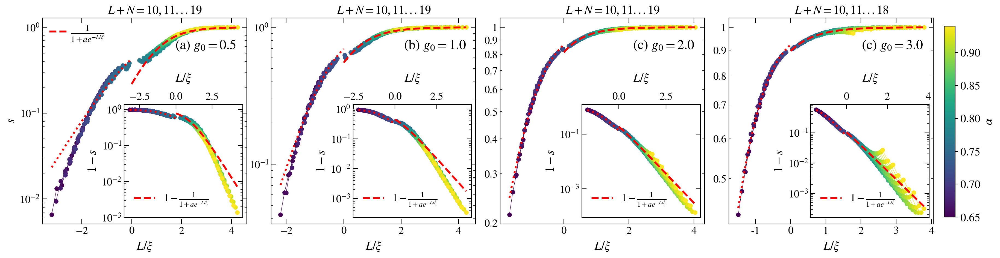

In [107]:
L_total=15

J=2


alfa=1
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0


fig, axes = plt.subplots( nrows=1, ncols=4, figsize=(20,5), dpi = 200, sharey = False)
# fig, ax = plt.subplots( nrows=1, ncols=1, figsize=(5,5), dpi = 200)

axis = axes.flatten()

sizes = np.arange(6, 19, 1)

interpolate = 0

alfa_min = 0.65
alfa_max = 0.94
p = 1       # number of last spins
nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)


collapse_nu = 1

b_const = [25, 20, 28]
gam = [0.61, 0.69, 0.79]
aa = [0.65, 0.55, 0.65] if collapse_nu else [3.2, 2.8, 2.5]
bb = [1, 0.5, 0.2] if collapse_nu else [1, 0.5, 0.01]
for idx1, J in enumerate([0.5, 1, 2, 3]):
# for idx1, J in enumerate([1, 2, 3]):
    
    inset = axis[idx1].inset_axes([0.4, 0.03, 0.58, 0.55]);
    
    alfa_crit = 0.75
    if J == 0.5:    alfa_crit = 0.7612779024078085; s1_crit = 0.3975596423927653; sizes = np.arange(10, 20, 1 if p > 0 else 2); nu = 0.59
    elif J == 1:    alfa_crit = 0.7294402852322444; s1_crit = 0.5976612536491842; sizes = np.arange(10, 20, 1 if p > 0 else 2); nu = 0.68
    elif J == 2:    alfa_crit = 0.7207704442893257; s1_crit = 0.8326330851556897; sizes = np.arange(10, 20, 1 if p > 0 else 2); nu = 0.78
    elif J == 3:    alfa_crit = 0.71795404;         s1_crit = 0.9073984827790079; sizes = np.arange(10, 19, 1 if p > 0 else 2); nu = 0.79
    else:           alfa_crit = 1/np.sqrt(2)

    # alfa_min = alfa_crit + 0.01

    interaction = []
    ydata = []
    for L_total in sizes:
        L = L_total - N
        LA = L_total - p if p > 0 else L_total // 2

        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                Sent         = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
                Sinfo_vN     = np.array(file.get('vN info entropy'))
        else:
            print(name_out)
        alfa_vals_original = alfa_vals
        # print(L_total, entropy.shape)
        entropy = Sent[LA] / ( p*np.log(2) ) if p > 0 else Sent[LA] / page(LA, L_total-LA)
        interaction.append(alfa_vals)
        ydata.append(entropy)
        

    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    
    norm = matplotlib.colors.Normalize(
            vmin=alfa_min,
            vmax=alfa_max)

    # choose a colormap
    # c_m = matplotlib.cm.cool

    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])

    ydata = np.transpose( np.array(ydata) )
    # print(ydata.shape)
    beta_0 = np.zeros( (alfa_vals.size) )
    new_xx = np.zeros( (alfa_vals.size) )
    
    alfa_plot = []
    prefactor = []
    etas = []
    xdata_single_patricle = []
    ydata_single_patricle = []
    for ii_a, alfa in enumerate(alfa_vals):
        if alfa < alfa_min or alfa > alfa_max: continue

        xx = (sizes - N)**(1/nu) * (alfa - alfa_crit)*nu if collapse_nu else (sizes) * (alfa - alfa_crit)
        
        xx = np.sign(xx) * np.abs( (xx) ) **nu
        xdata_single_patricle = [*xdata_single_patricle, *xx]
        
        yy = ydata[ii_a] / (1.0 if collapse_nu else np.exp( b_const[idx1] *(alfa - alfa_crit) ) )
        ydata_single_patricle = [*ydata_single_patricle, *yy]

        axis[idx1].plot(xx, yy, marker='o', markersize=5, lw=0.5, color=s_m.to_rgba(alfa))
        inset.plot(xx, 1 - yy, marker='o', markersize=5, lw=0.5, color=s_m.to_rgba(alfa))
        # if interpolate:
        #     # axis[idx1].scatter(sizes, ydata[ii_a], marker='o', s=10, color=s_m.to_rgba(alfa))
        #     spl = make_spline(xx, yy)
        #     xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
        #     yy = spl(xx)
        #     axis[idx1].scatter(xx, yy, marker='s', s=5, color=s_m.to_rgba(alfa))
        
        # try:
        #     ii_cut = -15 if interpolate else -5
        #     # xx = xx - N
        #     def my_fit(L, c, eta):
        #         return c * np.exp(-eta * L)
        #     pars, pconv= fit(my_fit,
        #                     xdata = xx[ii_cut:],
        #                     ydata = yy[ii_cut:])

        #     eta = pars[1]
        #     c = pars[0]
        #     # print("J=", J, "  alfa=", np.round(alfa, 2), "  eta=", eta, "  c=", c)
        #     prefactor.append(c)
        #     etas.append(eta)
        #     alfa_plot.append(alfa)
        #     dense_sizes = np.linspace(xx[ii_cut], xx[-1]+1, 1000)
        #     # axis[idx1].plot(dense_sizes, my_fit(dense_sizes, *pars), lw=1.5, color=s_m.to_rgba(alfa), ls = '--')
        # except RuntimeError:
        #     print(alfa)
    
    dense_sizes = np.linspace(min(xdata_single_patricle), max(xdata_single_patricle), 1000)
    # if not collapse_nu: axis[idx1].plot(dense_sizes, my_fit(dense_sizes, bb[idx1], aa[idx1]), lw=1.5, color='k', ls = '--', label=r"$Be^{-a\cdot z}$")
    # else:          a=1; axis[idx1].plot(dense_sizes, my_fit(dense_sizes, bb[idx1], aa[idx1]), lw=1.5, color='k', ls = '--', label=r"$Be^{-a\cdot z}$")

    xdata_single_patricle = np.array(xdata_single_patricle)
    ydata_single_patricle = np.array(ydata_single_patricle)
    if collapse_nu:
        def my_fit(x, a, b):
            # a = 1/s1_crit - 1
            return (1 / (1 + a * np.exp(-b * x)))

        indices = np.transpose(np.argwhere(xdata_single_patricle > 0))[0]
        # print(indices)
        pars, pconv= fit(my_fit,
                        xdata = xdata_single_patricle[indices],
                        ydata = ydata_single_patricle[indices],
                        maxfev = 8000)
        dense_sizes = np.linspace(0, max(xdata_single_patricle), 1000)
        axis[idx1].plot(dense_sizes, my_fit(dense_sizes, *pars), lw=2.5, color='red', ls = '--', label=r"$\frac{1}{1+ae^{-L/\xi}}$")
        inset.plot(dense_sizes, 1 - my_fit(dense_sizes, *pars), lw=2.5, color='red', ls = '--', label=r"$1-\frac{1}{1+ae^{-L/\xi}}$")
        print(J, *pars, "s1_c = ", 1/(1+pars[0]))
        
        indices = np.transpose(np.argwhere(xdata_single_patricle < 0))[0]
        pars, pconv= fit(my_fit,
                        xdata = xdata_single_patricle[indices],
                        ydata = ydata_single_patricle[indices],
                        maxfev = 8000)
        dense_sizes = np.linspace(min(xdata_single_patricle), 0, 1000)
        axis[idx1].plot(dense_sizes, my_fit(dense_sizes, *pars), lw=2.5, color='red', ls = ':')#, label=r"$\frac{1}{1+ae^{L/\xi}}$")
        inset.plot(dense_sizes, 1 - my_fit(dense_sizes, *pars), lw=2.5, color='red', ls = ':')#, label=r"$1-\frac{1}{1+ae^{L/\xi}}$")
        print(J, *pars, "s1_c = ", 1/(1+pars[0]))
    
    xlabb = ( r"$L^{1/\nu}(\alpha-\alpha_c)$" if collapse_nu else r"$z=(L+N)(\alpha-\alpha_c)$" )
    xlabb = r"$L/\xi$"
    ylabb = ( r"${s}$" if collapse_nu else r"$(\bar{s}_{%d})\cdot e^{b(g_0)\cdot(\alpha-\alpha_c)}$"%p ) if idx1 == 0 else ""
    fig_help.set_plot_elements(axis[idx1], ylabel=ylabb, xlabel=xlabb, font_size=14, set_legend=0, xscale='linear', yscale='log')
    fig_help.set_plot_elements(inset, ylabel=r"$1-s$", xlabel=xlabb, font_size=14, set_legend=1, xscale='linear', yscale='log')
    inset.xaxis.set_label_position("top")
    inset.xaxis.set_label_coords(.5, 1.2)
    inset.xaxis.tick_top()
    
    axis[idx1].annotate(r"$L+N=%d,%d...%d$"%(sizes[0], sizes[1], sizes[-1]), fontsize=16, xy=(0.32, 1.02), xycoords='axes fraction')
    
fig_help.set_legend(axis[0], loc='upper left', fontsize=16)


for ax in axis[2:]:
    ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
    ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
    ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
    ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))


fig.subplots_adjust(right=0.94)
cbar_ax = fig.add_axes([0.95, 0.15, 0.01, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$\alpha$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.65, 0.85), xycoords='axes fraction')
axis[1].annotate(r"(b) $g_0=1.0$", fontsize=18, xy=(0.65, 0.85), xycoords='axes fraction')
axis[2].annotate(r"(c) $g_0=2.0$", fontsize=18, xy=(0.65, 0.85), xycoords='axes fraction')
axis[3].annotate(r"(c) $g_0=3.0$", fontsize=18, xy=(0.65, 0.85), xycoords='axes fraction')

fig.subplots_adjust(wspace = 0.12, hspace=0.05)
fig.savefig("plots_beta/FigS2.pdf", bbox_inches = 'tight', pad_inches=0.02)

0.5 1.745226506328657 0.46280179594454096 s1_c =  0.36426866697326016
1 0.6453314456966733 0.7508664882022784 s1_c =  0.6077802758924209
2 0.19536167117056502 1.2389016923775085 s1_c =  0.8365668936170122


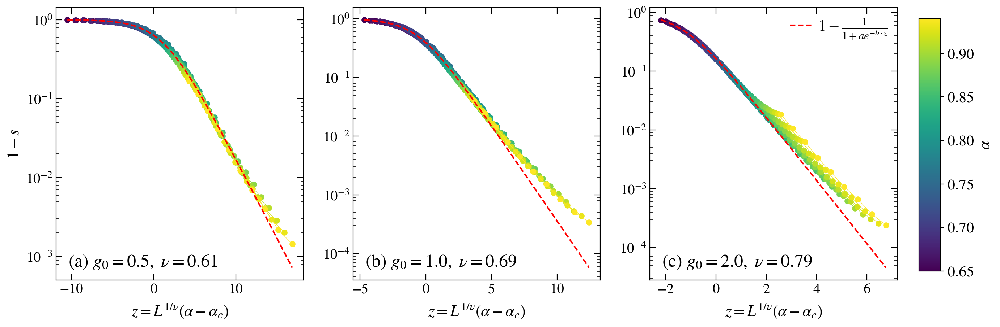

In [60]:
L_total=15

J=2


alfa=1
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0


fig, axes = plt.subplots( nrows=1, ncols=3, figsize=(15,5), dpi = 200, sharey = False)
# fig, ax = plt.subplots( nrows=1, ncols=1, figsize=(5,5), dpi = 200)

axis = axes.flatten()

sizes = np.arange(6, 19, 1)

interpolate = 0

alfa_min = 0.65
alfa_max = 0.94
p = 1       # number of last spins
nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)


collapse_nu = 1

b_const = [25, 20, 28]
gam = [0.61, 0.69, 0.79]
aa = [0.65, 0.55, 0.65] if collapse_nu else [3.2, 2.8, 2.5]
bb = [1, 0.5, 0.2] if collapse_nu else [1, 0.5, 0.01]
for idx1, J in enumerate([0.5, 1, 2]):

    alfa_crit = 0.75
    if J == 0.5:    alfa_crit = 0.7612779024078085; s1_crit = 0.3975596423927653; sizes = np.arange(10, 20, 1 if p > 0 else 2); nu = 0.61
    elif J == 1:    alfa_crit = 0.7294402852322444; s1_crit = 0.5976612536491842; sizes = np.arange(10, 20, 1 if p > 0 else 2); nu = 0.68
    elif J == 2:    alfa_crit = 0.7207704442893257; s1_crit = 0.8326330851556897; sizes = np.arange(10, 19, 1 if p > 0 else 2); nu = 0.79
    elif J == 3:    alfa_crit = 0.71795404;         s1_crit = 0.9073984827790079; sizes = np.arange(10, 17, 1 if p > 0 else 2)
    else:           alfa_crit = 1/np.sqrt(2)

    # alfa_min = alfa_crit + 0.01

    interaction = []
    ydata = []
    for L_total in sizes:
        L = L_total - N
        LA = L_total - p

        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                Sent         = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
                Sinfo_vN     = np.array(file.get('vN info entropy'))
        else:
            print(name_out)
        alfa_vals_original = alfa_vals
        # print(L_total, entropy.shape)
        entropy = Sent[LA] / ( p*np.log(2) )#page(LA, L_total-LA)
        interaction.append(alfa_vals)
        ydata.append(entropy)
        

    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    
    norm = matplotlib.colors.Normalize(
            vmin=alfa_min,
            vmax=alfa_max)

    # choose a colormap
    # c_m = matplotlib.cm.cool

    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])

    ydata = np.transpose( np.array(ydata) )
    # print(ydata.shape)
    beta_0 = np.zeros( (alfa_vals.size) )
    new_xx = np.zeros( (alfa_vals.size) )
    
    alfa_plot = []
    prefactor = []
    etas = []
    xdata_single_patricle = []
    ydata_single_patricle = []
    for ii_a, alfa in enumerate(alfa_vals):
        if alfa < alfa_min or alfa > alfa_max: continue

        xx = (sizes - N)**(1/nu) * (alfa - alfa_crit) if collapse_nu else (sizes) * (alfa - alfa_crit)
        xdata_single_patricle = [*xdata_single_patricle, *xx]
        
        yy = ydata[ii_a] / (1.0 if collapse_nu else np.exp( b_const[idx1] *(alfa - alfa_crit) ) )
        ydata_single_patricle = [*ydata_single_patricle, *yy]

        axis[idx1].plot(xx, 1-yy, marker='o', markersize=5, lw=0.5, color=s_m.to_rgba(alfa))
        
    dense_sizes = np.linspace(min(xdata_single_patricle), max(xdata_single_patricle), 1000)
    
    if collapse_nu:        
        def my_fit(x, a, b):
            # a = 1/s1_crit - 1
            return (1 / (1 + a * np.exp(-b * x)))

        pars, pconv= fit(my_fit,
                        xdata = xdata_single_patricle,
                        ydata = ydata_single_patricle,
                        maxfev = 8000)
        axis[idx1].plot(dense_sizes, 1-my_fit(dense_sizes, *pars), lw=1.5, color='red', ls = '--', label=r"$1-\frac{1}{1+ae^{-b\cdot z}}$")
        print(J, *pars, "s1_c = ", 1/(1+pars[0]))
    
    xlabb = ( r"$z=L^{1/\nu}(\alpha-\alpha_c)$" if collapse_nu else r"$z=(L+N)(\alpha-\alpha_c)$" )
    ylabb = ( r"$1-{s}$" if collapse_nu else r"$(\bar{s}_{%d})\cdot e^{b(g_0)\cdot(\alpha-\alpha_c)}$"%p ) if idx1 == 0 else ""
    fig_help.set_plot_elements(axis[idx1], ylabel=ylabb, xlabel=xlabb, font_size=14, set_legend=0, xscale='linear', yscale='log')

fig_help.set_legend(axis[2], loc='upper right', fontsize=16)


fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$\alpha$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

axis[0].annotate(r"(a) $g_0=0.5,\ \nu=%g$"%gam[0], fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[1].annotate(r"(b) $g_0=1.0,\ \nu=%g$"%gam[1], fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[2].annotate(r"(c) $g_0=2.0,\ \nu=%g$"%gam[2], fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')

fig.subplots_adjust(wspace = 0.2, hspace=0.05)
fig.savefig("plots_beta/FigS4.pdf", bbox_inches = 'tight', pad_inches=0.02)

# LOCALISED

[0.2  0.25 0.3  0.35 0.4  0.45 0.65 0.66 0.67 0.68 0.69 0.7 ]
5 0.2 20000
6 0.2 20000
7 0.2 20000
8 0.2 20000
9 0.2 17501
10 0.2 20500
11 0.2 13839
J= 1   alfa= 0.2   eta= 0.6215272247884677   c= 9.195373405362462   z= 1.0
5 0.25 20000
6 0.25 20000
7 0.25 20000
8 0.25 20000
9 0.25 17642
10 0.25 20500
11 0.25 14045
J= 1   alfa= 0.25   eta= 0.7237679707518085   c= 6.478233182919441   z= 1.0
5 0.30000000000000004 20000
6 0.30000000000000004 20000
7 0.30000000000000004 20000
8 0.30000000000000004 20000
9 0.30000000000000004 14504
10 0.30000000000000004 20438
11 0.30000000000000004 14336
J= 1   alfa= 0.3   eta= 0.8340225040020196   c= 6.316847767781769   z= 1.0
5 0.35000000000000003 20000
6 0.35000000000000003 20000
7 0.35000000000000003 20000
8 0.35000000000000003 20000
9 0.35000000000000003 14126
10 0.35000000000000003 20435
11 0.35000000000000003 14447
J= 1   alfa= 0.35   eta= 0.9335521426365918   c= 7.459211311716713   z= 1.0
5 0.4 20000
6 0.4 20000
7 0.4 20000
8 0.4 20000
9 0.4 13839
1

No handles with labels found to put in legend.
No handles with labels found to put in legend.


12 0.69 1691
13 0.69 409
14 0.69 1535
17 0.69 Got
15 0.69 660
18 0.69 Got
16 0.69 227
19 0.69 Got
J= 1   alfa= 0.69   eta= 8.129136359961189   c= 1.0075069413799302   z= 1.0
5 0.7 5000
6 0.7 5000
7 0.7 5000
8 0.7 4500
9 0.7 4064
10 0.7 2180
11 0.7 2050
12 0.7 1703
13 0.7 414
14 0.7 1501
17 0.7 Got
15 0.7 643
18 0.7 Got
16 0.7 227
19 0.7 Got
J= 1   alfa= 0.7   eta= 11.920895768479358   c= 0.7462459781080101   z= 1.0


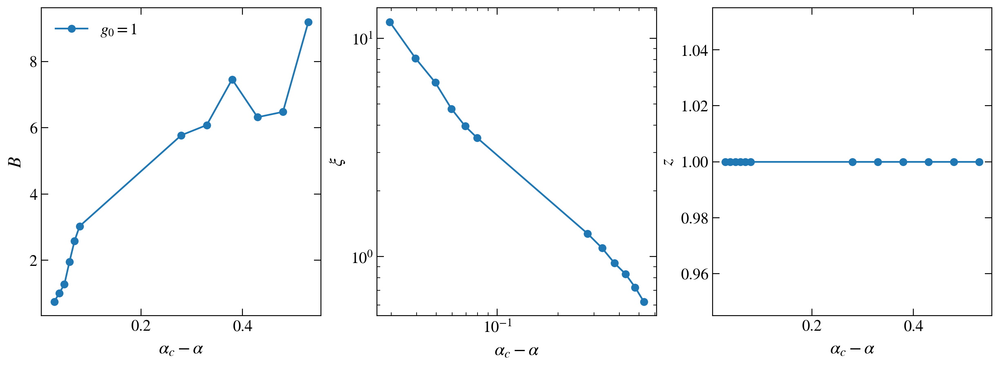

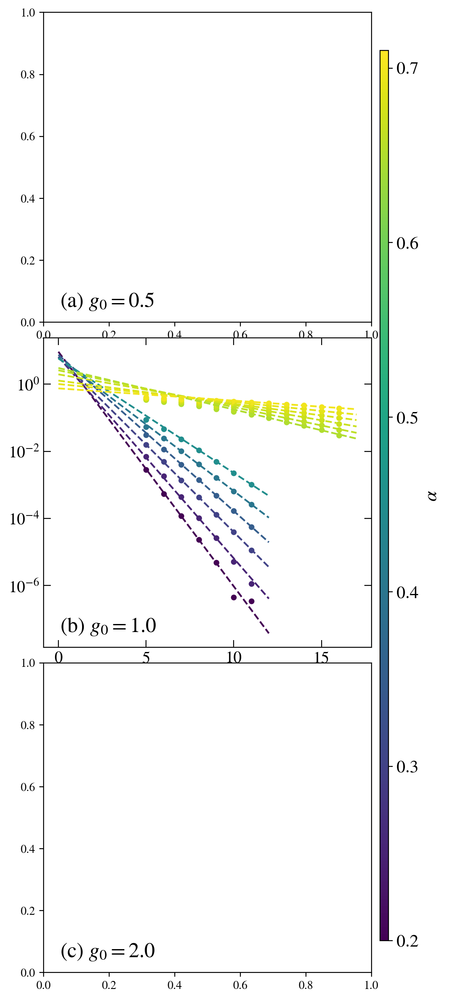

In [505]:
L_total=15

J=1


alfa=1
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0


fig2, ax_fit = plt.subplots( nrows=1, ncols=3, figsize=(15,5), dpi = 200)

fig, axes = plt.subplots( nrows=3, ncols=1, figsize=(5,15), dpi = 200)
# fig, ax = plt.subplots( nrows=1, ncols=1, figsize=(5,5), dpi = 200)

axis = axes.flatten()

alfa_vals = np.linspace(0.2, 0.45, 8)
alfa_vals = np.array( [*np.linspace(0.2, 0.45, 6), *np.linspace(0.65, 0.70, 6)] )
print(alfa_vals)

interpolate = 0

alfa_max = 0.71
p = 1       # number of last spins
nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu
sizes = np.arange(8, 17, 1 if p > 0 else 2)

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
xlab = r"$L$"

for idx1, J in enumerate([0.5, 1, 2]):
    if J != 1: continue
    
    alfa_crit = 0.75
    if J == 0.5:    alfa_crit = 0.7592779024078085; s1_crit = 0.3975596423927653; sizes = np.arange(10, 20, 1 if p > 0 else 2)
    elif J == 1:    alfa_crit = 0.7294402852322444; s1_crit = 0.5976612536491842; sizes = np.arange(8,  15, 1 if p > 0 else 2)
    elif J == 2:    alfa_crit = 0.7197704442893257; s1_crit = 0.8326330851556897; sizes = np.arange(10, 19, 1 if p > 0 else 2)
    elif J == 3:    alfa_crit = 0.71795404;         s1_crit = 0.9073984827790079; sizes = np.arange(10, 17, 1 if p > 0 else 2)
    else:           alfa_crit = 1/np.sqrt(2)
    interaction = []
    ydata = []
    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    
    norm = matplotlib.colors.Normalize(
            vmin=np.min(alfa_vals),
            vmax=alfa_max)

    # choose a colormap
    # c_m = matplotlib.cm.cool

    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])
    
    
    alfa_plot = []
    prefactor = []
    etas = []
    exponent = []
    for ii_a, alfa in enumerate(alfa_vals):
        sizes = np.arange(8,  15, 1 if p > 0 else 2) if alfa < 0.6 else np.arange(8,  20, 1 if p > 0 else 2)
        
        if alfa > alfa_max: continue
        
        entropy = np.zeros((sizes.size));  entropy.fill(np.nan)
        for ii, L_total in enumerate(sizes):
            L = L_total - N
            LA = L_total - p if p > 0 else L_total // 2
            name = base_dir + 'Entropy/Eigenstate/' + info(L=L, N=N, J=J, gamma=gamma, zeta=zeta, alfa=alfa, h=h, w=w, ext='.hdf5', scaled_disorder=scaled_disorder)
            # if not exists(name): 
            #     name = base_dir + 'Entropy/Eigenstate/' + info(L=L, N=N, J=J, gamma=gamma, zeta=zeta, alfa=alfa, h=h, w=w, ext='_beta.hdf5', scaled_disorder=scaled_disorder)
            #print(name)
            exist_S_vn = 1
            if exists(name):
                with h5py.File(name, "r") as file:
                        energies = np.array(file.get('mean energies'))
                        realis = np.array(file.get('realisations'))[0]
                        print(L, alfa, realis)
                        dim = energies.size
                        num = frac(dim)
                        if nu > 1:
                            num = min([num, int(0.1*dim)])
                        # print(dim, num)
                        E_av = np.mean(energies)
                        index_meanE = min(range(len(energies)), key=lambda i: abs(energies[i] - E_av))
                        
                        my_min = int(index_meanE - num / 2)
                        if num == dim or my_min < 0: my_min = 0;  

                        my_max = int(index_meanE + num / 2)
                        if num == dim or my_max >= dim: my_max = dim-1

                        if L_total > 16 or (2**(L_total) > 20000 and alfa < 0.65):
                            print(L_total, alfa, "Got")
                            _min = 10
                            _max = 490
                            S = np.array(file.get('entropies'))[LA]
                            entropy[ii] = np.mean(S[_min : _max])
                        else:
                            S = np.array(file.get('entropies'))[LA]
                            entropy[ii] = np.mean(S[my_min : my_max]) if my_min > 0 and my_max < dim and num < dim else np.mean(S)
                        
            else:
                print(name)
        

        xx = sizes - N
        yy = entropy

        axis[idx1].scatter(xx, yy, marker='o', s=15, color=s_m.to_rgba(alfa))
        if interpolate:
            # axis[idx1].scatter(sizes, ydata[ii_a], marker='o', s=10, color=s_m.to_rgba(alfa))
            spl = make_spline(xx, yy)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
            yy = spl(xx)
            axis[idx1].scatter(xx, yy, marker='s', s=5, color=s_m.to_rgba(alfa))
        
        try:
            ii_cut = -15 if interpolate else -4
            # xx = xx - N
            def my_fit(L, c, xi, delta):
                return c * np.exp(-(L/xi))
            pars, pconv= fit(my_fit,
                            xdata = xx[ii_cut:],
                            ydata = yy[ii_cut:],
                            maxfev = 10000)

            eta = pars[1]
            c = pars[0]
            z = pars[2]
            print("J=", J, "  alfa=", np.round(alfa, 2), "  eta=", eta, "  c=", c, "  z=", z)
            prefactor.append(c)
            etas.append(eta)
            alfa_plot.append(alfa)
            exponent.append(z)
            dense_sizes = np.linspace(0, xx[-1]+1, 1000)
            axis[idx1].plot(dense_sizes, my_fit(dense_sizes, *pars), lw=1.5, color=s_m.to_rgba(alfa), ls = '--')
        except RuntimeError:
            print(alfa)
    
    alfa_plot = np.array(alfa_plot)
    ax_fit[0].plot((alfa_crit - alfa_plot), prefactor, marker='o', label=r"$g_0=%g$"%J)
    ax_fit[1].plot((alfa_crit - alfa_plot), etas, marker='o')
    ax_fit[2].plot((alfa_crit - alfa_plot), exponent, marker='o')
    fig_help.set_plot_elements(axis[idx1], ylabel=r"$\bar{s}_{%d}$"%p if idx1 == 0 else "", xlabel=xlab, font_size=14, set_legend=False, xscale='linear', yscale='log')

fig_help.set_plot_elements(ax_fit[0], ylabel=r"$B$", xlabel=r"$\alpha_c-\alpha$", font_size=14, set_legend=True, xscale='linear', yscale='linear')
fig_help.set_plot_elements(ax_fit[1], ylabel=r"$\xi$", xlabel=r"$\alpha_c-\alpha$", font_size=14, set_legend=True, xscale='log', yscale='log')
fig_help.set_plot_elements(ax_fit[2], ylabel=r"$z$", xlabel=r"$\alpha_c-\alpha$", font_size=14, set_legend=True, xscale='linear', yscale='linear')

fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$\alpha$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

# for aa in [axis]:
#     for ax in np.array(aa).flatten():
#         ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))

axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[1].annotate(r"(b) $g_0=1.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[2].annotate(r"(c) $g_0=2.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')

fig.subplots_adjust(wspace = 0.15, hspace=0.05)

J= 0.5   alfa= 0.65   eta= 4.9598329058394475   c= 2.4669926831265445
J= 0.5   alfa= 0.66   eta= 5.269086148628246   c= 2.1763500147647266
J= 0.5   alfa= 0.67   eta= 5.513726195978408   c= 2.0004938895616466
J= 0.5   alfa= 0.68   eta= 5.788342660308502   c= 1.822837488813905
J= 0.5   alfa= 0.69   eta= 6.003037213021095   c= 1.7049416755908866
J= 0.5   alfa= 0.7   eta= 6.2317169317744545   c= 1.5876996658101146
J= 1   alfa= 0.65   eta= 3.2479075934972332   c= 1.7315109627971312
J= 1   alfa= 0.66   eta= 3.3644005294240227   c= 1.5444765446385127
J= 1   alfa= 0.67   eta= 3.4505065578259053   c= 1.4247395545715642
J= 1   alfa= 0.68   eta= 3.4932569570277505   c= 1.372349070785589
J= 1   alfa= 0.69   eta= 3.5192191744291708   c= 1.3335930192832763
J= 1   alfa= 0.7   eta= 3.5411810377202704   c= 1.2819737629853318
J= 2   alfa= 0.65   eta= 2.1431356203780183   c= 1.234221506060715
J= 2   alfa= 0.66   eta= 2.1839734594768925   c= 1.1326928203526914
J= 2   alfa= 0.67   eta= 2.2138025485164032  

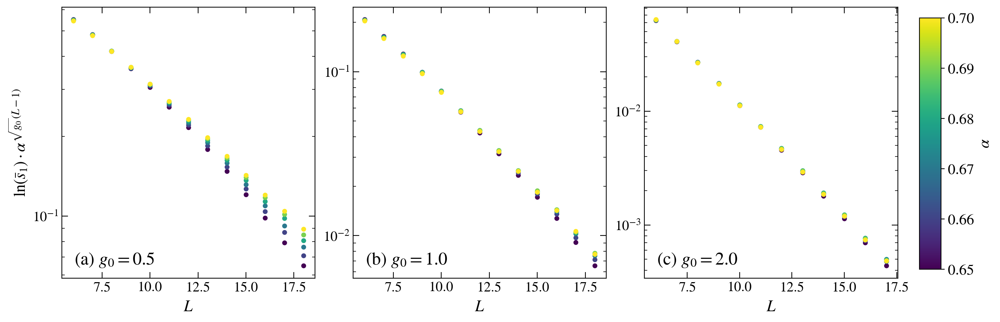

In [50]:
L_total=15

J=2


alfa=1
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0


# fig2, ax_fit = plt.subplots( nrows=1, ncols=2, figsize=(10,5), dpi = 200)

fig, axes = plt.subplots( nrows=1, ncols=3, figsize=(15,5), dpi = 200)
# fig, ax = plt.subplots( nrows=1, ncols=1, figsize=(5,5), dpi = 200)

axis = axes.flatten()

def rescale(xin, alfa, alfac, L):
    return xin #* np.exp( - 5*(alfac - alfa) * (L-N - 1)) / (L - N - 1)**( 20*(alfac - alfa))

interpolate = 0

alfa_max = 0.7
p = 1       # number of last spins
nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu
sizes = np.arange(4, 17, 1 if p > 0 else 2)

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    


collapse_nu = 0

b_const = [25, 20, 28]
gam = [0.66, 0.62, 0.75]

for idx1, J in enumerate([0.5, 1, 2]):

    alfa_crit = 0.75
    if J == 0.5:    alfa_crit = 0.77;   sizes = np.arange(6, 19, 1)
    elif J == 1:    alfa_crit = 0.74;   sizes = np.arange(6, 19, 1)
    elif J == 2:    alfa_crit = 0.72;   sizes = np.arange(6, 18, 1)
    elif J == 3:    alfa_crit = 0.71;   sizes = np.arange(6, 17, 1)
    else:           alfa_crit = 1/np.sqrt(2)
    interaction = []
    ydata = []
    for L_total in sizes:
        L = L_total - N
        LA = L_total - p if p > 0 else L_total // 2

        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                Skurwa       = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
                Sinfo_vN     = np.array(file.get('vN info entropy'))
        else:
            print(name_out)
        
        entropy = Skurwa[LA] / ( p*np.log(2) ) if p > 0 else Skurwa[LA] / page(LA, L_total - LA)

        interaction.append(alfa_vals)
        ydata.append(entropy)
        

    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    
    norm = matplotlib.colors.Normalize(
            vmin=np.min(alfa_vals),
            vmax=alfa_max)

    # choose a colormap
    # c_m = matplotlib.cm.cool

    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])

    ydata = np.transpose( np.array(ydata) )
    
    
    alfa_plot = []
    prefactor = []
    etas = []
    for ii_a, alfa in enumerate(alfa_vals):
        if alfa > alfa_max: continue

        xx = (sizes - N) * (alfa_crit - alfa)**gam[idx1] if collapse_nu else sizes
        yy = ydata[ii_a] if collapse_nu else np.log(1/ydata[ii_a])  * alfa**( (sizes - N - 1) * J**0.5 )
        axis[idx1].scatter(xx, rescale(yy, alfa, alfa_crit, xx), marker='o', s=15, color=s_m.to_rgba(alfa))
        if interpolate:
            # axis[idx1].scatter(sizes, ydata[ii_a], marker='o', s=10, color=s_m.to_rgba(alfa))
            spl = make_spline(xx, yy)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
            yy = spl(xx)
            print(rescale(yy, alfa, alfa_crit, xx))
            axis[idx1].scatter(xx, rescale(yy, alfa, alfa_crit, xx), marker='s', s=5, color=s_m.to_rgba(alfa))
        
        try:
            yy = rescale(yy, alfa, alfa_crit, xx)
            ii_cut = -15 if interpolate else -6
            # xx = xx - N
            def my_fit(L, c, eta):
                return c * np.exp(-(L / eta))
            pars, pconv= fit(my_fit,
                            xdata = xx[ii_cut:],
                            ydata = yy[ii_cut:],
                            maxfev = 10000)

            eta = pars[1]
            c = pars[0]
            # z = pars[2]
            print("J=", J, "  alfa=", np.round(alfa, 2), "  eta=", eta, "  c=", c)#, "  z=", z)
            prefactor.append(c)
            etas.append(eta)
            alfa_plot.append(alfa)
            dense_sizes = np.linspace(xx[ii_cut], xx[-1]+1, 1000)
            # axis[idx1].plot(dense_sizes, my_fit(dense_sizes, *pars), lw=1.5, color=s_m.to_rgba(alfa), ls = '--')
        except RuntimeError:
            print(alfa)
    
    # alfa_plot = np.array(alfa_plot)
    # ax_fit[0].plot(alfa_plot - alfa_crit, prefactor, marker='o', label=r"$g_0=%g$"%J)
    # ax_fit[1].plot(np.log(alfa_plot - alfa_crit), etas, marker='o')
    xlab = r"$L(\alpha_c - \alpha)^\nu$" if collapse_nu else r"$L+N$"
    ylab = (r"$\bar{s}_{%d}$"%p if collapse_nu else r"$\ln(\bar{s}_{%d})\cdot \alpha^{\sqrt{g_0}(L-1)}$"%p) if idx1 == 0 else ""
    fig_help.set_plot_elements(axis[idx1], ylabel=ylab, xlabel=xlab, font_size=14, set_legend=False, xscale='linear', yscale='log')

fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$\alpha$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

# for aa in [axis]:
#     for ax in np.array(aa).flatten():
#         ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))

axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[1].annotate(r"(b) $g_0=1.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[2].annotate(r"(c) $g_0=2.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')

fig.subplots_adjust(wspace = 0.15, hspace=0.05)

In [75]:
L = 16

print([page(LA, L-LA) for LA in range(L+1)])

[0.0, 0.6931242924345593, 1.3861799204929603, 2.0789608910467283, 2.770643231581964, 3.4579310520430697, 4.127640792207653, 4.7270382111860645, 5.045186345418506, 4.7270382111860645, 4.127640792207653, 3.4579310520430697, 2.770643231581964, 2.0789608910467283, 1.3861799204929603, 0.6931242924345593, 0.0]


# TESTING COLLAPSE

### CRITICAL POINT FROM CROSSING

[0.65 0.66 0.67 0.68 0.69 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78
 0.79 0.8  0.81 0.82 0.83 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92
 0.93 0.94]


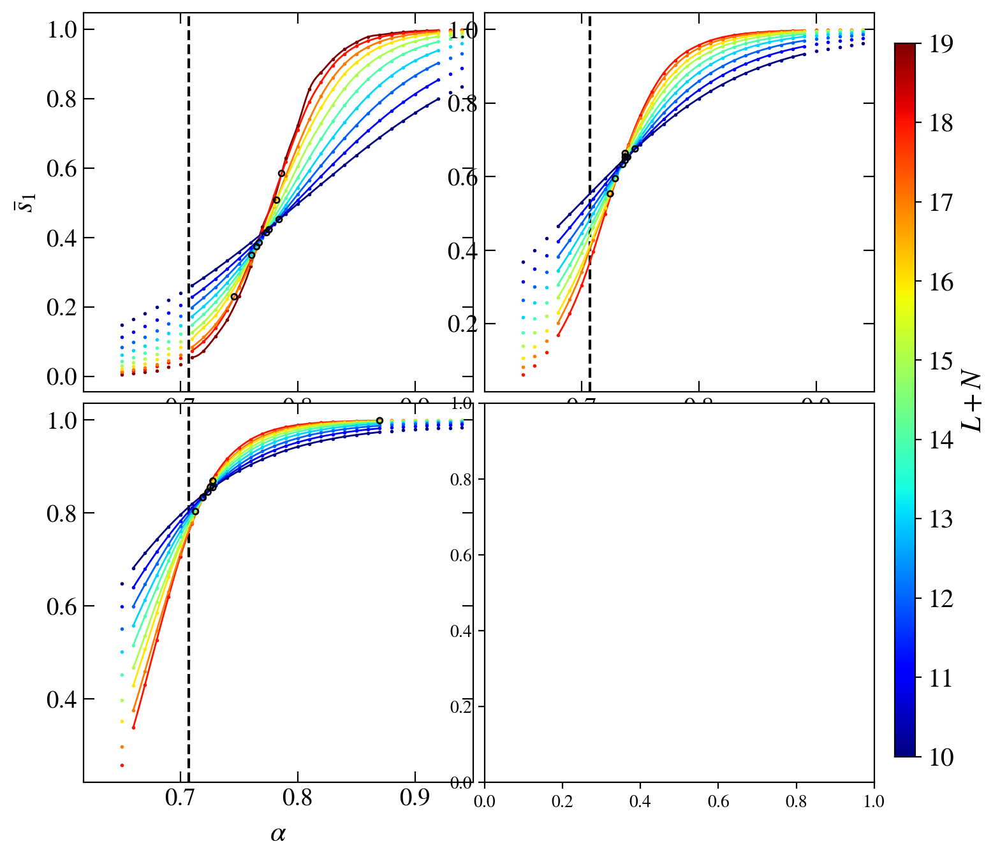

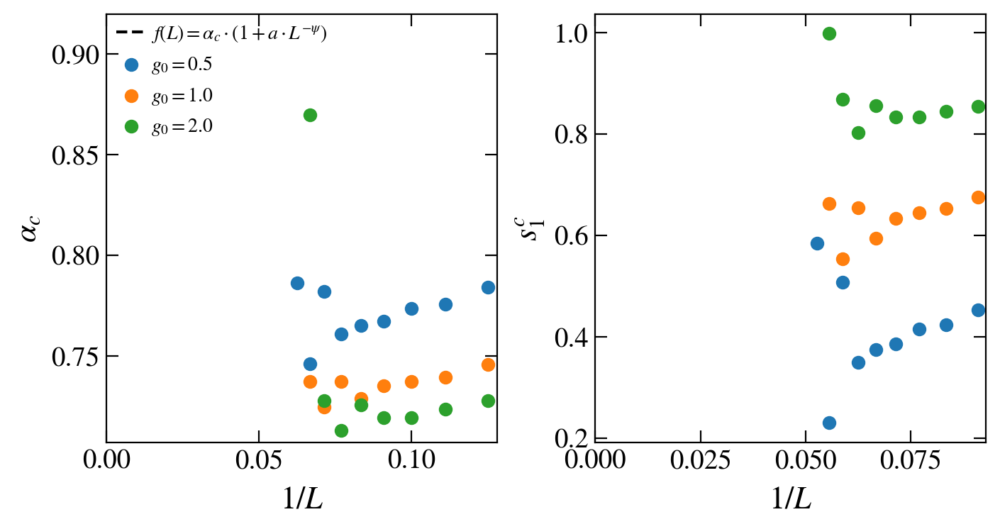

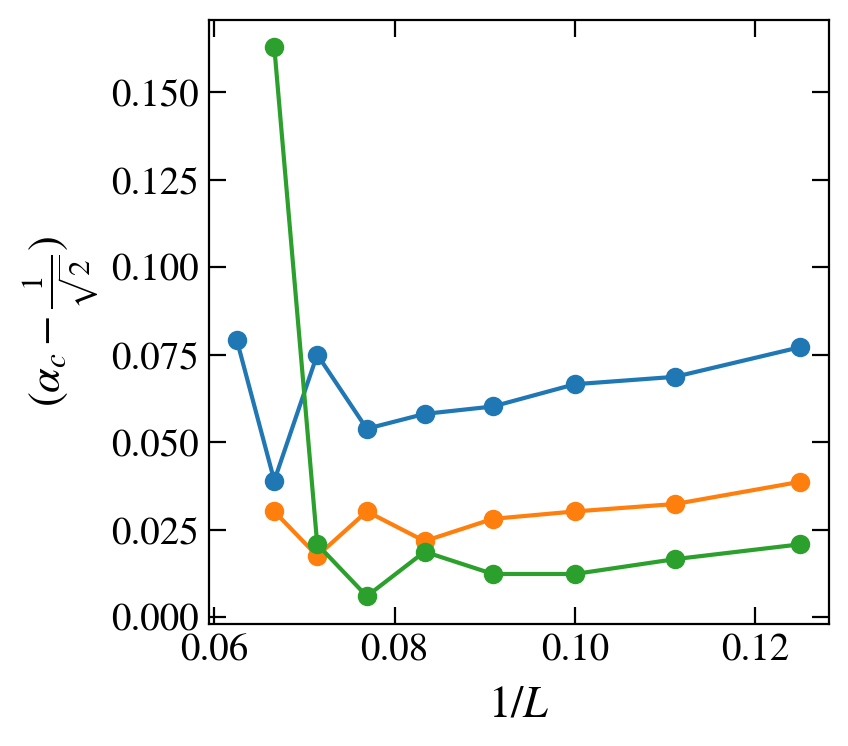

In [466]:
colors_ls = (list(mcolors.TABLEAU_COLORS)[:500])
colors_ls_cyc = itertools.cycle(colors_ls)

L_total=15

J=3
alfa=1.0
h=1.0
w=0.5
zeta=0.2
N=3
gamma=1.0
ini_ave=0
L = L_total - N

scaled_disorder = 0

fit_crossings = 0

interpolate_or_fit = 1

alfa_vals = np.linspace(0.65, 0.94, 30)
print(alfa_vals)

delta = 0.15
sizes = np.arange(10, 20, 1)

norm = matplotlib.colors.Normalize(
    vmin=np.min(sizes),
    vmax=np.max(sizes))

def my_fit(x, a, b, x0):
    return (a / (a + np.exp(-b * (x - x0))))
        
# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap='jet', norm=norm)
s_m.set_array([])


fig, axes = plt.subplots( nrows=2, ncols=2, figsize=(8,8), dpi = 200)#, sharex=True, sharey=True)
axes = axes.flatten()

fig2, axx = plt.subplots( nrows=1, ncols=2, figsize=(8,4), dpi = 200)
ax = axx[0]
ax2 = axx[1]

fig3, ax_test = plt.subplots( nrows=1, ncols=1, figsize=(4,4), dpi = 200)
for ii_J, J in enumerate([0.5, 1, 2]):
    alfa_crit = 0.710
    if J == 0.5:    alfa_crit = 0.77;   sizes = np.arange(10, 20, 1)
    elif J == 1:    alfa_crit = 0.74;   sizes = np.arange(10, 19, 1)
    elif J == 2:    alfa_crit = 0.72;   sizes = np.arange(10, 19, 1)
    elif J == 3:    alfa_crit = 0.71;   sizes = np.arange(10, 17, 1)
    else:           alfa_crit = 1/np.sqrt(2)
    # sizes = np.arange(15, 18, 1)
    cross_col = next(colors_ls_cyc)
    axis = axes[ii_J]
# for J in [1]:
    sub_sizes = np.arange(0, L+1)


    interpolate = 0

    nu = 500
    frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

    folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
    folder = folder_base + base_dir[3:] + f"nu={nu}/"
    os.makedirs(folder_base, exist_ok=True)
    os.makedirs(folder, exist_ok=True)
        
    xlab = r"$\alpha$"

    
    interaction = []
    ydata = []
    found_sizes = []
    for L_total in sizes:
        sub_sizes = np.arange(0, L_total+1)
        L = L_total - N
        LA = L_total - 1
        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            found_sizes.append(L_total) 
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
            S = entropy[LA] / page(LA, L_total-LA)
            indices = np.where(np.logical_and(alfa_vals >= 0.71, alfa_vals <= 0.79))
            interaction.append(alfa_vals)
            ydata.append(S) 
        else:
            print(name_out)
    
    found_sizes = np.array(found_sizes)
    # par, crit_pars, costfun, status = cost.get_crit_points(x=np.array(disorder), y=np.array(gaps), vals=sizes - N, crit_fun='free', scaling_ansatz='classic', seed=412438923)
    # print(crit_pars)
    
    # rescale_fun = cost.resc_functions_dict['classic']
    # critical_fun = cost.crit_functions_dict['free']
    # xlab = cost.scale_ansatz_label['classic']('W')

    xx_data = []
    yy_data = []
    for ii, L in enumerate(found_sizes - N):
        col = s_m.to_rgba(L + N)
        axis.plot(interaction[ii], ydata[ii], marker='o', markersize=1, lw=0, ls=':', label=r"$L+N=%d$"%(L+N), color=col, markerfacecolor='None', zorder=100-L)
        
        indices = np.where(np.logical_and(interaction[ii] >= alfa_crit - 0.06, interaction[ii] < alfa_crit + delta))[0]
        xx = interaction[ii][indices]
        yy = ydata[ii][indices]
        
        alfa_vals  = np.linspace(xx[0], xx[-1], 100)
        
        if interpolate_or_fit:
            entropy_spl = make_spline(xx, yy)
            # entropy_spl = InterpolateSpline(xx, yy)
            S_interpol = entropy_spl(alfa_vals)
        else:
            pars, pconv = fit(my_fit,
                        xdata = xx,
                        ydata = yy,
                        maxfev = 8000)
            print(J, "s1_c:  ", pars[2])
            S_interpol = my_fit(alfa_vals, *pars)
            
        axis.plot(alfa_vals, S_interpol, lw=1, color=col, zorder=100-2*L)
                
        xx_data.append(alfa_vals)
        yy_data.append(S_interpol)
            
        
    axis.set_xlim(0.95*min(np.array(interaction).flatten()), 1.01*max(np.array(interaction).flatten()))
    axis.axvline(x=1/np.sqrt(2), ls='--', c='k')
    
    alfa_cross = []
    s1_cross = []
    for ii in range(1, found_sizes.size):
        idx = np.argmin( np.abs(yy_data[ii] - yy_data[ii-1]) )
        alfa_cross.append(xx_data[ii][idx])
        s1_cross.append(yy_data[ii][idx])
    
    axis.scatter(alfa_cross, s1_cross, color='k', s=10, facecolor='None', zorder=100)

    # CROSSING POINTS
    xfit = 1 / (found_sizes[1:])
    if fit_crossings:
        def fitt(x, psi, alfa_c, const):
            return alfa_c * (1 + const * x**psi)
        
        xfit = 1 / (found_sizes[1:]-N)
        try:
            pars, pconv = fit(fitt,
                            xdata = xfit,
                            ydata = alfa_cross, maxfev = 10000)
            print(J, "alfa_c:  ", *pars)
            Linv = np.linspace(0, max(xfit), 100)
            ax.plot(Linv, fitt(Linv, *pars), ls='--', color=cross_col)
            
            axis.axvline(x=pars[1], ls=':', c='k', label=r"$\alpha(L=\infty)}$")
            ax.scatter(1 / (found_sizes[1:]-N), alfa_cross, label = r"$g_0=%.1f;\quad\alpha_c={%.3f};\quad\psi=-%.2f\quad a=%.2f$"%(J, pars[1], pars[0], pars[2]), color=cross_col)
        except RuntimeError:
            ax.scatter(1 / (found_sizes[1:]-N), alfa_cross, label = r"$g_0=%.1f$"%(J), color=cross_col)
    else:
        ax.scatter(1 / (found_sizes[1:]-N), alfa_cross, label = r"$g_0=%.1f$"%(J,), color=cross_col)
        
    ax_test.plot(1 / (found_sizes[1:]-N), (alfa_cross - 1/np.sqrt(2)), label = r"$g_0=%.1f$"%(J), color=cross_col, marker='o')
    
    if fit_crossings:
        def fitt2(x, s1_c, const, gam):
            return s1_c + const * x**gam

        pars, pconv = fit(fitt2,
                        xdata = xfit,
                        ydata = s1_cross, maxfev = 10000)
        print(J, "s1_c:  ", *pars)
        Linv = np.linspace(0, max(xfit), 100)
        ax2.plot(Linv, fitt2(Linv, *pars), ls='--', color=cross_col)
        
    ax2.scatter(1 / (found_sizes[1:]), s1_cross, color=cross_col)
    
    fig_help.set_plot_elements(axis, ylabel=r"$\bar{s}_{1}$" if ii_J==0 else "", xlabel=xlab, font_size=14, set_legend=False)

ax.plot(np.nan, np.nan, ls='--', c='k', label=r"$f(L)=\alpha_c\cdot(1+a\cdot L^{-\psi})$")
fig_help.set_plot_elements(ax, ylabel=r"$\alpha_c$", xlabel=r"$1/L$", font_size=14, set_legend=False, xscale='linear', yscale='linear')
ax.set_xlim(0.0, None)
ax.set_ylim(1/np.sqrt(2), 0.92)
fig_help.set_legend(ax, loc = 'upper left', fontsize=10, anchor=(-0.02, 1.02))
    
fig_help.set_plot_elements(ax2, ylabel=r"$s_1^c$", xlabel=r"$1/L$", font_size=14, set_legend=False, xscale='linear', yscale='linear')
ax2.set_xlim(0, None)
# ax2.set_ylim(1/np.sqrt(2), 0.88)

fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$L+N$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

fig.subplots_adjust(wspace = 0.03, hspace=0.03)
fig2.subplots_adjust(wspace = 0.25, hspace=0.25)

fig_help.set_plot_elements(ax_test, ylabel=r"$(\alpha_c-\frac{1}{\sqrt{2}})$", xlabel=r"$1/L$", font_size=14, set_legend=False, xscale='linear', yscale='linear')

# write out ansatxz and fitting parameters in legend of lower plot
# g0, L>=13
# g0>=1: L>=12

fig.savefig("plots_beta/Fig_raw_s1.pdf", bbox_inches = 'tight', pad_inches=0.02)
fig2.savefig("plots_beta/Fig_alfa_extrapolated.pdf", bbox_inches = 'tight', pad_inches=0.02)

### CRITICAL POINT FROM CUT

[0.65 0.66 0.67 0.68 0.69 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78
 0.79 0.8  0.81 0.82 0.83 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92
 0.93 0.94]
0.1 ALFA CROSSING ALL L [0.905015015015015, 0.9044144144144145, 0.9006606606606608, 0.9015615615615616, 0.8963063063063064, 0.8970570570570571]
0.1 alfa_c:   1.0 0.8845176698499674 0.16945828450164546
0.1 s1_c:   0.13002744969996316 294919019.1228479 15.46888517896864
0.2 ALFA CROSSING ALL L [0.8587687687687687, 0.8586186186186187, 0.8538138138138138, 0.852012012012012, 0.8494594594594594, 0.849009009009009]
0.2 alfa_c:   1.0 0.8332460586004552 0.2245244311165652
0.2 s1_c:   0.23004288080115057 -0.005294057397299191 7.183436686037563
0.3 ALFA CROSSING ALL L [0.8415315315315316, 0.8362762762762763, 0.8317717717717718, 0.8292192192192193, 0.8251651651651651, 0.8227627627627627]
0.3 alfa_c:   1.0 0.7969816538376154 0.3934652573402929
0.3 s1_c:   1.4146811423747996 -1.066051077561495 0.0005940295053162417
0.5 ALFA CROSSING ALL L [0.800970

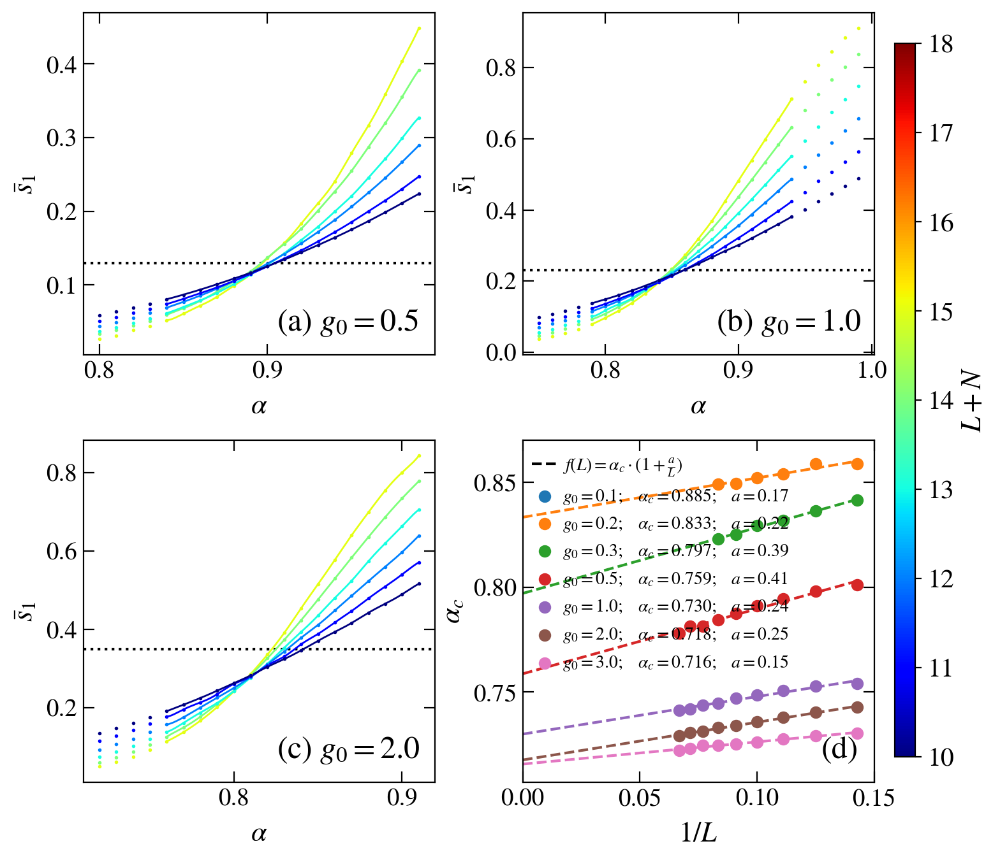

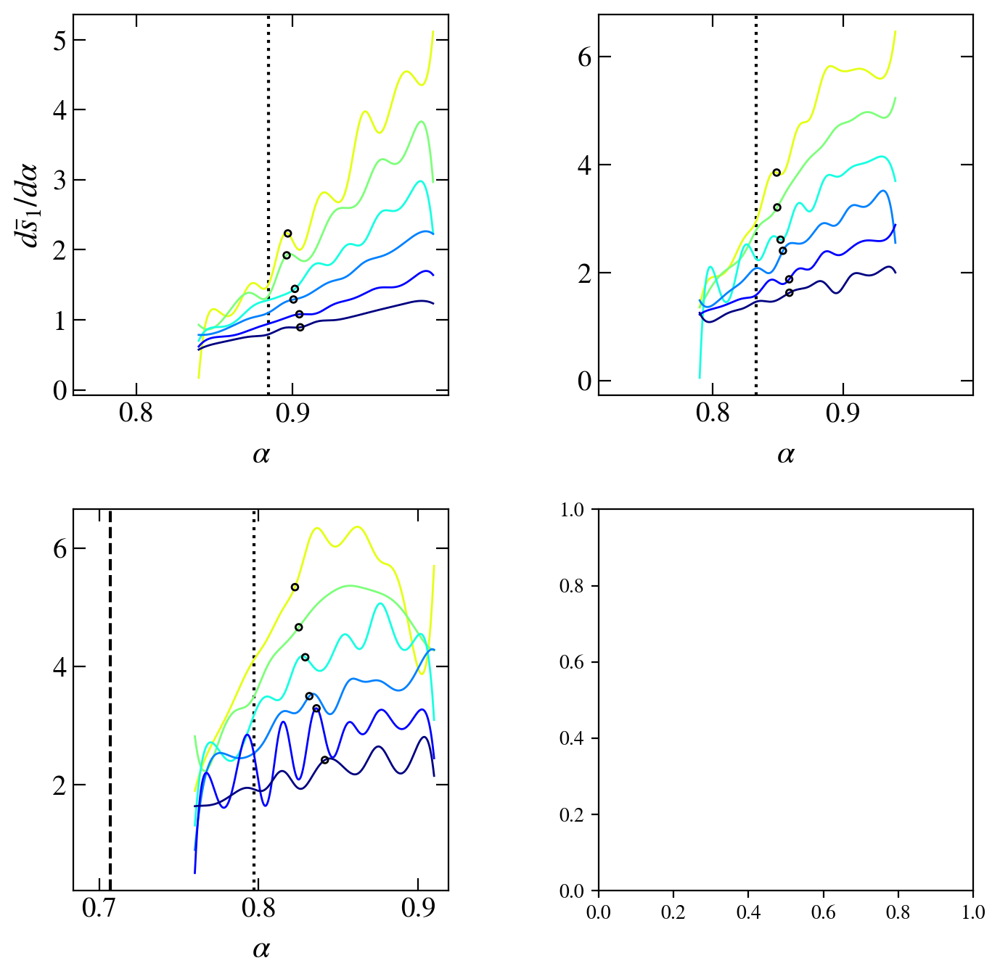

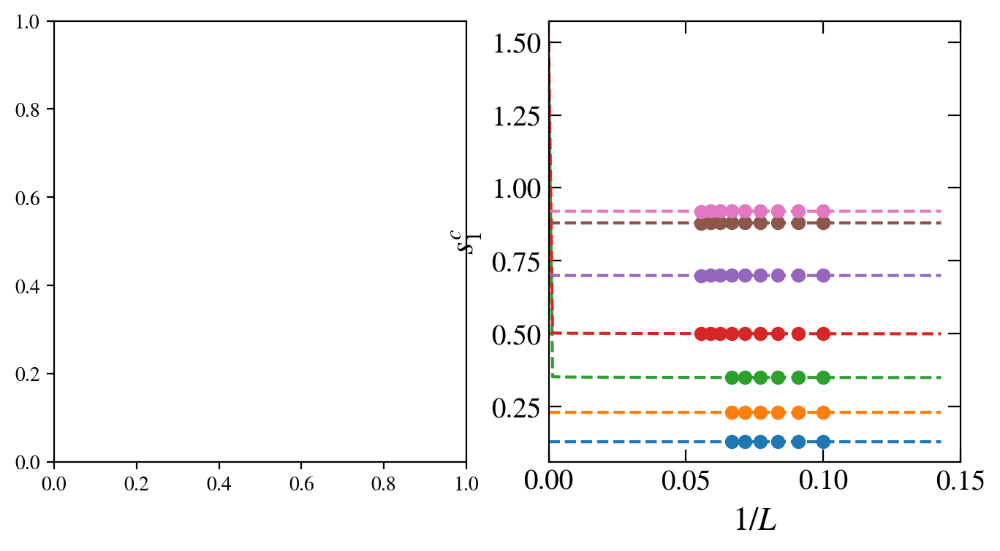

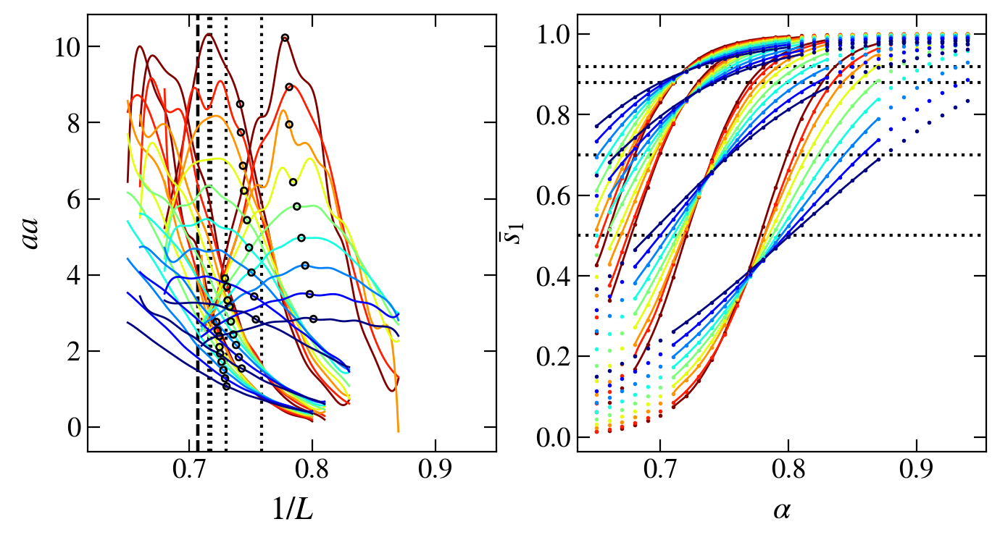

In [207]:
colors_ls = (list(mcolors.TABLEAU_COLORS)[:500])
colors_ls_cyc = itertools.cycle(colors_ls)

L_total=15

J=3
alfa=1.0
h=1.0
w=0.5
zeta=0.2
N=3
gamma=1.0
ini_ave=0
L = L_total - N

scaled_disorder = 0

fit_crossings = 1

interpolate_or_fit = 1

alfa_vals = np.linspace(0.65, 0.94, 30)
print(alfa_vals)

delta = 0.1
sizes = np.arange(10, 19, 1)

norm = matplotlib.colors.Normalize(
    vmin=np.min(sizes),
    vmax=np.max(sizes))

def my_fit(x, a, b, x0):
    return (a / (a + np.exp(-b * (x - x0))))
    # return (1 / (1 + a * (np.abs(x - x0)**b)))
    # return (erf(b * (x - x0)) + 1) / 2
        
# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap='jet', norm=norm)
s_m.set_array([])

fig2, axes2 = plt.subplots( nrows=2, ncols=2, figsize=(8,8), dpi = 200)#, sharex=True, sharey=True)
axes2 = axes2.flatten()

fig, axes = plt.subplots( nrows=2, ncols=2, figsize=(8,8), dpi = 200)#, sharex=True, sharey=True)
axes = axes.flatten()

fig22, axx = plt.subplots( nrows=1, ncols=2, figsize=(8,4), dpi = 200)
ax = axx[0]
ax2 = axx[1]

fig3, ax_test = plt.subplots( nrows=1, ncols=2, figsize=(8,4), dpi = 200)
for ii_J, J in enumerate([0.1, 0.2, 0.3, 0.5, 1, 2, 3]):
    alfa_crit = 0.710
    if J == 0.1:      alfa_crit = 0.9;   sizes = np.arange(10, 16, 1);   s1_cut = 0.13
    elif J == 0.2:    alfa_crit = 0.85;   sizes = np.arange(10, 16, 1);   s1_cut = 0.23
    elif J == 0.3:    alfa_crit = 0.82;   sizes = np.arange(10, 16, 1); s1_cut = 0.35
    elif J == 0.5:  alfa_crit = 0.77;   sizes = np.arange(10, 19, 1); s1_cut = 0.5
    elif J == 1:    alfa_crit = 0.74;   sizes = np.arange(10, 19, 1); s1_cut = 0.7
    elif J == 2:    alfa_crit = 0.72;   sizes = np.arange(10, 19, 1); s1_cut = 0.88
    elif J == 3:    alfa_crit = 0.71;   sizes = np.arange(10, 19, 1); s1_cut = 0.92
    else:           alfa_crit = 1/np.sqrt(2)
    # sizes = np.arange(15, 18, 1)
    cross_col = next(colors_ls_cyc)
    axis = axes[ii_J] if ii_J < 3 else ax_test[0]
    axis2 = axes2[ii_J] if ii_J < 3 else ax_test[1]
# for J in [1]:
    sub_sizes = np.arange(0, L+1)


    interpolate = 0

    nu = 500
    frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

    folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
    folder = folder_base + base_dir[3:] + f"nu={nu}/"
    os.makedirs(folder_base, exist_ok=True)
    os.makedirs(folder, exist_ok=True)
        
    xlab = r"$\alpha$"

    
    interaction = []
    ydata = []
    found_sizes = []
    for L_total in sizes:
        sub_sizes = np.arange(0, L_total+1)
        L = L_total - N
        LA = L_total - 1
        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            found_sizes.append(L_total) 
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
            S = entropy[LA] / page(LA, L_total-LA)
            
            indices = np.transpose(np.argwhere(~np.isnan(S)))[0]
            interaction.append(alfa_vals[indices])
            ydata.append(S[indices]) 
        else:
            print(name_out)
    
    found_sizes = np.array(found_sizes)
    # par, crit_pars, costfun, status = cost.get_crit_points(x=np.array(disorder), y=np.array(gaps), vals=sizes - N, crit_fun='free', scaling_ansatz='classic', seed=412438923)
    # print(crit_pars)
    
    # rescale_fun = cost.resc_functions_dict['classic']
    # critical_fun = cost.crit_functions_dict['free']
    # xlab = cost.scale_ansatz_label['classic']('W')

    xx_data = []
    yy_data = []
    yy_deriv_data = []
    for ii, L in enumerate(found_sizes - N):
        col = s_m.to_rgba(L + N)
        axis2.plot(interaction[ii], ydata[ii], marker='o', markersize=1, lw=0, ls=':', label=r"$L+N=%d$"%(L+N), color=col, markerfacecolor='None', zorder=100-L)
        
        indices = np.where(np.logical_and(interaction[ii] >= alfa_crit - 0.06, interaction[ii] < alfa_crit + delta))[0]
        xx = interaction[ii][indices]
        yy = ydata[ii][indices]
        
        alfa_vals  = np.linspace(xx[0], xx[-1], 1000)
        
        if interpolate_or_fit:
            entropy_spl = make_spline(xx, yy, k=5)
            # entropy_spl = InterpolateSpline(xx, yy, k=5)
            S_interpol = entropy_spl(alfa_vals)
            deriv = entropy_spl.derivative(1)(alfa_vals)
        else:
            pars, pconv = fit(my_fit,
                        xdata = xx,
                        ydata = yy,
                        maxfev = 100000
            )
            print(J, "pars:  ", *pars)
            S_interpol = my_fit(alfa_vals, *pars)
            deriv = np.gradient( S_interpol, alfa_vals[1] - alfa_vals[0] )
        
        axis2.plot(alfa_vals, S_interpol, lw=1, color=col, zorder=100-2*L)
        
        axis.plot(alfa_vals, deriv, lw=1, color=col, zorder=100-2*L)
                
        xx_data.append(alfa_vals)
        yy_data.append(S_interpol)
        yy_deriv_data.append(deriv)
            
        
    axis.set_xlim(0.95*min(np.array(interaction).flatten()), 1.01*max(np.array(interaction).flatten()))
    axis.axvline(x=1/np.sqrt(2), ls='--', c='k')
    
    alfa_cross = []
    s1_cross = []
    s1_der_cross = []
    for ii in range(0, found_sizes.size):
        # idx = np.argmax( np.abs(yy_deriv_data[ii]) )
        idx = np.argmin( np.abs(yy_data[ii] - s1_cut) )
        alfa_cross.append(xx_data[ii][idx])
        s1_cross.append(yy_data[ii][idx])
        s1_der_cross.append(yy_deriv_data[ii][idx])
    
    print(J, "ALFA CROSSING ALL L", alfa_cross)
    axis.scatter(alfa_cross, s1_der_cross, color='k', s=10, facecolor='None', zorder=100)

    axis2.axhline(y=s1_cut, ls=':', c='k')
    
    # CROSSING POINTS
    xfit = 1 / (found_sizes)
    if fit_crossings:
        def fitt(x, psi, alfa_c, const):
            return alfa_c * (1 + const * x)
        
        xfit = 1 / (found_sizes-N)
        try:
            pars, pconv = fit(fitt,
                            xdata = xfit,
                            ydata = alfa_cross, maxfev = 10000)
            print(J, "alfa_c:  ", *pars)
            Linv = np.linspace(0, max(xfit), 100)
            axes2[3].plot(Linv, fitt(Linv, *pars), ls='--', color=cross_col)
            
            axis.axvline(x=pars[1], ls=':', c='k', label=r"$\alpha(L=\infty)}$")
            # axis[3].scatter(1 / (found_sizes-N), alfa_cross, label = r"$g_0=%.1f;\quad\alpha_c={%.3f};\quad\psi=-%.2f\quad a=%.2f$"%(J, pars[1], pars[0], pars[2]), color=cross_col)
            axes2[3].scatter(1 / (found_sizes-N), alfa_cross, label = r"$g_0=%.1f;\quad\alpha_c={%.3f};\quad a=%.2f$"%(J, pars[1], pars[2]), color=cross_col)
        except RuntimeError:
            axes2[3].scatter(1 / (found_sizes-N), alfa_cross, label = r"$g_0=%.1f$"%(J), color=cross_col)
    else:
        axes2[3].scatter(1 / (found_sizes-N), alfa_cross, label = r"$g_0=%.1f$"%(J,), color=cross_col)
        
    # ax_test.plot(1 / (found_sizes-N), (alfa_cross - 1/np.sqrt(2)), label = r"$g_0=%.1f$"%(J), color=cross_col, marker='o')
    
    if fit_crossings:
        def fitt2(x, s1_c, const, gam):
            return s1_c + const * x**gam

        pars, pconv = fit(fitt2,
                        xdata = xfit,
                        ydata = s1_cross, maxfev = 10000)
        print(J, "s1_c:  ", *pars)
        Linv = np.linspace(0, max(xfit), 100)
        ax2.plot(Linv, fitt2(Linv, *pars), ls='--', color=cross_col)
        
    ax2.scatter(1 / (found_sizes), s1_cross, color=cross_col)
    
    
    fig_help.set_plot_elements(axis2, ylabel=r"$\bar{s}_{1}$", xlabel=xlab, font_size=14, set_legend=False)
    fig_help.set_plot_elements(axis, ylabel=r"$d\bar{s}_{1}/d\alpha$" if ii_J==0 else "", xlabel=xlab, font_size=14, set_legend=False)

axes2[3].plot(np.nan, np.nan, ls='--', c='k', label=r"$f(L)=\alpha_c\cdot(1+\frac{a}{L})$")
fig_help.set_plot_elements(axes2[3], ylabel=r"$\alpha_c$", xlabel=r"$1/L$", font_size=14, set_legend=False, xscale='linear', yscale='linear')
axes2[3].set_xlim(0.0, None)
axes2[3].set_ylim(1/np.sqrt(2), 0.87)
fig_help.set_legend(axes2[3], loc = 'upper left', fontsize=10, anchor=(-0.02, 1.0))
    
fig_help.set_plot_elements(ax2, ylabel=r"$s_1^c$", xlabel=r"$1/L$", font_size=14, set_legend=False, xscale='linear', yscale='linear')
ax2.set_xlim(0, None)
# ax2.set_ylim(1/np.sqrt(2), 0.88)

fig2.subplots_adjust(right=0.9)
cbar_ax = fig2.add_axes([0.92, 0.15, 0.02, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig2.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$L+N$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

fig.subplots_adjust(wspace = 0.4, hspace=0.3)
fig2.subplots_adjust(wspace = 0.25, hspace=0.25)

fig_help.set_plot_elements(ax_test[0], ylabel=r"$aa$", xlabel=r"$1/L$", font_size=14, set_legend=False, xscale='linear', yscale='linear')

axes2[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.55, 0.07), xycoords='axes fraction')
axes2[1].annotate(r"(b) $g_0=1.0$", fontsize=18, xy=(0.55, 0.07), xycoords='axes fraction')
axes2[2].annotate(r"(c) $g_0=2.0$", fontsize=18, xy=(0.55, 0.07), xycoords='axes fraction')
axes2[3].annotate(r"(d)", fontsize=18, xy=(0.85, 0.07), xycoords='axes fraction')

# write out ansatxz and fitting parameters in legend of lower plot
# g0, L>=13
# g0>=1: L>=12

# fig.savefig("plots_beta/Fig_raw_s1.pdf", bbox_inches = 'tight', pad_inches=0.02)
fig2.savefig("plots_beta/FigS2.pdf", bbox_inches = 'tight', pad_inches=0.02)

[0.65 0.66 0.67 0.68 0.69 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78
 0.79 0.8  0.81 0.82 0.83 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92
 0.93 0.94]
0.5 ALFA CROSSING ALL L [0.8187487487487487, 0.8123423423423423, 0.806096096096096, 0.8012912912912912, 0.7961661661661661, 0.7920020020020019, 0.7875175175175174, 0.7868768768768768, 0.7828728728728728]
0.5 alfa_c:   1.0 0.7471413568974736 0.7218733404048145
0.5 ALFA CROSSING ALL L [0.8009709709709709, 0.7979279279279279, 0.7942442442442441, 0.7912012012012011, 0.7875175175175174, 0.7844744744744744, 0.7811111111111111, 0.7812712712712712, 0.7779079079079079]
0.5 alfa_c:   1.0 0.7525917680773875 0.5103909051016137
0.5 ALFA CROSSING ALL L [0.7654154154154154, 0.7686186186186186, 0.7698998998998998, 0.7705405405405404, 0.7698998998998998, 0.7694194194194194, 0.7687787787787788, 0.7695795795795795, 0.7674974974974974]
0.5 alfa_c:   1.0 0.7634974500511235 0.09297571406562095
0.5 ALFA CROSSING ALL L [0.7264964964964965, 0.7365865865865865

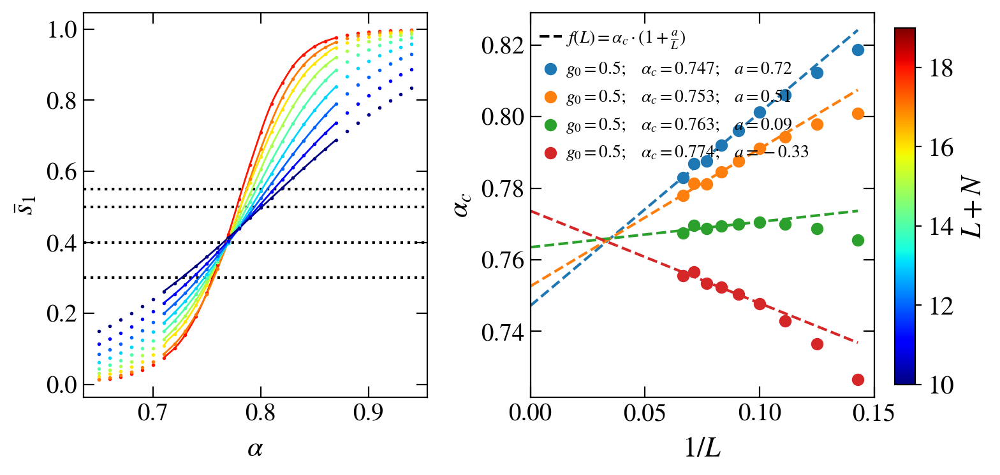

In [260]:
colors_ls = (list(mcolors.TABLEAU_COLORS)[:500])
colors_ls_cyc = itertools.cycle(colors_ls)

L_total=15

J=0.5
alfa=1.0
h=1.0
w=0.5
zeta=0.2
N=3
gamma=1.0
ini_ave=0
L = L_total - N

scaled_disorder = 0

fit_crossings = 1

interpolate_or_fit = 1

alfa_vals = np.linspace(0.65, 0.94, 30)
print(alfa_vals)

delta = 0.1
sizes = np.arange(10, 20, 1)

norm = matplotlib.colors.Normalize(
    vmin=np.min(sizes),
    vmax=np.max(sizes))

def my_fit(x, a, b, x0):
    return (a / (a + np.exp(-b * (x - x0))))
    # return (1 / (1 + a * (np.abs(x - x0)**b)))
    # return (erf(b * (x - x0)) + 1) / 2
        
# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap='jet', norm=norm)
s_m.set_array([])

fig, axes = plt.subplots( nrows=1, ncols=2, figsize=(8,4), dpi = 200)#, sharex=True, sharey=True)
axes = axes.flatten()

alfa_crit = 0.710
if J == 0.5:    alfa_crit = 0.77;   sizes = np.arange(10, 19, 1); s1_cut1 = 0.55; s1_cut2 = 0.50; s1_cut3 = 0.40; s1_cut4 = 0.30
elif J == 1:    alfa_crit = 0.74;   sizes = np.arange(10, 19, 1); s1_cut1 = 0.72; s1_cut2 = 0.68; s1_cut3 = 0.64; s1_cut4 = 0.60
elif J == 2:    alfa_crit = 0.72;   sizes = np.arange(10, 19, 1); s1_cut1 = 0.88; s1_cut2 = 0.50; s1_cut3 = 0.50; s1_cut4 = 0.50
elif J == 3:    alfa_crit = 0.71;   sizes = np.arange(10, 17, 1); s1_cut1 = 0.95; s1_cut2 = 0.50; s1_cut3 = 0.50; s1_cut4 = 0.50
else:           alfa_crit = 1/np.sqrt(2)

axis = axes[0]
nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
xlab = r"$\alpha$"


interaction = []
ydata = []
found_sizes = []
for L_total in sizes:
    sub_sizes = np.arange(0, L_total+1)
    L = L_total - N
    LA = L_total - 1
    name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

    if exists(name_out):
        found_sizes.append(L_total) 
        with h5py.File(name_out, "r") as file:
            alfa_vals    = np.array(file.get('interaction'))
            gap_ratio    = np.array(file.get('gap_ratio'))
            entropy      = np.array(file.get('entropy'))
            entropy_site = np.array(file.get('single_site_entropy'))
        S = entropy[LA] / page(LA, L_total-LA)
        indices = np.where(np.logical_and(alfa_vals >= 0.71, alfa_vals <= 0.79))
        interaction.append(alfa_vals)
        ydata.append(S) 
    else:
        print(name_out)

found_sizes = np.array(found_sizes)

xx_data = []
yy_data = []
yy_deriv_data = []
for ii, L in enumerate(found_sizes - N):
    col = s_m.to_rgba(L + N)
    axis.plot(interaction[ii], ydata[ii], marker='o', markersize=1, lw=0, ls=':', label=r"$L+N=%d$"%(L+N), color=col, markerfacecolor='None', zorder=100-L)
    
    indices = np.where(np.logical_and(interaction[ii] >= alfa_crit - 0.06, interaction[ii] < alfa_crit + delta))[0]
    xx = interaction[ii][indices]
    yy = ydata[ii][indices]
    
    alfa_vals  = np.linspace(xx[0], xx[-1], 1000)
    
    if interpolate_or_fit:
        entropy_spl = make_spline(xx, yy, k=5)
        # entropy_spl = InterpolateSpline(xx, yy, k=5)
        S_interpol = entropy_spl(alfa_vals)
        deriv = entropy_spl.derivative(1)(alfa_vals)
    else:
        pars, pconv = fit(my_fit,
                    xdata = xx,
                    ydata = yy,
                    maxfev = 100000
        )
        print(J, "pars:  ", *pars)
        S_interpol = my_fit(alfa_vals, *pars)
        deriv = np.gradient( S_interpol, alfa_vals[1] - alfa_vals[0] )
    
    axis.plot(alfa_vals, S_interpol, lw=1, color=col, zorder=100-2*L)
        
    xx_data.append(alfa_vals)
    yy_data.append(S_interpol)
    yy_deriv_data.append(deriv)
        

for s1_cut in [s1_cut1, s1_cut2, s1_cut3, s1_cut4]:
    cross_col = next(colors_ls_cyc)
    alfa_cross = []
    s1_cross = []
    s1_der_cross = []
    for ii in range(0, found_sizes.size):
        # idx = np.argmax( np.abs(yy_deriv_data[ii]) )
        idx = np.argmin( np.abs(yy_data[ii] - s1_cut) )
        alfa_cross.append(xx_data[ii][idx])
        s1_cross.append(yy_data[ii][idx])
        s1_der_cross.append(yy_deriv_data[ii][idx])
    
    print(J, "ALFA CROSSING ALL L", alfa_cross)

    axis.axhline(y=s1_cut, ls=':', c='k')
    
    # CROSSING POINTS
    xfit = 1 / (found_sizes)
    if fit_crossings:
        def fitt(x, psi, alfa_c, const):
            return alfa_c * (1 + const * x)
        
        xfit = 1 / (found_sizes-N)
        try:
            pars, pconv = fit(fitt,
                            xdata = xfit[3:],
                            ydata = alfa_cross[3:], 
                            maxfev = 10000)
            print(J, "alfa_c:  ", *pars)
            Linv = np.linspace(0, max(xfit), 100)
            axes[1].plot(Linv, fitt(Linv, *pars), ls='--', color=cross_col)
            axes[1].scatter(1 / (found_sizes-N), alfa_cross, label = r"$g_0=%.1f;\quad\alpha_c={%.3f};\quad a=%.2f$"%(J, pars[1], pars[2]), color=cross_col)
        except RuntimeError:
            axes[1].scatter(1 / (found_sizes-N), alfa_cross, label = r"$g_0=%.1f$"%(J), color=cross_col)
    else:
        axes[1].scatter(1 / (found_sizes-N), alfa_cross, label = r"$g_0=%.1f$"%(J,), color=cross_col)
    
    fig_help.set_plot_elements(axis, ylabel=r"$\bar{s}_{1}$", xlabel=xlab, font_size=14, set_legend=False)

axes[1].plot(np.nan, np.nan, ls='--', c='k', label=r"$f(L)=\alpha_c\cdot(1+\frac{a}{L})$")
fig_help.set_plot_elements(axes[1], ylabel=r"$\alpha_c$", xlabel=r"$1/L$", font_size=14, set_legend=False, xscale='linear', yscale='linear')
axes[1].set_xlim(0.0, None)
# axes[1].set_ylim(1/np.sqrt(2), 0.87)
fig_help.set_legend(axes[1], loc = 'upper left', fontsize=10, anchor=(-0.02, 1.0))
    
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$L+N$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

fig.subplots_adjust(wspace = 0.3, hspace=0.25)


##### BAHAA

[0.69 0.73 0.77 0.81 0.85 0.89]
0.6900000000000001 5.394948375680805 [0.65196218 0.70520387 0.71523102 0.71650431 0.71835582 0.71913004
 0.71565072 0.71739826 0.71649673 0.71771063 0.71688453] 1.6826225727573378 True
0.7300000000000001 3.01723665868181 [0.69261253 0.74246089 0.75653307 0.7592145  0.75475706 0.75647465
 0.75625399 0.75718974 0.75648734 0.75620219 0.75549141] 1.606066752758276 True
0.7700000000000001 1.5674020933301804 [0.7345232  0.76727632 0.77892144 0.7838292  0.78346699 0.78314798
 0.78236433 0.78160849 0.77888716 0.77699736 0.77514259] 0.017119356186668933 True
alfa= 1.0 Fit no good
0.8100000000000002 1.5092504953250057 [0.7944509  0.80450627 0.80614966 0.80508193 0.80046127 0.7975982
 0.79425716 0.7908525  0.78720727 0.78460509 0.78198305] 0.016747465632336533 True
0.8500000000000002 3.6951727829721435 [0.87542913 0.84544381 0.83533491 0.82739851 0.82039151 0.81733829
 0.81491347 0.81339032 0.81248745 0.81223483 0.81178219] 1.6178590769371004 True


KeyboardInterrupt: 

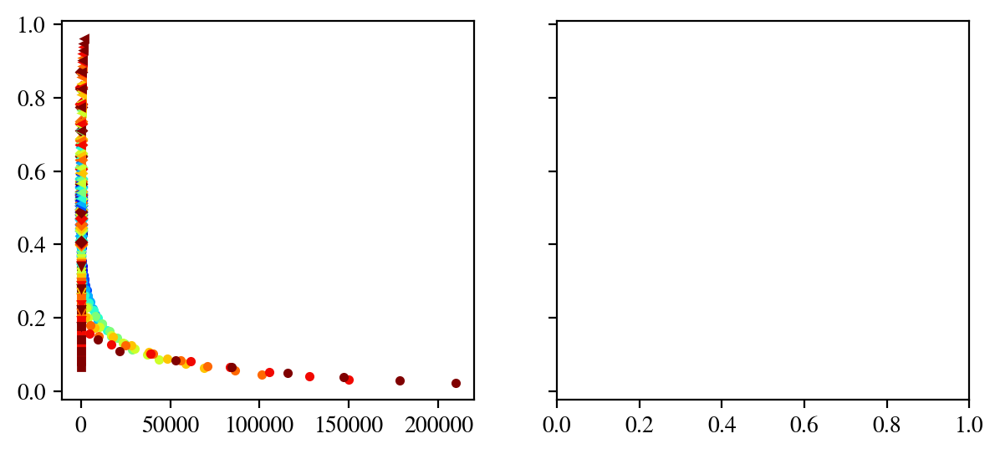

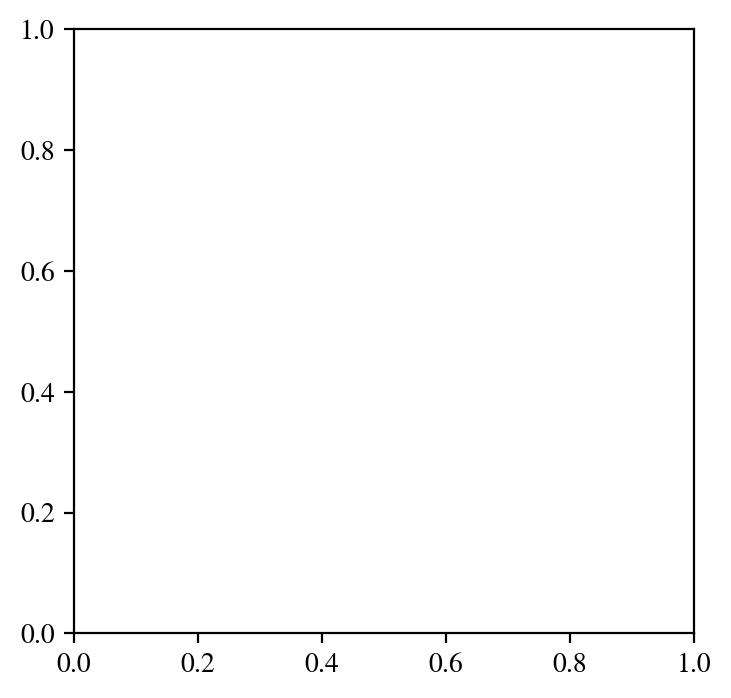

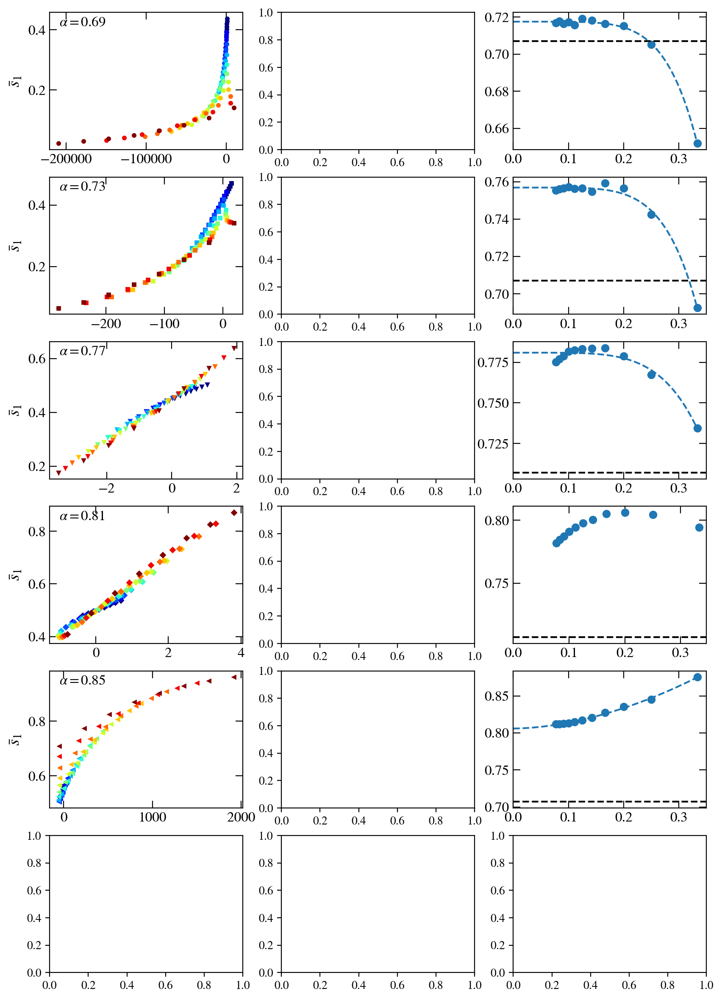

In [29]:
colors_ls = (list(mcolors.TABLEAU_COLORS)[:500])
colors_ls_cyc = itertools.cycle(colors_ls)

L_total=15

J=3
alfa=1.0
h=1.0
w=0.5
zeta=0.2
N=3
gamma=1.0
ini_ave=0
L = L_total - N

scaled_disorder = 0

alfa_vals = np.linspace(0.65, 0.94, 30)

interpolate = 0
delta = 0.04
alfa_vals_centers = np.arange(0.65 + delta, 0.95 - delta, 0.04)
# alfa_vals_centers = np.arange(0.7, 0.8, 0.02)
print(alfa_vals_centers)

nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

sizes = np.arange(6, 17, 1)
norm = matplotlib.colors.Normalize(
    vmin=np.min(sizes),
    vmax=np.max(sizes))


# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap='jet', norm=norm)
s_m.set_array([])


fig, axes = plt.subplots( nrows=1, ncols=2, figsize=(7,3), dpi = 200, sharex=False, sharey=True)
axes = axes.flatten()

fig2, ax = plt.subplots( nrows=1, ncols=1, figsize=(4,4), dpi = 200)

fig3, axis_coll = plt.subplots( nrows=alfa_vals_centers.size, ncols=3, figsize=(10, 2.5*alfa_vals_centers.size), dpi = 200)

# for ii_al, alfa_center in enumerate(alfa_vals_centers):
#     figa, axa = plt.subplots( nrows=1, ncols=3, figsize=(10, 3), dpi = 200)
    
for ii_J, J in enumerate([0.5, 1]):
    cross_col = next(colors_ls_cyc)
    axis = axes[ii_J]
    # sizes = np.arange(12, 17, 1) if J < 1 else np.arange(11, 17, 1)


    folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
    folder = folder_base + base_dir[3:] + f"nu={nu}/"
    os.makedirs(folder_base, exist_ok=True)
    os.makedirs(folder, exist_ok=True)
        
    xlab = r"$\alpha$"
    alfa_crit = 0.75
    if J == 0.5:    alfa_crit = 0.77
    elif J == 1:    alfa_crit = 0.74
    elif J == 2:    alfa_crit = 0.72
    elif J == 3:    alfa_crit = 0.71
    else:           alfa_crit = 1/np.sqrt(2)

    
    interaction = []
    ydata = []
    found_sizes = []
    for L_total in sizes:
        sub_sizes = np.arange(0, L_total+1)
        L = L_total - N
        LA = L_total - 1
        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            found_sizes.append(L_total) 
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
            S = entropy[LA] / page(LA, L_total-LA)
            interaction.append(alfa_vals)
            ydata.append(S) 
        else:
            print(name_out)
    
    found_sizes = np.array(found_sizes)
    # par, crit_pars, costfun, status = cost.get_crit_points(x=np.array(disorder), y=np.array(gaps), vals=sizes - N, crit_fun='free', scaling_ansatz='classic', seed=412438923)
    # print(crit_pars)
    
    # rescale_fun = cost.resc_functions_dict['classic']
    # critical_fun = cost.crit_functions_dict['free']
    # xlab = cost.scale_ansatz_label['classic']('W')

    rescale_fun = cost.resc_functions_dict['classic']
    critical_fun = cost.crit_functions_dict['free']
    markers = itertools.cycle(markers_ls)
    
    nu_exp = []
    alfac = []
    for ii_al, alfa_center in enumerate(alfa_vals_centers):
        xx_data = []
        yy_data = []
        for ii, L in enumerate(found_sizes - N):
            col = s_m.to_rgba(L + N)
            
            indices = np.where(np.logical_and(interaction[ii] >= np.round(alfa_center - delta, 3), interaction[ii] < np.round(alfa_center + delta, 3)))[0]
            xx = interaction[ii][indices]
            yy = ydata[ii][indices]
            
            if interpolate:
                entropy_spl = make_spline(xx, yy)
                xx  = np.linspace(xx[0], xx[-1], 20)
                yy = entropy_spl(xx)
            
            
            xx_data.append(xx)    
            yy_data.append(yy)
        
        crit_exp, crit_pars, costfun, status = cost.get_crit_points(x=np.array(xx_data), y=np.array(yy_data), vals=found_sizes - N, crit_fun='free', scaling_ansatz='classic', seed=24234, two_parameter_ansatz=False)
        
        xfit = 1 / (found_sizes - N)
        axis_coll[ii_al][2].scatter(xfit, crit_pars, color=cross_col)
        
        def fitt(x, psi, alfa_c, const):
            return alfa_c * (1 + const * x**psi)
        try:
            pars, pconv = fit(fitt,
                            xdata = xfit,
                            ydata = crit_pars, maxfev = 10000)
            # print(J, "alfa_c:  ", *pars)
            Linv = np.linspace(0, max(xfit), 100)
            axis_coll[ii_al][2].plot(Linv, fitt(Linv, *pars), ls='--', color=cross_col)
        except RuntimeError:
            print("alfa=", alfa, "Fit no good")
            
        print(alfa_center, crit_exp, crit_pars, costfun, status) 
        nu_exp.append(1. / crit_exp)
        alfac.append(crit_pars[0])
        # axis.plot(interaction[ii], ydata[ii], marker='o', markersize=1, lw=1, ls=':', label=r"$L+N=%d$"%(L+N), color=col, markerfacecolor='None', zorder=100-L)  
        mark = next(markers)
        for ii, L in enumerate(found_sizes - N):
            col = s_m.to_rgba(L + N)
            axis.plot(np.abs(rescale_fun(xx_data[ii], sizes, ii, critical_fun, np.median(crit_exp), *crit_pars)), yy_data[ii], marker=mark, markersize=3, lw=0.0, label=r"$L=%d$"%L, color=col)
            axis_coll[ii_al][ii_J].plot((rescale_fun(xx_data[ii], sizes, ii, critical_fun, np.median(crit_exp), *crit_pars)), yy_data[ii], marker=mark, markersize=3, lw=0.0, label=r"$L=%d$"%L, color=col)
        
        axis_coll[ii_al][ii_J].annotate(r"$\alpha=%g$"%alfa_center, fontsize=12, xy=(0.05, 0.9), xycoords='axes fraction')
        fig_help.set_plot_elements(axis_coll[ii_al][ii_J], ylabel=r"$\bar{s}_{1}$" if ii_J%2==0 else "", xlabel=r"$L^{1/\nu(\alpha)}|\alpha-\alpha_c(\alpha)|$" if ii_al == alfa_vals_centers.size-1 else "", font_size=12, set_legend=False, xscale='linear')
        fig_help.set_plot_elements(axis_coll[ii_al][2], ylabel=r"", xlabel=r"$1/L$" if ii_al == alfa_vals_centers.size-1 else "", font_size=12, set_legend=False, xscale='linear')
        
        axis_coll[ii_al][2].set_xlim(0, None)
        axis_coll[ii_al][2].axhline(y=1/np.sqrt(2), ls='--', c='k')
    
    ax.plot(alfa_vals_centers, nu_exp, label = r"$g_0=%g$"%J, color=cross_col, marker='o', lw=0.5)
    # axis.set_xlim(0.95*min(np.array(interaction).flatten()), 1.01*max(np.array(interaction).flatten()))
    # axis.axvline(x=1/np.sqrt(2), ls='--', c='k')
    # axis.axvline(x=alfa_crit, ls=':', c='k')
    
    fig_help.set_plot_elements(axis, ylabel=r"$\bar{s}_{1}$" if ii_J==0 else "", xlabel=r"$L^{1/\nu(\alpha)}|\alpha-\alpha_c(\alpha)|$", font_size=14, set_legend=False, xscale='log')
    

fig_help.set_plot_elements(ax, ylabel=r"$\nu$", xlabel=r"$\alpha$", font_size=14, set_legend=True)
# ax.set_xlim(0, None)
# ax.set_ylim(1/np.sqrt(2), None)

fig_help.set_legend(axis_coll[0][0], loc = 'upper left', fontsize=10, anchor=(-0.02, 0.9))
axis_coll[0][0].set_title(r"$g_0=0.5$", fontsize=16)
axis_coll[0][1].set_title(r"$g_0=1$"  , fontsize=16) 
axis_coll[0][2].set_title(r"$\alpha_c$"  , fontsize=18) 

fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$L+N$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

fig.subplots_adjust(wspace = 0.03, hspace=0.03)
fig3.subplots_adjust(wspace = 0.3, hspace=0.25)



fig2.savefig("plots_beta/Fig_nuus.pdf", bbox_inches = 'tight', pad_inches=0.02)
fig3.savefig("plots_beta/Fig_collapsed.pdf", bbox_inches = 'tight', pad_inches=0.02)

### BETA FUNCTION ZEROS

No handles with labels found to put in legend.
No handles with labels found to put in legend.


[0.65 0.66 0.67 0.68 0.69 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78
 0.79 0.8  0.81 0.82 0.83 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92
 0.93 0.94]


No handles with labels found to put in legend.


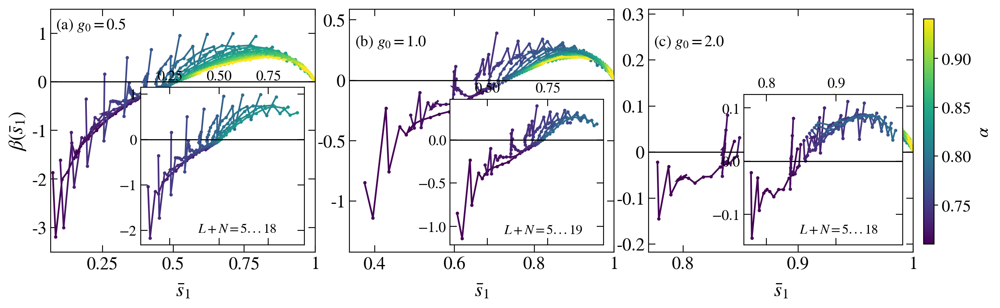

In [187]:
L_total=15
J=0.5
alfa=1.0
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0

alfa_vals = np.linspace(0.65, 0.94, 30)
print(alfa_vals)

sub_sizes = np.arange(0, L+1)
fig, axis = plt.subplots( nrows=1, ncols=3, figsize=(13,4), dpi = 200)
axis = np.array(axis).flatten()

def diff_central(x, y):
    x0 = x[:-2]
    x1 = x[1:-1]
    x2 = x[2:]
    y0 = y[:-2]
    y1 = y[1:-1]
    y2 = y[2:]
    f = (x2 - x1)/(x2 - x0)
    return (1-f)*(y2 - y1)/(x2 - x1) + f*(y1 - y0)/(x1 - x0)

interpolate = 1
use_fit = 1
bin_size = 5
use_area_collapse = 1
dalfa = 0.04

def beta0_fun(x, c_ = 1):
    if use_area_collapse: 
        # return 5*(g_ - x) / x
        # return -(g_ - x) / x * np.log( (g_ - x) / c_ )
        return -(1 - x) * np.log( (1 - x) / c_ )
    else:                 return (1 - x) / x 

def pade_fun(x, c1, c2, c3, d1, d2, d3):
    # return 1 - c1 * np.exp(-c2 * x)
    return (x**2 + c1 * x + c2) / (x**2 + d1 * x + d2)
    # return c1 * np.arctan(c2 * x - d1)
    # return (x**3 + c1*x**2 + c2*x + c3) / (x**3 + d1*x**2 + d2 * x + d3)
    # return 1 - (c1 / x**3 + c2 / x**2 + c3 / x**1 + d1)

def other_fit(x, a, c0, c1, c2, c3, c4): 
    return c1 / x**3 + c2 / x**2 + c3 / x**1 + c4 # +a / x**5+ c0 / x**4 + 
    # return c1 / x**3 + c2 / x**2 + c3 / x**1 + c4 + c5/x**4
# def other_fit(x, c1, c2, c3, c4, c5, c6): return c1 / x**3 + c2 / x**2 + c3 / x**1 + c4 + c5/x**4 + c6 / x**5
def localized_fit(x, c1, c2, c3, c4):
    return c1 * np.exp(-c2 * x**c3)

def pade_fun_deriv(x, c1, c2, c3, d1, d2, d3):
    return -(x**2 + c1 * x + c2) * (d1 + 2*x) / (x**2 + d1 * x + d2)**2 + (c1 + 2*x) / (d2 + d1*x + x**2)

def other_fit_deriv(x, a, c0, c1, c2, c3, c4):
    return - 3 * c1 / x**4 - 2 * c2 / x**3 - c3 / x**2 #-5 * a/ x**6 - 4 * c0 / x**5 

p = 1       # number of last spins
nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

sizes = np.arange(6, 19, 1 if p > 0 else 2)

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
ylab = r"$\beta(X)$"
alfa_min = 0.71

# def other_fit(x, c1, c2, c3, c4, c5):
#     return c1 * (x)**4 + c2 * (x)**3 + c3 * (x)**2 + c4 * (x) + c5
for idx1, J in enumerate([0.5, 1, 2]):
    if J == 0.5:  pars2 = [0.20303750039651067, 1.3024862073314354, 3.5196593469089423]#, 1.0]
    if J == 1.0:  pars2 = [0.348970604841207, 1.8041492991354855, 1.6231857243539651]#, 1.0]
    if J == 2.0:  pars2 = [-0.3513769553323467, 2.013093799801016, 0.9197008103991687]#, 1.0]
    # if J == 0.5:  pars2 = [0.20303750039651067, 1.8036078436115275, 1]
    # if J == 1.0:  pars2 = [0.348970604841207, 2.065140649235043, 1]
    # if J == 2.0:  pars2 = [-0.3513769553323467, 1.943929800392859, 1]
    
    sizes = np.arange(10, 19, 1 if p > 0 else 2)
    if idx1 == 0: inset = axis[idx1].inset_axes([0.34, 0.03, 0.62, 0.65])
    if idx1 == 1: inset = axis[idx1].inset_axes([0.38, 0.03, 0.58, 0.6])
    if idx1 == 2: inset = axis[idx1].inset_axes([0.36, 0.03, 0.6, 0.62])
    if idx1 == 3: inset = axis[idx1].inset_axes([0.42, 0.03, 0.55, 0.52]); #axis[idx1].inset_axes([0.03, 0.52, 0.49, 0.46])
    
    alfa_crit = 0.75
    s1_crit = 1
    if J == 0.5:    alfa_crit = 0.7612779024078085; s1_crit = 0.3975596423927653; sizes = np.arange(5, 19, 1 if p > 0 else 2); nu = 0.61
    elif J == 1:    alfa_crit = 0.7294402852322444; s1_crit = 0.5976612536491842; sizes = np.arange(5, 20, 1 if p > 0 else 2); nu = 0.68
    elif J == 2:    alfa_crit = 0.7207704442893257; s1_crit = 0.8326330851556897; sizes = np.arange(5, 19, 1 if p > 0 else 2); nu = 0.79
    elif J == 3:    alfa_crit = 0.71795404;         s1_crit = 0.9073984827790079; sizes = np.arange(5, 17, 1 if p > 0 else 2)
    else:           alfa_crit = 1/np.sqrt(2)
    
    interaction = []
    ydata = []
    for L_total in sizes:
        sub_sizes = np.arange(0, L_total+1)
        L = L_total - N
        LA = L_total - p if p > 0 else L_total // 2

        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
        else:
            print(name_out)
        entropy = entropy[LA] / (p*np.log(2)) if p > 0 else entropy[LA] / page(LA, L_total-LA)
        interaction.append(alfa_vals)
        ydata.append(entropy)

    # alfa_min = alfa_crit - 0.06

    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    norm = matplotlib.colors.Normalize(
        vmin=max(alfa_min, np.min(alfa_vals)),
        vmax=np.max(alfa_vals))


    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])

    ydata = np.transpose( np.array(ydata) )

    idx_c = 0

    envelope_ydata = []
    envelope_xdata = []
    yax_max = -10
    yax_min = 10
    
    x_inset_max = -10
    x_inset_min = 10
    for ii_a, alfa in enumerate(alfa_vals):
        if alfa < alfa_min: continue
        if alfa == alfa_crit: idx_c = ii_a
        # col = 'red' if alfa==alfa_crit else s_m.to_rgba(alfa)
        col = s_m.to_rgba(alfa)

        xx = sizes - N
        yy = ydata[ii_a]
        if interpolate:
            # print(alfa, xx, yy)
            spl = make_spline(xx, yy)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 3)
            yy = spl(xx)
            
        if not use_fit:
            if use_area_collapse: xx = np.log(xx)
            xx_beta = np.zeros( (xx.size - 1) )
            beta = np.zeros( (xx.size - 1) )
            for ii in range(xx.size - 1):
                xx_beta[ii] = yy[ii+1]
                beta[ii] = ( np.log(yy[ii+1]) - np.log(yy[ii])) / ( xx[ii+1] - xx[ii]) / (1.0 if use_area_collapse else np.log(2))
                # envelope_ydata.append(beta[ii])
                # envelope_xdata.append(xx_beta[ii])
            envelope_ydata.append(beta[-1])
            envelope_xdata.append(xx_beta[-1])
            
            axis[idx1].plot(xx_beta, beta, marker='o', markersize=2, lw=1.5, color=col)
            if alfa > alfa_crit - dalfa and alfa < alfa_crit + dalfa + 0.03:
                inset.plot(xx_beta, beta, marker='o', markersize=2, lw=1.5, color=col)
                if min(xx_beta) < x_inset_min: x_inset_min = min(xx_beta)
                if max(xx_beta) > x_inset_max: x_inset_max = max(xx_beta)
            if min(beta) < yax_min: yax_min = min(beta)
            if max(beta) > yax_max: yax_max = max(beta)
            i1 = xx.size // 2
            u = xx_beta[i1+1] - xx_beta[i1]
            v = beta[i1+1] - beta[i1]
            pos_x = xx_beta[i1] + u/2
            pos_y = beta[i1] + v/2
            norm = np.sqrt(u**2+v**2)

            axis[idx1].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", color=col, lw=0)
            if alfa > alfa_crit - dalfa and alfa < alfa_crit + dalfa:
                inset.quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", color=col, lw=0)
        else:

            my_fit = pade_fun if alfa > alfa_crit else other_fit# if alfa > 0.69 else localized_fit)
            my_fit_deriv = pade_fun_deriv if alfa > alfa_crit else other_fit_deriv
            pars, pconv = fit(my_fit,
                                xdata = xx,
                                ydata = yy,
                                maxfev = 10000
                                )
            xL = np.linspace(xx[0], xx[-1], 50)
            smooth_data = my_fit(xL, *pars)
            
            deriv = my_fit_deriv(xL, *pars) * xL / smooth_data if use_area_collapse else my_fit_deriv(xL, *pars) * 1 / smooth_data/ np.log(2)
            # deriv = np.gradient( np.log(smooth_data), np.log(xL) ) if use_area_collapse else np.gradient( np.log(smooth_data), (xL) ) / np.log(2)
           
            axis[idx1].plot(smooth_data, deriv, lw=1.5, color=col, zorder=-2)
        
            if alfa > alfa_crit - dalfa and alfa < alfa_crit + dalfa + 0.03:
                inset.plot(smooth_data, deriv, lw=1.5, color=col)
                if min(smooth_data) < x_inset_min: x_inset_min = min(smooth_data)
                if max(smooth_data) > x_inset_max: x_inset_max = max(smooth_data)
            
            if min(deriv) < yax_min: yax_min = min(deriv)
            if max(deriv) > yax_max: yax_max = max(deriv)
            
            envelope_ydata = [*envelope_ydata, *(deriv)]
            envelope_xdata = [*envelope_xdata, *(smooth_data)]
            
            i1 = smooth_data.size // 2
            u = smooth_data[i1+1] - smooth_data[i1]
            v = deriv[i1+1] - deriv[i1]
            pos_x = smooth_data[i1] + u/2
            pos_y = deriv[i1] + v/2
            norm = np.sqrt(u**2+v**2)
        
            axis[idx1].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=-1, pivot="mid", 
                               linewidth=0, width=0.02, headwidth=3, color=col, lw=0)
            
            if alfa > alfa_crit - dalfa and alfa < alfa_crit + dalfa:
                inset.quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", 
                               linewidth=0, width=0.02, headwidth=3, color=col, lw=0)
     
    # print("aa", p)
    # axis[idx1].plot(sp, beta_sp(sp, _a_, _b_, nu), lw=1, color='gray', ls='--')#, label=r"$Eq.~(S62)$" if idx1 == 2 else "")
    # sp = np.linspace(s1_crit - 0.2, s1_crit + 0.2, 10000)
    # inset.plot(sp, beta_sp(sp, _a_, _b_, nu), lw=1, color='gray', ls='--')
    # axis[idx1].plot(np.nan, np.nan, lw=1, color='k', ls=':', label=r"$Eq.~(S63)$" if idx1 == 2 else "")
    
    axis[idx1].set_xlim(min(envelope_xdata)*0.9, 1)
    axis[idx1].set_ylim(1.1*yax_min, 1.5*yax_max)
    if J == 1:
        # axis[idx1].set_xlim(0.3, 1.0)
        axis[idx1].set_ylim(1.25*yax_min, 1.5*yax_max)
    if J == 2:
        # axis[idx1].set_xlim(0.32, 1.0)
        axis[idx1].set_xlim(min(envelope_xdata)*0.99, 1)
        axis[idx1].set_ylim(1.5*yax_min, 2.5*yax_max)
    if J == 3:
        # axis[idx1].set_xlim(0.35, 1.0)
        axis[idx1].set_xlim(min(envelope_xdata)*0.99, 1)
        axis[idx1].set_ylim(1.4*yax_min, 1.2*yax_max)
    
    # axis[idx1].scatter(s1_crit, 0.0, marker='s', color='red', zorder=0, label=r"$s_1^c$" if idx1 == 2 else "")
    
    axis[idx1].axhline(y=0, ls='-', c='k', lw=1)
    inset.axhline(y=0, ls='-', c='k', lw=1)
    xlab = r"$\bar{s}_{%d}$"%p
    # ylab = r"$\tilde{\beta}($" + xlab + "$)$" if use_area_collapse else r"${\beta}($" + xlab + "$)$"
    ylab = r"${\beta}($" + xlab + "$)$"
    fig_help.set_plot_elements(axis[idx1], xlabel=xlab, ylabel=ylab if idx1 == 0 else "", font_size=16, set_legend=False, xscale='linear')
    fig_help.set_legend(axis[idx1], loc = 'center right', fontsize=14, anchor=(1.02, 0.82))
    
    inset.xaxis.set_label_position("top")
    inset.xaxis.set_label_coords(.5, 1.2)
    inset.xaxis.tick_top()

    fig_help.set_plot_elements(inset, xlabel="", ylabel="", font_size=13, set_legend=False, yscale='linear')
    # fig_help.set_legend(inset, loc = 'center right', fontsize=14)

    # inset.set_xlim(1.1 * Sc, 1.0)
    if idx1 == 0: inset.annotate(r"$L+N=%d...%d$"%(min(sizes), max(sizes)), fontsize=12, xy=(0.35, 0.08), xycoords='axes fraction')
    if idx1 == 1: inset.annotate(r"$L+N=%d...%d$"%(min(sizes), max(sizes)), fontsize=12, xy=(0.35, 0.08), xycoords='axes fraction')
    if idx1 == 2: inset.annotate(r"$L+N=%d...%d$"%(min(sizes), max(sizes)), fontsize=12, xy=(0.35, 0.08), xycoords='axes fraction')
    if idx1 == 3: inset.annotate(r"$L+N=%d...%d$"%(min(sizes), max(sizes)), fontsize=12, xy=(0.35, 0.08), xycoords='axes fraction')
    
    # inset.set_xlim(s1_crit - 0.2, s1_crit + 0.2);
    # inset.set_ylim(0, 1.1*yax_max)
    
    
fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.96, 0.15, 0.01, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$\alpha$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

for aa in [axis]:
    for ax in np.array(aa).flatten():
        ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))

axis[0].annotate(r"(a) $g_0=0.5$", fontsize=14, xy=(0.02, 0.92), xycoords='axes fraction')
axis[1].annotate(r"(b) $g_0=1.0$", fontsize=14, xy=(0.02, 0.85), xycoords='axes fraction')
axis[2].annotate(r"(c) $g_0=2.0$", fontsize=14, xy=(0.02, 0.85), xycoords='axes fraction')
# axis[3].annotate(r"(d) $g_0=3.0$", fontsize=14, xy=(0.02, 0.94), xycoords='axes fraction')
# axis[0].set_title(r"$N=3, \gamma=%.1f$"%(gamma), fontsize=16)
# axis[1].set_title(r"$N=5, \gamma=%.1f$"%(gamma), fontsize=16)

fig.subplots_adjust(wspace = 0.13, hspace=0.13)
# fig.savefig("plots_beta/Fig1.pdf", bbox_inches = 'tight', pad_inches=0.02)
# fig.savefig("plots_beta/Fig1.pdf", bbox_inches = 'tight', pad_inches=0.02)
# # 

### COLLAPSE AT DIFFERENT nu

[0.665 0.695 0.725 0.755 0.785 0.815 0.845 0.875 0.905]
Found: [4.99873875 0.68982799] CF =  1.963831050279087
Found: [4.98009239 0.68983351] CF =  1.963831050279087
Found: [4.96219209 0.6899907 ] CF =  1.963831050279087
Found: [4.98704585 0.68992098] CF =  1.963831050279087
Found: [4.95685195 0.68993963] CF =  1.963831050279087
Found: [4.98176849 0.68987666] CF =  1.963831050279087
Found: [2.61677614 0.0467655 ] CF =  4.262393436788041
Found: [4.9952388  0.68982502] CF =  1.963831050279087
Found: [3.43914257 0.37246312] CF =  4.262393436788041
Found: [4.98427988 0.6898134 ] CF =  1.963831050279087
Found: [4.95983718 0.68998286] CF =  1.963831050279087
Found: [4.93463753 0.68997945] CF =  1.963831050279087
Found: [3.61209559 0.16316778] CF =  4.262393436788041
----------------------------g0 =  0.5
alfa =  0.665
nu =  [0.20005046 0.20079949 0.20152384 0.20051951 0.20174095 0.20073193
 0.38214962 0.20019063 0.29077015 0.20063079 0.20161952 0.20264913
 0.2768476 ]
alfa_c =  [0.68982799153

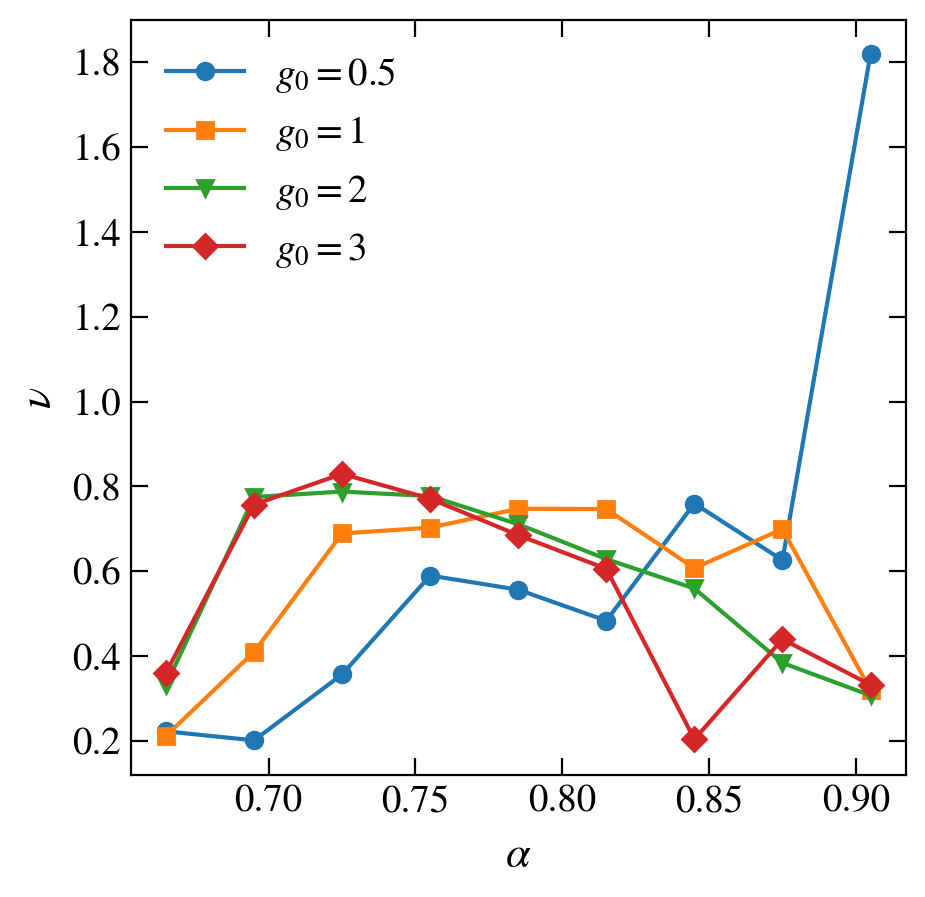

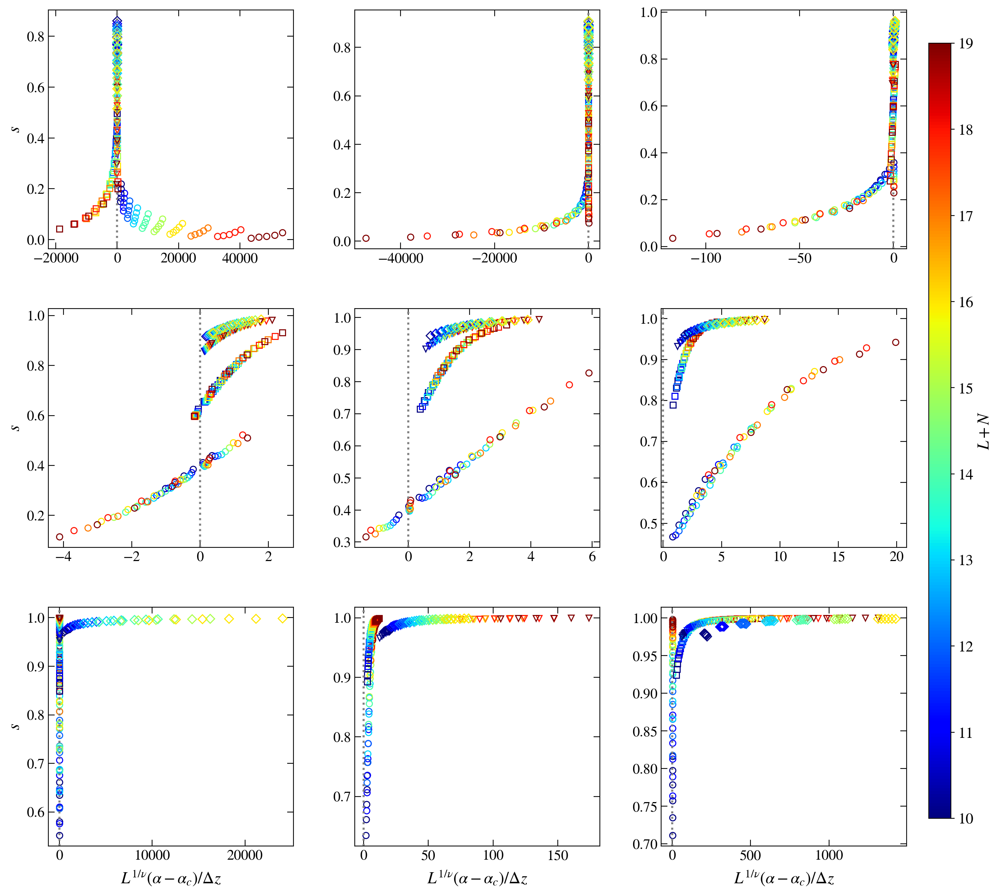

In [2]:
colors_ls = (list(mcolors.TABLEAU_COLORS)[:500])
colors_ls_cyc = itertools.cycle(colors_ls)
markers = itertools.cycle(['o','s','v', 'D', '<', 'X', '^', '*', '+'])

# print(markers)

L_total=15

J=3
alfa=1.0
h=1.0
w=0.5
zeta=0.2
N=3
gamma=1.0
ini_ave=0
L = L_total - N

scaled_disorder = 0

alfa_vals = np.linspace(0.65, 0.94, 30)

interpolate = 0
delta = 0.03
use_two_parameter_ansatz = 0
use_input_crit_point = 0

alfa_centers = np.arange(0.65 + delta / 2, 0.94 - delta / 2, delta)
print(alfa_centers)
p=1

nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

sizes = np.arange(10, 20, 1)
norm = matplotlib.colors.Normalize(
    vmin=np.min(sizes),
    vmax=np.max(sizes))


# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap='jet', norm=norm)
s_m.set_array([])

figa, ax = plt.subplots( nrows=1, ncols=1, figsize=(5, 5), dpi = 200)

fig, axis = plt.subplots( nrows=3, ncols=3, figsize=(15, 15), dpi = 200)
axis = np.array(axis).flatten()

handles_data = []
handles_fit  = []
for ii_J, J in enumerate([0.5, 1, 2, 3]):
    cross_col = next(colors_ls_cyc)
    mark = markers_ls[ii_J]
    
    # handle, = axis.plot(np.nan, np.nan, marker=mark, lw=0, markersize=6, label=r"$g_0=%g$"%J, color='k', markerfacecolor='None')
    # handles_data.append(handle)
    
    nuus = []
    for ii_ax, alfa_center in enumerate(alfa_centers):
        crit_exponents = []
        crit_alfas = []
        crit_entropy = []
        for seed in [25346322, 24342, 77632, 41423940, 1423, 238742, 41263723, 34530323, 274932, 30132, 34542312, 4673243, 65723]:
        # for seed in [23874]:

            folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
            folder = folder_base + base_dir[3:] + f"nu={nu}/"
            os.makedirs(folder_base, exist_ok=True)
            os.makedirs(folder, exist_ok=True)
                
            xlab = r"$\alpha$"
            alfa_crit = 0.75
            Lstep = 1 if p > 0 else 2
            if J == 0.5:    alfa_crit = 0.7585106313054992;   sizes = np.arange(10, 20, Lstep);
            elif J == 1:    alfa_crit = 0.7299645551916056;   sizes = np.arange(10, 20, Lstep);
            elif J == 2:    alfa_crit = 0.7176543291659800;   sizes = np.arange(10, 20, Lstep);
            elif J == 3:    alfa_crit = 0.7166694248221162;   sizes = np.arange(10, 17, Lstep);
            else:           alfa_crit = 1/np.sqrt(2)
            # alfa_crit = 1/np.sqrt(2)
            
            interaction = []
            ydata = []
            found_sizes = []
            for L_total in sizes:
                sub_sizes = np.arange(0, L_total+1)
                L = L_total - N
                LA = L_total - p if p > 0 else L_total // 2
                name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

                if exists(name_out):
                    found_sizes.append(L_total) 
                    with h5py.File(name_out, "r") as file:
                        alfa_vals    = np.array(file.get('interaction'))
                        gap_ratio    = np.array(file.get('gap_ratio'))
                        entropy      = np.array(file.get('entropy'))
                        entropy_site = np.array(file.get('single_site_entropy'))
                    S = entropy[LA] / (p*np.log(2)) if p > 0 else entropy[LA] / page(LA, L_total - LA)
                    interaction.append(alfa_vals)
                    ydata.append(S) 
                else:
                    print(name_out)
            
            found_sizes = np.array(found_sizes)

            rescale_fun = cost.resc_functions_dict['classic']
            critical_fun = cost.crit_functions_dict['const']
            markers = itertools.cycle(markers_ls)
            
            xx_data = []
            yy_data = []
            for ii, L in enumerate(found_sizes - N):
                col = s_m.to_rgba(L + N)
                
                indices = np.where(np.logical_and(interaction[ii] >= np.round(alfa_center - delta, 3), interaction[ii] <= np.round(alfa_center + delta, 3)))[0]
                # indices = np.where(np.logical_and(interaction[ii] >= np.round(0.63, 3), interaction[ii] < np.round(0.85, 3)))[0]
                xx = interaction[ii][indices]
                yy = ydata[ii][indices]
                
                if interpolate:
                    entropy_spl = make_spline(xx, yy)
                    xx  = np.linspace(xx[0], xx[-1], 20)
                    yy = entropy_spl(xx)
                
                
                xx_data.append(xx)    
                yy_data.append(yy)
            # crit_exp, crit_pars, costfun, status = cost.get_crit_points(x=np.array(xx_data), y=np.array(yy_data), vals=found_sizes - N, crit_fun='free', scaling_ansatz='classic', seed=2849423424, two_parameter_ansatz=False, use_input_criticals=use_input_crit_point, _crit_in=[alfa_crit])
            # print(J, crit_pars, crit_exp)
            if use_two_parameter_ansatz:
                crit_exp, omega, const, crit_pars, costfun, status = cost.get_crit_points(x=np.array(xx_data), y=np.array(yy_data), vals=found_sizes - N, crit_fun='const', scaling_ansatz='classic', seed=seed, two_parameter_ansatz=True, use_input_criticals=use_input_crit_point, _crit_in=[alfa_crit])
                # print("\n\ng0=", J, "\nalfa_c=", alfa_crit, "\nnu=", crit_exp, "\nc=", const, "\nomega=", omega, "\nalfa*=", crit_pars, "\nCF=", costfun, "\nstatus=", status) 
            else:
                crit_exp, crit_pars, costfun, status = cost.get_crit_points(x=np.array(xx_data), y=np.array(yy_data), vals=found_sizes - N, crit_fun='const', scaling_ansatz='classic', seed=seed, two_parameter_ansatz=False, use_input_criticals=use_input_crit_point, _crit_in=[alfa_crit])
                # print("\n\ng0=", J, "\nalfa_c=", alfa_crit, "\nnu=", crit_exp, "\nalfa*=", crit_pars, "\nCF=", costfun, "\nstatus=", status) 
            crit_exponents.append(crit_exp)
            crit_alfas.append(crit_pars[0])
            
            alfa_crit_found = crit_pars[0]
            
        print("----------------------------g0 = ", J)
        print("alfa = ", alfa_center)
        print("nu = ", 1/np.array(crit_exponents))
        print("alfa_c = ", crit_alfas)
        print("s1^c = ", crit_entropy)
            
        xfit = 1 / (found_sizes - N)
        
        s1_crit = 10
        crit_exp = tools.typical(crit_exponents)
        xxful = []
        yyful = []
        
        nuus.append(1 / crit_exp)
        for ii, L in enumerate(found_sizes - N):
            xdats = rescale_fun(xx_data[ii], (found_sizes - N), ii, critical_fun, crit_exp, tools.typical(crit_alfas))
            
            ydats = None
            if use_two_parameter_ansatz:
                ydats = yy_data[ii] - const * L**(-omega)
            else:
                ydats = yy_data[ii]
            
            xxful.append(xdats)
            yyful.append(ydats)
            permut = np.argsort(xdats)
            idx = np.argmin(np.abs(xdats))
            # s1_crit += yy_data[ii][idx]
            if yy_data[ii][idx] < s1_crit: s1_crit = yy_data[ii][idx]
            
        xmin = min(xdats.flatten())
        xmax = max(xdats.flatten())
        for ii, L in enumerate(found_sizes - N):
            col = s_m.to_rgba(L + N)
            axis[ii_ax].plot((xxful[ii]), yyful[ii], marker=mark, lw=0, markersize=6, color=col, markerfacecolor='None')
    
    ax.plot(alfa_centers, nuus, marker=mark, label=r"$g_0=%g$"%J) 



fig_help.set_plot_elements(ax, ylabel=r"$\nu$", xlabel=r"$\alpha$" if ii_ax > 5 else "", font_size=14, set_legend=True, xscale='linear')
ylab = r"$s$"
for ii_ax, alfa_center in enumerate(alfa_centers):
    fig_help.set_plot_elements(axis[ii_ax], ylabel=ylab if ii_ax % 3 == 0 else "", xlabel=r"$L^{1/\nu}(\alpha-\alpha_c)/\Delta z$" if ii_ax > 5 else "", font_size=14, set_legend=False, xscale='linear')
    axis[ii_ax].axvline(x=0, lw=2, ls=':', c='gray')

fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$L+N$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

fig.subplots_adjust(wspace = 0.25, hspace=0.25)



# FINAL PLOTS

## Fig 2

[0.65 0.66 0.67 0.68 0.69 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78
 0.79 0.8  0.81 0.82 0.83 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92
 0.93 0.94]


No handles with labels found to put in legend.


0.5 0.60945
FITTTING PARAMETERS:  0.5 4.092695889007306 0.28438454954494563 0.60292 	ln{c}= -1.257427909023354

CRITICAL EXPONENT AND CRITICAL ENTROPY:  0.5 0.36772217324761197 0.60945 0.39708


No handles with labels found to put in legend.


1 0.68639
FITTTING PARAMETERS:  1 3.6564723418470315 0.08124292114018893 0.36214 	ln{c}= -2.5103115859962877

CRITICAL EXPONENT AND CRITICAL ENTROPY:  1 0.6115266508188512 0.68639 0.63786
2 0.79797
FITTTING PARAMETERS:  2 2.7659146748065533 0.04100142006507729 0.16132999999999997 	ln{c}= -3.19414857714404

CRITICAL EXPONENT AND CRITICAL ENTROPY:  2 0.8302499027390381 0.79797 0.83867


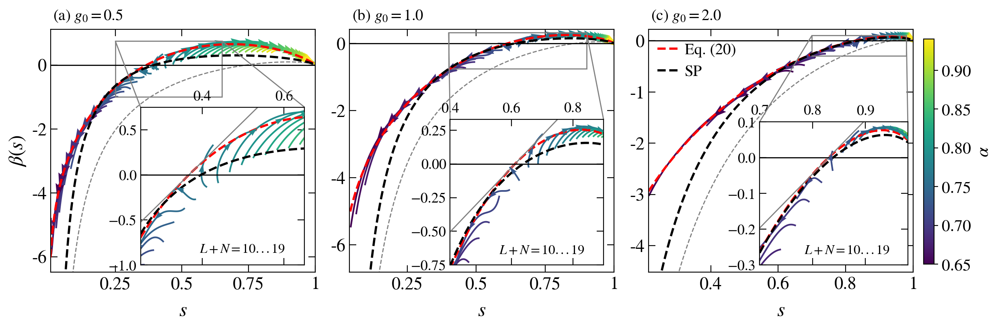

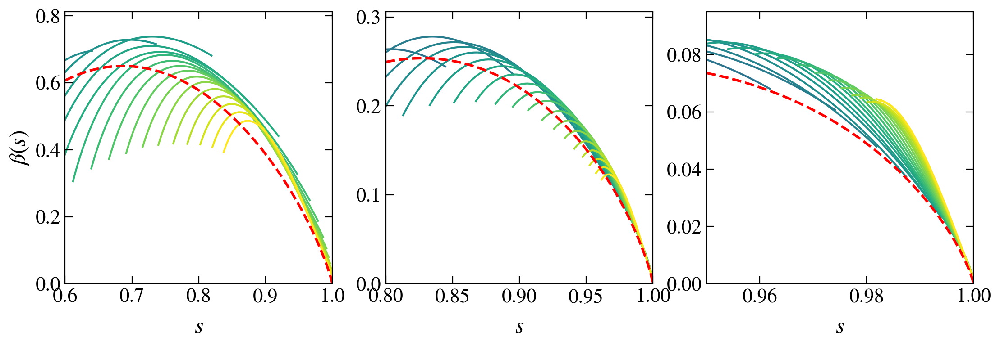

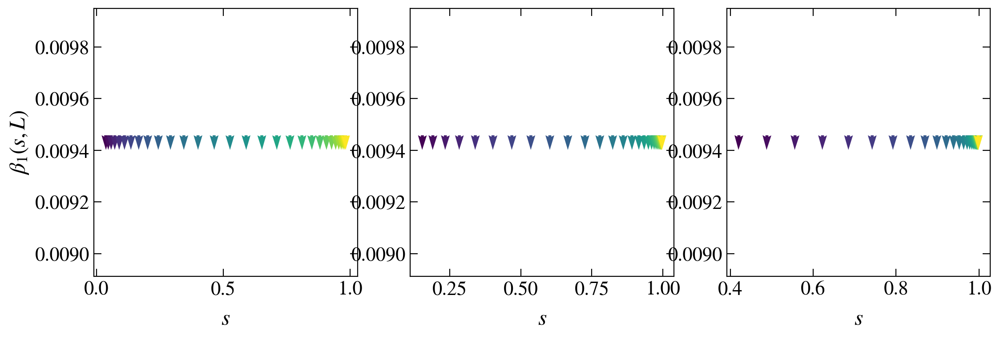

In [497]:


L_total=15
J=0.5
alfa=1.0
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0

alfa_vals = np.linspace(0.65, 0.94, 30)
print(alfa_vals)

sub_sizes = np.arange(0, L+1)
fig, axis = plt.subplots( nrows=1, ncols=3, figsize=(13,4), dpi = 200)
axis = np.array(axis).flatten()

figaga, axis2 = plt.subplots( nrows=1, ncols=3, figsize=(13,4), dpi = 200)
axis2 = np.array(axis2).flatten()

fig_test, axis_test = plt.subplots( nrows=1, ncols=3, figsize=(13,4), dpi = 200)
axis_test = np.array(axis_test).flatten()

interpolate = 0
use_fit = 1
bin_size = 5
use_area_collapse = 1
dalfa = 0.2
zeta = 1

def const_A(sc, v):
    return 1 - (1-sc) * (1-v) / ( sc * v * (1 - sc + np.log(sc)))
def const_c(sc, v):
    return np.exp( np.log(sc) * (1 - sc*v + v*np.log(sc)) / ( -v * (1 - sc + np.log(sc))) )

def beta0_fun(x, c_ = 1):
    if use_area_collapse: 
        # return 5*(g_ - x) / x
        # return -(g_ - x) / x * np.log( (g_ - x) / c_ )
        return -(1 - x) * np.log( (1 - x) / c_ )
    else:                 return (1 - x) / x 



def pade_fun(x, c0, c1, d0, d1):#, c0, d0):
    # return 1 - c1 * np.exp(-c2 * x)# - d1 * x**(-d2)
    # x = x**0.5
    return (x**2 + c1 * x + c0) / (x**2 + d1 * x + d0)
    # return c1 * np.arctan(c2 * x - d1)
    # return (x**3 + c1*x**2 + c2*x + c3) / (x**3 + d1*x**2 + d2 * x + d3)
    # return 1 - (c0 / x**3 + c1 / x**2 + d0 / x**1 + d1)

def other_fit(x, c0, c1, c2, c3, c4):#, b): 
    # return c1 / np.log(x)**3 + c2 / np.log(x)**2 + c3 / np.log(x)**1 + c4#+ a/np.log(x)**4
    return c4 / x**0.5 + c3 / x**3 + c2 / x**2 + c1 / x + c0 # + a / x**4 + b / x**5
    # return c1 / x**3 + c2 / x**2 + c3 / x**1 + c4 + c5/x**4 + c6/x**5

p = 1       # number of last spins
nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

sizes = np.arange(6, 19, 1 if p > 0 else 2)

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
ylab = r"$\beta(X)$"
alfa_min = 0.65

# def other_fit(x, c1, c2, c3, c4, c5):
#     return c1 * (x)**4 + c2 * (x)**3 + c3 * (x)**2 + c4 * (x) + c5
for idx1, J in enumerate([0.5, 1, 2]):
# for idx1, J in enumerate([1, 2, 3]):

    if J == 0.5:  pars2 = [4.092695889007306, 0.28438454954494563]
    if J == 1.0:  pars2 = [3.656472341847031, 0.08124292114018893]
    if J == 2.0:  pars2 = [2.765914674806553, 0.04100142006507729]
    if J == 3.0:  pars2 = [2.368117374274424, 0.03226345622890216]
    # if J == 0.5:  pars2 = [0.20303750039651067, 1.8036078436115275, 1]
    # if J == 1.0:  pars2 = [0.348970604841207, 2.065140649235043, 1]
    # if J == 2.0:  pars2 = [-0.3513769553323467, 1.943929800392859, 1]
    
    sizes = np.arange(10, 19, 1 if p > 0 else 2)
    if J == 0.3: inset = axis[idx1].inset_axes([0.34, 0.03, 0.62, 0.65]);  xin1, xin2, yin1, yin2 = 0.25, 0.65, -1, 0.75
    elif J == 0.5: inset = axis[idx1].inset_axes([0.34, 0.03, 0.62, 0.65]);  xin1, xin2, yin1, yin2 = 0.25, 0.65, -1, 0.75
    elif J == 1: inset = axis[idx1].inset_axes([0.38, 0.03, 0.58, 0.6]);   xin1, xin2, yin1, yin2 = 0.4, 0.9, -0.75, 0.33
    elif J == 2: inset = axis[idx1].inset_axes([0.42, 0.03, 0.56, 0.59]);   xin1, xin2, yin1, yin2 = 0.7, 0.98, -0.3, 0.1
    elif J == 3: inset = axis[idx1].inset_axes([0.42, 0.03, 0.55, 0.52]);  xin1, xin2, yin1, yin2 = 0.82, 0.999, -0.12, 0.06
    #axis[idx1].inset_axes([0.03, 0.52, 0.49, 0.46])
    inset.set_xlim(xin1**zeta, xin2**zeta)
    inset.set_ylim(yin1 * zeta, yin2 * zeta)
    
    mark_inset(axis[idx1], inset, loc1=1, loc2=2, fc="none", ec="0.5")
    # if idx1 == 0: inset = inset_axes(axis[idx1], 1,1 , loc1=1, loc2=3, bbox_to_anchor=(.08, 0.35),bbox_transform=axfft.figure.transFigure)
    # if idx1 == 1: inset = inset_axes(axis[idx1], 1,1 , loc1=1, loc2=3, bbox_to_anchor=(.08, 0.35),bbox_transform=axfft.figure.transFigure)
    # if idx1 == 2: inset = inset_axes(axis[idx1], 1,1 , loc1=1, loc2=3, bbox_to_anchor=(.08, 0.35),bbox_transform=axfft.figure.transFigure)
    # if idx1 == 3: inset = inset_axes(axis[idx1], 1,1 , loc1=1, loc2=3, bbox_to_anchor=(.08, 0.35),bbox_transform=axfft.figure.transFigure)
    
    alfa_crit = 0.75
    s1_crit = 1
    if J == 0.3:    alfa_crit = 0.8074711767728078; s1_crit = 0.27426; sizes = np.arange(10, 16, 1 if p > 0 else 2); nu = 0.61334;  s1_min = 0.6; 
    elif J == 0.5:  alfa_crit = 0.7612779024078085; s1_crit = 0.39708; sizes = np.arange(10, 20, 1 if p > 0 else 2); nu = 0.60945;  s1_min = 0.6; 
    elif J == 1:    alfa_crit = 0.7294402852322444; s1_crit = 0.63786; sizes = np.arange(10, 20, 1 if p > 0 else 2); nu = 0.68639;  s1_min = 0.8; 
    elif J == 2:    alfa_crit = 0.720371246397683;  s1_crit = 0.83867; sizes = np.arange(10, 20, 1 if p > 0 else 2); nu = 0.79797;  s1_min = 0.95;
    elif J == 3:    alfa_crit = 0.7167352842108217; s1_crit = 0.90339; sizes = np.arange(10, 19, 1 if p > 0 else 2); nu = 0.80775;  s1_min = 0.96;
    else:           alfa_crit = 1/np.sqrt(2)
    
    interaction = []
    ydata = []
    for L_total in sizes:
        sub_sizes = np.arange(0, L_total+1)
        L = L_total - N
        LA = L_total - p if p > 0 else L_total // 2

        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
        else:
            print(name_out)
        entropy = ( entropy[LA] / (p*np.log(2)) if p > 0 else entropy[LA] / page(LA, L_total-LA) )
        interaction.append(alfa_vals)
        ydata.append(entropy)

    # alfa_min = alfa_crit - 0.06

    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    norm = matplotlib.colors.Normalize(
        vmin=max(alfa_min, np.min(alfa_vals)),
        vmax=np.max(alfa_vals))


    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])
    
    ydata = np.transpose( np.array(ydata) )
    
    idx_c = 0

    envelope_ydata = []
    envelope_xdata = []
    yax_max = -10
    yax_min = 10
    
    x_inset_max = -10
    x_inset_min = 10
    for ii_a, alfa in enumerate(alfa_vals):
        if alfa < alfa_min: continue
        if alfa == alfa_crit: idx_c = ii_a
        # col = 'red' if alfa==alfa_crit else s_m.to_rgba(alfa)
        col = s_m.to_rgba(alfa)

        xx = sizes - N
        yy = ydata[ii_a]
        if interpolate:
            f = splrep(xx, yy, k=3 if alfa < alfa_crit + 0.0 else 3, s=1)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
            yy = splev(xx, f)
            
        if not use_fit:
            # if use_area_collapse: xx = np.log(xx)
            
            # f = splrep(xx, yy, k=3 if alfa < alfa_crit + 0.08 else 5, s=3)
            # xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 4)
            # yy = splev(xx, f)
            # beta = splev(xx, f, der=1) * xx / yy
            # xx_beta = yy
            
            beta = diff_central((xx), (yy)) * xx[2:] / yy[2:]
            xx_beta = yy[1:-1]
            
            beta1 = (beta - envelope_ansatz(xx_beta, *pars2))
            axis_test[idx1].plot(xx_beta, beta1, marker='o', markersize=0, lw=1.5, color=col, zorder=-2)
            
            
            envelope_ydata = [*envelope_ydata, *(beta)]
            envelope_xdata = [*envelope_xdata, *(xx_beta)]
            # envelope_ydata.append(beta[-1])
            # envelope_xdata.append(xx_beta[-1])
            
            axis[idx1].plot(xx_beta, beta, marker='o', markersize=0, lw=1.5, color=col)
            if alfa > alfa_crit - dalfa and alfa < alfa_crit + dalfa + 0.03:
                inset.plot(xx_beta, beta, marker='o', markersize=0, lw=1.5, color=col)
                if min(xx_beta) < x_inset_min: x_inset_min = min(xx_beta)
                if max(xx_beta) > x_inset_max: x_inset_max = max(xx_beta)
            if alfa > alfa_crit:
                axis2[idx1].plot(xx_beta, beta, marker='o', markersize=0, lw=1.5, color=col)
                
            if min(beta) < yax_min: yax_min = min(beta)
            if max(beta) > yax_max: yax_max = max(beta)
            i1 = xx_beta.size // 2
            u = xx_beta[i1+1] - xx_beta[i1]
            v = beta[i1+1] - beta[i1]
            pos_x = xx_beta[i1] + u/2
            pos_y = beta[i1] + v/2
            norm = np.sqrt(u**2+v**2)

            axis[idx1].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", color=col, linewidth=0, width=0.02, headwidth=2)
            if alfa > alfa_crit - dalfa and alfa < alfa_crit + dalfa:
                inset.quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", color=col, linewidth=0, width=0.02, headwidth=4)
            
            i1 = xx_beta.size // 2
            u = xx_beta[i1+1] - xx_beta[i1]
            v = beta1[i1+1] - beta1[i1]
            pos_x = xx_beta[i1] + u/2
            pos_y = beta1[i1] + v/2
            norm = np.sqrt(u**2+v**2)
        
            axis_test[idx1].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=-1, pivot="mid", 
                               linewidth=0, width=0.02, headwidth=3, color=col, lw=0)
        else:

            my_fit = pade_fun if alfa > alfa_crit else other_fit
            pars, pconv = fit(my_fit,
                                xdata = xx,
                                ydata = yy,
                                maxfev = 10000
                                )
            xL = np.linspace(xx[0], xx[-1], 100)
            smooth_data = my_fit(xL, *pars)
            # f = splrep(xx, yy, k=3 if alfa < alfa_crit + 0.08 else 5, s=1)
            # smooth_data = splev(xL, f)
            # deriv = splev(xL, f, der=1) * xL / smooth_data
            # deriv = my_fit_deriv(xL, *pars) * xL / smooth_data if use_area_collapse else my_fit_deriv(xL, *pars) * 1 / smooth_data/ np.log(2)
            # deriv = np.gradient( np.log(smooth_data), np.log(xL) )
            deriv = diff_central(np.log(xL), np.log(smooth_data))
            smooth_data = smooth_data[1:-1]
            
            axis[idx1].plot(smooth_data, deriv, lw=1.5, color=col, zorder=-2)
            if alfa > alfa_crit:
                axis2[idx1].plot(smooth_data, deriv, lw=1.5, color=col, zorder=-2)
                
            # beta1 = (deriv - envelope_ansatz(smooth_data, *pars2))
            # # axis_test[idx1].plot(smooth_data, deriv - envelope_ansatz(smooth_data, *pars2), lw=1.5, color=col, zorder=-2)
            # axis_test[idx1].plot(smooth_data, beta1, lw=1.5, color=col, zorder=-2)
            
            if alfa > alfa_crit - dalfa and alfa < alfa_crit + dalfa + 0.03:
                inset.plot(smooth_data, deriv, lw=1.5, color=col)
                if min(smooth_data) < x_inset_min: x_inset_min = min(smooth_data)
                if max(smooth_data) > x_inset_max: x_inset_max = max(smooth_data)
            
            if min(deriv) < yax_min: yax_min = min(deriv)
            if max(deriv) > yax_max: yax_max = max(deriv)
            
            envelope_ydata = [*envelope_ydata, *(deriv)]
            envelope_xdata = [*envelope_xdata, *(smooth_data)]
            # envelope_ydata = [*envelope_ydata, deriv[-1]]
            # envelope_xdata = [*envelope_xdata, smooth_data[-1]]

            i1 = smooth_data.size // 2
            u = smooth_data[i1+1] - smooth_data[i1]
            v = deriv[i1+1] - deriv[i1]
            pos_x = smooth_data[i1] + u/2
            pos_y = deriv[i1] + v/2
            norm = np.sqrt(u**2+v**2)
        
            axis[idx1].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=-1, pivot="mid", 
                               linewidth=0, width=0.02, headwidth=3, color=col, lw=0)
            
            if alfa > alfa_crit - dalfa and alfa < alfa_crit + dalfa:
                inset.quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", 
                               linewidth=0, width=0.02, headwidth=3, color=col, lw=0)
    
            
            i1 = smooth_data.size // 2
            u = smooth_data[i1+1] - smooth_data[i1]
            v = beta1[i1+1] - beta1[i1]
            pos_x = smooth_data[i1] + u/2
            pos_y = beta1[i1] + v/2
            norm = np.sqrt(u**2+v**2)
        
            axis_test[idx1].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=-1, pivot="mid", 
                               linewidth=0, width=0.02, headwidth=3, color=col, lw=0)
            
    # sorting X and Y data according to increasing X
    permut = np.argsort( np.array(envelope_xdata) )
    envelope_ydata = np.array(envelope_ydata)[permut]
    envelope_xdata = np.array(envelope_xdata)[permut]

    size = len(envelope_xdata)
    envelope = np.zeros( (size // bin_size) )
    xxx = np.zeros( (size // bin_size) )

    # Finding maximum Y in each bin of 20 points of interpolated data
    for k in range(envelope.size):
        idx_r = (k+1) * bin_size if k < envelope.size-1 else -1
        idx = np.argmax(envelope_ydata[k * bin_size : idx_r])
        envelope[k] = envelope_ydata[k * bin_size : idx_r][idx]
        xxx[k]      = envelope_xdata[k * bin_size : idx_r][idx]
    # xxx = envelope_xdata
    # envelope = envelope_ydata
    # axis[idx1].scatter(xxx, envelope, s=5, color='k')

    def envelope_sp(s, sc):
        return -(1-s) / s * np.log( (1-s) / ( 1-sc) )
        # return -(1-s) * np.log( (1-s) * sc / ( (1-sc) * s) )

    def envelope_ansatz(x, A, B):
        return -(1 - x) * np.log( (1 - x) / B) + np.log(x) - A * x * np.log(x)

    
    sp = np.linspace(min(ydata.flatten()), 1, 10000)
    def beta_sp(x, a, b, nu):
        return -1 / (nu * x) * np.log( (1 - x) / (a * x) ) * a * np.exp(-b * x) / (1 + a * np.exp(-b * x))**2
    print(J, nu)
    # axis[idx1].plot(sp, envelope_pred(sp, nu, s1_crit), lw=2, color='red', ls='--', label=r"${\beta}^*$" if idx1 == 1 else "")
    # axis2[idx1].plot(sp, envelope_pred(sp, nu, s1_crit), lw=2, color='red', ls='--', label=r"${\beta}^*$" if idx1 == 1 else "")
        
    pars2, pconv2 = fit(envelope_ansatz,
                        xdata = xxx,#[envelope        > -0.25],
                        ydata = envelope)#[envelope   > -0.25])
    print("FITTTING PARAMETERS: ", J, *pars2, 1 - s1_crit, "\tln{c}=", np.log(pars2[-1]))
    
    axis[idx1].plot(sp, envelope_ansatz(sp, *pars2), lw=2, color='red', ls='--', label=r"Eq. (20)" if idx1 == 2 else "")
    inset.plot(sp, envelope_ansatz(sp, *pars2), lw=2, color='red', ls='--', label=r"Eq. (20)" if idx1 == 2 else "")
    
    axis[idx1].plot(sp, envelope_sp(sp, s1_crit) + np.log(sp), lw=1, color='gray', ls='--')
    axis[idx1].plot(sp, envelope_sp(sp, s1_crit), lw=2, color='k', ls='--', label=r"SP" if idx1 == 2 else "")
    inset.plot(sp, envelope_sp(sp, s1_crit), lw=2, color='k', ls='--', label=r"SP" if idx1 == 2 else "")
    
    sp = np.linspace(s1_min, 1, 10000)
    axis2[idx1].plot(sp, envelope_ansatz(sp, *pars2), lw=2, color='red', ls='--', label=r"Eq. (20)" if idx1 == 2 else "")
    
    sp = np.linspace(x_inset_min, x_inset_max, 10000)
    # Defined below
    r = tools.RootFinder(0, 1, 0.001)
    roots = r.find(envelope_ansatz, *pars2)
    # print("Roots: ", roots)
    Sc = roots[0]
    # sp = np.linspace(s1_crit - 0.15, s1_crit + 0.15, 100)
    print("\nCRITICAL EXPONENT AND CRITICAL ENTROPY: ", J, Sc, nu, s1_crit)
    inset.plot(sp, (sp - Sc) / (Sc * nu), c='gray', ls='-', lw=1)
    
    # axis[idx1].plot(sp, envelope_ansatz(sp, const_A(Sc, nu), const_c(Sc, nu)), lw=2, color='k', ls='--', label=r"${\beta}_{an}$" if idx1 == 2 else "")
    axis2[idx1].set_xlim(s1_min, 1)
    axis2[idx1].set_ylim(0, 1.1*yax_max)
    
    axis[idx1].set_xlim(min(envelope_xdata)*0.9, 1)
    axis[idx1].set_ylim(1.1*yax_min, 1.5*yax_max)
    if J == 1:
        # axis[idx1].set_xlim(0.3, 1.0)
        axis[idx1].set_ylim(1.25*yax_min, 1.5*yax_max)
    if J == 2:
        # axis[idx1].set_xlim(0.32, 1.0)
        axis[idx1].set_xlim(min(envelope_xdata)*0.99, 1)
        axis[idx1].set_ylim(1.5*yax_min, 2.5*yax_max)
    if J == 3:
        # axis[idx1].set_xlim(0.35, 1.0)
        axis[idx1].set_xlim(min(envelope_xdata)*0.99, 1)
        axis[idx1].set_ylim(1.4*yax_min, 1.2*yax_max)
    
    axis[idx1].axhline(y=0, ls='-', c='k', lw=1)
    inset.axhline(y=0, ls='-', c='k', lw=1)
    xlab = r"$s$"
    # ylab = r"$\tilde{\beta}($" + xlab + "$)$" if use_area_collapse else r"${\beta}($" + xlab + "$)$"
    ylab = r"${\beta}($" + xlab + "$)$"
    fig_help.set_plot_elements(axis[idx1], xlabel=xlab, ylabel=ylab if idx1 == 0 else "", font_size=16, set_legend=False, xscale='linear')
    fig_help.set_legend(axis[idx1], loc = 'center left', fontsize=14, anchor=(-0.02, 0.87))
    fig_help.set_plot_elements(axis2[idx1], xlabel=xlab, ylabel=ylab if idx1 == 0 else "", font_size=16, set_legend=False, xscale='linear')
    
    ylab = r"${\beta}_1($" + xlab + "$, L)$"
    fig_help.set_plot_elements(axis_test[idx1], xlabel=xlab, ylabel=ylab if idx1 == 0 else "", font_size=16, set_legend=False, xscale='linear', yscale='linear')
    
    inset.xaxis.set_label_position("top")
    inset.xaxis.set_label_coords(.5, 1.2)
    inset.xaxis.tick_top()

    fig_help.set_plot_elements(inset, xlabel="", ylabel="", font_size=13, set_legend=False, yscale='linear')
    # fig_help.set_legend(inset, loc = 'center right', fontsize=14)

    # inset.set_xlim(1.1 * Sc, 1.0)
    if idx1 == 0: inset.annotate(r"$L+N=%d...%d$"%(min(sizes), max(sizes)), fontsize=12, xy=(0.36, 0.08), xycoords='axes fraction')
    if idx1 == 1: inset.annotate(r"$L+N=%d...%d$"%(min(sizes), max(sizes)), fontsize=12, xy=(0.32, 0.08), xycoords='axes fraction')
    if idx1 == 2: inset.annotate(r"$L+N=%d...%d$"%(min(sizes), max(sizes)), fontsize=12, xy=(0.3, 0.08), xycoords='axes fraction')
    if idx1 == 3: inset.annotate(r"$L+N=%d...%d$"%(min(sizes), max(sizes)), fontsize=12, xy=(0.3, 0.08), xycoords='axes fraction')
    
    # inset.set_xlim(s1_crit - 0.2, s1_crit + 0.2);
    # inset.set_ylim(0, 1.1*yax_max)
    
    
fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.96, 0.15, 0.01, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$\alpha$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

for aa in [axis]:
    for ax in np.array(aa).flatten():
        ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))

axis[0].annotate(r"(a) $g_0=0.5$", fontsize=14, xy=(0.01, 1.04), xycoords='axes fraction')
axis[1].annotate(r"(b) $g_0=1.0$", fontsize=14, xy=(0.01, 1.04), xycoords='axes fraction')
axis[2].annotate(r"(c) $g_0=2.0$", fontsize=14, xy=(0.01, 1.04), xycoords='axes fraction')
# axis[0].annotate(r"(a) $g_0=1$", fontsize=14, xy=(0.01, 1.04), xycoords='axes fraction')
# axis[1].annotate(r"(b) $g_0=2$", fontsize=14, xy=(0.01, 1.04), xycoords='axes fraction')
# axis[2].annotate(r"(c) $g_0=3$", fontsize=14, xy=(0.01, 1.04), xycoords='axes fraction')
# axis[3].annotate(r"(d) $g_0=3.0$", fontsize=14, xy=(0.02, 0.94), xycoords='axes fraction')

fig.subplots_adjust(wspace = 0.13, hspace=0.13)
fig.savefig("plots_beta/Fig1.pdf", bbox_inches = 'tight', pad_inches=0.02)
# 

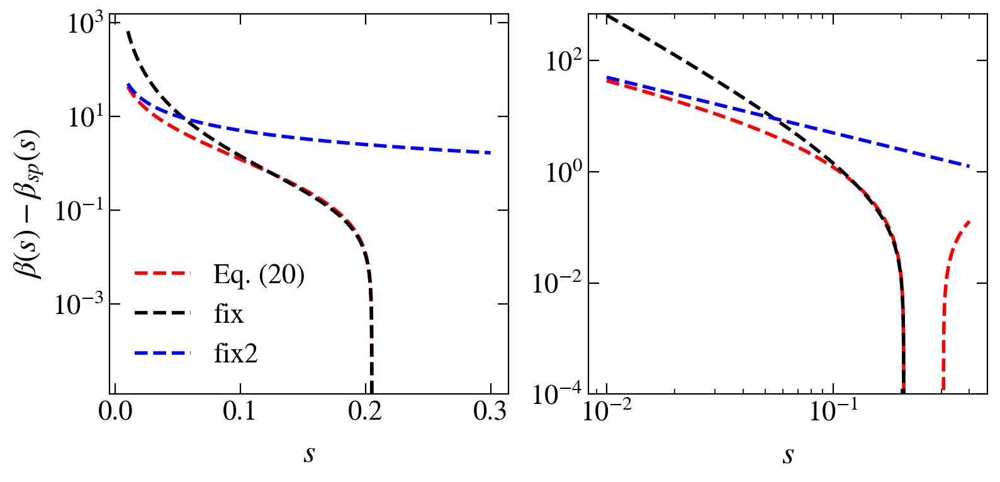

In [492]:
s1_crit = 0.39708
pars2 = [4.092695889007306, 0.28438454954494563]

fig, axis = plt.subplots( nrows=1, ncols=2, figsize=(9,4), dpi = 200)

def corr(s):
    return -0.022 * np.log(s / 0.205) / np.log( (1 - s) )**2


def corr2(s):
    return 0.5 / (s)

sp = np.linspace(0.01, 0.3, 10000)
axis[0].plot(sp, envelope_ansatz(sp, *pars2) - envelope_sp(sp, s1_crit), lw=2, color='red', ls='--', label=r"Eq. (20)")
axis[0].plot(sp, corr(sp), lw=2, color='k', ls='--', label=r"fix")
axis[0].plot(sp, corr2(sp), lw=2, color='b', ls='--', label=r"fix2")

sp = np.linspace(1e-2, 0.4, 10000)
axis[1].plot(sp, envelope_ansatz(sp, *pars2) - envelope_sp(sp, s1_crit), lw=2, color='red', ls='--', label=r"Eq. (20)")
axis[1].plot(sp, corr(sp), lw=2, color='k', ls='--', label=r"fix")
axis[1].plot(sp, corr2(sp), lw=2, color='b', ls='--', label=r"fix2")
# axis[0].plot(sp, envelope_sp(sp, s1_crit) + np.log(sp), lw=1, color='gray', ls='--')
# axis[0].plot(sp, envelope_sp(sp, s1_crit), lw=2, color='k', ls='--', label=r"SP")

fig_help.set_plot_elements(axis[0], xlabel=r"$s$", ylabel=r"$\beta(s) - \beta_{sp}(s)$", font_size=16, set_legend=True, xscale='linear', yscale='log')

axis[1].set_ylim(1e-4, None)
fig_help.set_plot_elements(axis[1], xlabel=r"$s$", ylabel="", font_size=16, set_legend=False, xscale='log', yscale='log')

## Fig 1

Found: [1.56330033 0.88770253] CF =  0.30214779229509725


g0= 0.1 
alfa_c= 0.8845176698499674 
nu= [1.56330033] 
alfa*= [0.88770253] 
CF= 0.30214779229509725 
status= True
0.1 12 0.11605964903397024
Found: [1.56364099 0.887753  ] CF =  0.30214779229509725


g0= 0.1 
alfa_c= 0.8845176698499674 
nu= [1.56364099] 
alfa*= [0.887753] 
CF= 0.30214779229509725 
status= True
0.1 12 0.11605964903397024
----------------------------g0 =  0.1
nu =  [[0.63967235]
 [0.63953299]]
alfa_c =  [0.8877025304216564, 0.8877530007684604]
s1^c =  [0.11358779285713813, 0.11365174266117573]
alpha_c =  0.887727765236382 s_c =  0.11361976325996458 nu =  0.6396026674285284
std(alpha_c) =  2.52351734020273e-05 std(s_c) =  3.197490201879705e-05 std(nu) =  6.96806441350395e-05
ds_c- =  3.197040282644503e-05 ds_c+ =  3.197940121114906e-05
Found: [1.58741203 0.83802141] CF =  0.13426077705581552


g0= 0.2 
alfa_c= 0.8342560846296337 
nu= [1.58741203] 
alfa*= [0.83802141] 
CF= 0.13426077705581552 
status= True
0.2 12 0

Text(0.85, 0.07, '(d)')

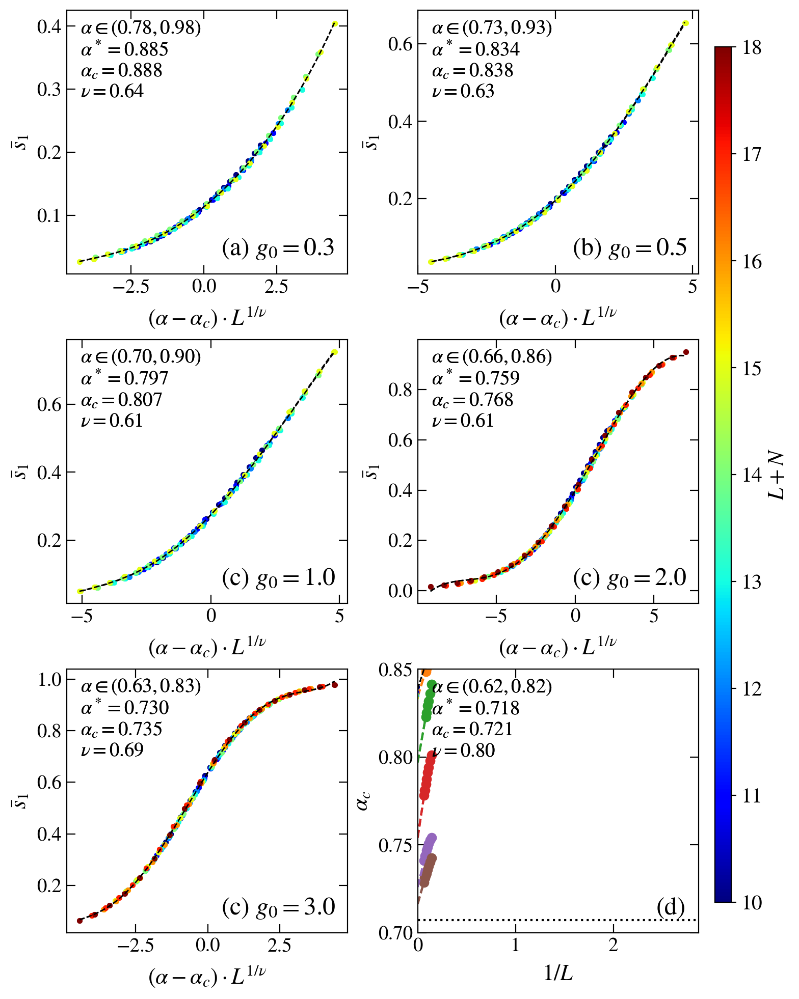

In [208]:
colors_ls = (list(mcolors.TABLEAU_COLORS)[:500])
colors_ls_cyc = itertools.cycle(colors_ls)

L_total=15

J=3
alfa=1.0
h=1.0
w=0.5
zeta=0.2
N=3
gamma=1.0
ini_ave=0
L = L_total - N

scaled_disorder = 0

alfa_vals = np.linspace(0.65, 0.94, 30)

interpolate = 0
delta = 0.1
use_two_parameter_ansatz = 0
use_input_crit_point = 0

nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

sizes = np.arange(10, 19, 1)
norm = matplotlib.colors.Normalize(
    vmin=np.min(sizes),
    vmax=np.max(sizes))


# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap='jet', norm=norm)
s_m.set_array([])

fig, axis = plt.subplots( nrows=3, ncols=2, figsize=(8, 12), dpi = 200)
axis = axis.flatten()

for ii_J, J in enumerate([0.1, 0.2, 0.3, 0.5, 1, 2]):
    cross_col = next(colors_ls_cyc)
    crit_exponents = []
    crit_alfas = []
    crit_entropy = []
    for r in range(2):
        seed = np.random.randint(0, int(2**30) )
        # for ii_al, alfa_center in enumerate(alfa_vals_centers):
        #     figa, axa = plt.subplots( nrows=1, ncols=3, figsize=(10, 3), dpi = 200)
            
            # sizes = np.arange(13, 17, 1) if J < 1 else np.arange(12, 17, 1)


        folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
        folder = folder_base + base_dir[3:] + f"nu={nu}/"
        os.makedirs(folder_base, exist_ok=True)
        os.makedirs(folder, exist_ok=True)
            
        xlab = r"$\alpha$"
        alfa_crit = 0.75
        if J == 0.1:    alfa_crit = 0.8845176698499674;   sizes = np.arange(10, 16, 1); alfa_cross_L = [0.905015015015015, 0.9044144144144145, 0.9006606606606608, 0.9015615615615616, 0.8963063063063064, 0.8970570570570571]
        elif J == 0.2:  alfa_crit = 0.8342560846296337;   sizes = np.arange(10, 16, 1); alfa_cross_L = [0.8587687687687687, 0.8586186186186187, 0.8538138138138138, 0.8530630630630631, 0.8505105105105105, 0.8485585585585586]
        elif J == 0.3:  alfa_crit = 0.7969816538376154;   sizes = np.arange(10, 16, 1); alfa_cross_L = [0.8415315315315316, 0.8362762762762763, 0.8317717717717718, 0.8292192192192193, 0.8251651651651651, 0.8227627627627627]
        elif J == 0.5:  alfa_crit = 0.7585106313054992;   sizes = np.arange(10, 19, 1); alfa_cross_L = [0.8009709709709709, 0.7979279279279279, 0.7942442442442441, 0.7912012012012011, 0.7875175175175174, 0.7844744744744744, 0.7811111111111111, 0.7811111111111111, 0.7782282282282281]#, 0.7790290290290289]
        elif J == 1:    alfa_crit = 0.7299645551916056;   sizes = np.arange(10, 19, 1); alfa_cross_L = [0.7541741741741742, 0.7528228228228229, 0.7505705705705705, 0.7486186186186187, 0.746966966966967, 0.7445645645645645, 0.7436636636636637, 0.7412612612612612, 0.7412612612612612]
        elif J == 2:    alfa_crit = 0.7176543291659800;   sizes = np.arange(10, 19, 1); alfa_cross_L = [0.7427327327327327, 0.7403303303303304, 0.738078078078078, 0.7358258258258258, 0.7338738738738738, 0.7329729729729729, 0.7311711711711711, 0.7313213213213213, 0.7286186186186187]
        elif J == 3:    alfa_crit = 0.7162595946834940;   sizes = np.arange(10, 19, 1); alfa_cross_L = [0.7303303303303303, 0.7291291291291291, 0.7277777777777777, 0.7262762762762762, 0.7250750750750751, 0.7246246246246246, 0.7244744744744744, 0.7232732732732733, 0.7228228228228228]
        else:           alfa_crit = 1/np.sqrt(2)
        # alfa_crit = 1/np.sqrt(2)
        
        interaction = []
        ydata = []
        found_sizes = []
        for L_total in sizes:
            sub_sizes = np.arange(0, L_total+1)
            L = L_total - N
            LA = L_total - 1
            name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

            if exists(name_out):
                found_sizes.append(L_total) 
                with h5py.File(name_out, "r") as file:
                    alfa_vals    = np.array(file.get('interaction'))
                    gap_ratio    = np.array(file.get('gap_ratio'))
                    entropy      = np.array(file.get('entropy'))
                    entropy_site = np.array(file.get('single_site_entropy'))
                S = entropy[LA] / page(LA, L_total-LA)
                indices = np.transpose(np.argwhere(~np.isnan(S)))[0]
                # print(L_total, indices)
                interaction.append(alfa_vals[indices])
                ydata.append(S[indices]) 
            else:
                print(name_out)
        
        found_sizes = np.array(found_sizes)

        ansatz = 'classic'
        rescale_fun = cost.resc_functions_dict[ansatz]
        critical_fun = cost.crit_functions_dict['const']
        markers = itertools.cycle(markers_ls)
        
        xx_data = []
        yy_data = []
        for ii, L in enumerate(found_sizes - N):
            col = s_m.to_rgba(L + N)
            
            indices = np.where(np.logical_and(interaction[ii] >= np.round(alfa_crit - delta, 3), interaction[ii] < np.round(alfa_crit + delta, 3)))[0]
            xx = interaction[ii][indices]
            yy = ydata[ii][indices]
            
            if interpolate:
                entropy_spl = make_spline(xx, yy)
                xx  = np.linspace(xx[0], xx[-1], 20)
                yy = entropy_spl(xx)
            
            
            xx_data.append(xx)    
            yy_data.append(yy)
        # crit_exp, crit_pars, costfun, status = cost.get_crit_points(x=np.array(xx_data), y=np.array(yy_data), vals=found_sizes - N, crit_fun='free', scaling_ansatz='classic', seed=2849423424, two_parameter_ansatz=False, use_input_criticals=use_input_crit_point, _crit_in=[alfa_crit])
        # print(J, crit_pars, crit_exp)
        if use_two_parameter_ansatz:
            crit_exp, omega, const, crit_pars, costfun, status = cost.get_crit_points(x=np.array(xx_data), y=np.array(yy_data), vals=found_sizes - N, crit_fun='const', scaling_ansatz=ansatz, seed=seed, two_parameter_ansatz=True, use_input_criticals=use_input_crit_point, _crit_in=[alfa_crit])
            print("\n\ng0=", J, "\nalfa_c=", alfa_crit, "\nnu=", crit_exp, "\nc=", const, "\nomega=", omega, "\nalfa*=", crit_pars, "\nCF=", costfun, "\nstatus=", status) 
        else:
            crit_exp, crit_pars, costfun, status = cost.get_crit_points(x=np.array(xx_data), y=np.array(yy_data), vals=found_sizes - N, crit_fun='const', scaling_ansatz=ansatz, seed=seed, two_parameter_ansatz=False, use_input_criticals=use_input_crit_point, _crit_in=[alfa_crit])
            print("\n\ng0=", J, "\nalfa_c=", alfa_crit, "\nnu=", crit_exp, "\nalfa*=", crit_pars, "\nCF=", costfun, "\nstatus=", status) 
        crit_exponents.append(crit_exp)
        crit_alfas.append(crit_pars[0])
        
        alfa_crit_found = crit_pars[0]
        xfit = 1 / (found_sizes - N)
        
        axis[-1].scatter(xfit, alfa_cross_L, color=cross_col, label = r"$g_0=%g$"%J)
        def fitt(x, psi, alfa_c, const):
            return alfa_c * (1 + const * x)
        try:
            xfit = 1 / (found_sizes[-7:] - N)
            pars, pconv = fit(fitt,
                            xdata = xfit,
                            ydata = alfa_cross_L[-7:], 
                            maxfev = 10000, 
                            bounds = ( (0.25, 1/np.sqrt(2), 0), (3, 1, 10))
            )
            # print(J, "alfa_c:  ", *pars)
            Linv = np.linspace(0, max(xfit), 100)
            axis[-1].plot(Linv, fitt(Linv, *pars), ls='--', color=cross_col)
        except RuntimeError:
            print("alfa=", alfa, "Fit no good")
        
        # nu_exp.append(1. / crit_exp)
        # alfac.append(crit_pars[0])
        # axis.plot(interaction[ii], ydata[ii], marker='o', markersize=1, lw=1, ls=':', label=r"$L+N=%d$"%(L+N), color=col, markerfacecolor='None', zorder=100-L)  
        mark = next(markers)
        s1_crit = 0
        
        xx_fit = []
        yy_fit = []
        for ii, L in enumerate(found_sizes - N):
            col = s_m.to_rgba(L + N)
            xdats = rescale_fun(xx_data[ii], found_sizes - N, ii, critical_fun, np.median(crit_exp), *crit_pars)
            ydats = None
            if use_two_parameter_ansatz:
                ydats = yy_data[ii] - const * L**(-omega)
            else:
                ydats = yy_data[ii]
            axis[ii_J].plot(xdats, ydats, marker=mark, markersize=3, lw=0.0, label=r"$L=%d$"%L, color=col)
            xx_fit = [*xx_fit, *xdats]
            yy_fit = [*yy_fit, *ydats]
            permut = np.argsort(xdats)
            idx = np.argmin(np.abs(xdats))
            # s1_crit += yy_data[ii][idx]
            s1_crit += yy_data[ii][idx]
        s1_crit /= len(found_sizes)
        print(J, L, s1_crit)
        # print(xx_fit, yy_fit)
        
        permut = np.argsort( np.array(xx_fit) )
        yy_fit = np.array(yy_fit)[permut]
        xx_fit = np.array(xx_fit)[permut]
        new_x = np.linspace(min(xx_fit), max(xx_fit), 10000)
        f = splrep(xx_fit, yy_fit, k=5, s=1)
        axis[ii_J].plot(new_x, splev(new_x, f), lw=1, color='k', ls='--')
        idx = np.argmin(np.abs(new_x))
        s1_crit = splev(new_x, f)[idx]
        crit_entropy.append(s1_crit)
                
            
        
        ylab = r"$\bar{s}_{1}-c\cdot L^{-\omega}$" if use_two_parameter_ansatz else r"$\bar{s}_{1}$"
        xlab = r"$%s$"%cost.scale_ansatz_label[ansatz]('\\alpha')
        fig_help.set_plot_elements(axis[ii_J], ylabel=ylab, xlabel=xlab, font_size=14, set_legend=False, xscale='linear')
        
        axis[ii_J].annotate(r"$\alpha\in(%.2f,%.2f)$"%(alfa_crit-delta, alfa_crit + delta)+ f"\n" + r"$\alpha^*=%.3f$"%(alfa_crit)
                            + f"\n" + r"$\alpha_c=%.3f$"%(alfa_crit_found) + f"\n" + r"$\nu=%.2f$"%(1/crit_exp) 
                                + (f"\n" + r"$c=%.2f$"%(const) + f"\n" + r"$\omega=%.2f$"%(omega) if use_two_parameter_ansatz else ""), 
                                fontsize=14, xy=(0.05, 0.6) if use_two_parameter_ansatz else (0.05, 0.67), xycoords='axes fraction')
        
    crit_exponents = 1/np.array(crit_exponents)
    print("----------------------------g0 = ", J)
    print("nu = ", crit_exponents)
    print("alfa_c = ", crit_alfas)
    print("s1^c = ", crit_entropy)
    print("alpha_c = ", tools.typical(crit_alfas), "s_c = ", tools.typical(crit_entropy), "nu = ", tools.typical(crit_exponents))
    print("std(alpha_c) = ", np.std(crit_alfas), "std(s_c) = ", np.std(crit_entropy), "std(nu) = ", np.std(crit_exponents))
    print("ds_c- = ", tools.typical(crit_entropy)-np.min(crit_entropy), "ds_c+ = ", -tools.typical(crit_entropy)+np.max(crit_entropy))
# fig_help.set_plot_elements(axis[3], ylabel=r"$\alpha_c$", xlabel=r"$1/L$", font_size=12, set_legend=False, xscale='linear')
# axis[3].set_xlim(0, None)
# axis[3].axhline(y=1/np.sqrt(2), ls='--', c='k')

axis[-1].axhline(y=1/np.sqrt(2), ls=':', c='k')
fig_help.set_plot_elements(axis[-1], ylabel=r"$\alpha_c$", xlabel=r"$1/L$", font_size=14, set_legend=False, xscale='linear', yscale='linear')
axis[-1].set_xlim(0.0, None)
axis[-1].set_ylim(0.7, 0.85)
# fig_help.set_legend(axis[3], loc = 'upper left', fontsize=14, anchor=(-0.02, 1.0))
# ax.set_xlim(0, None)
# ax.set_ylim(1/np.sqrt(2), None)

# fig_help.set_legend(axis[0], loc = 'upper left', fontsize=10, anchor=(-0.02, 0.9))

fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$L+N$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

fig.subplots_adjust(wspace = 0.25, hspace=0.25)


axis[0].annotate(r"(a) $g_0=0.1$", fontsize=18, xy=(0.55, 0.07), xycoords='axes fraction')
axis[1].annotate(r"(b) $g_0=0.2$", fontsize=18, xy=(0.55, 0.07), xycoords='axes fraction')
axis[2].annotate(r"(c) $g_0=0.3$", fontsize=18, xy=(0.55, 0.07), xycoords='axes fraction')
axis[3].annotate(r"(c) $g_0=0.5$", fontsize=18, xy=(0.55, 0.07), xycoords='axes fraction')
axis[4].annotate(r"(c) $g_0=1.0$", fontsize=18, xy=(0.55, 0.07), xycoords='axes fraction')
axis[-1].annotate(r"(d)", fontsize=18, xy=(0.85, 0.07), xycoords='axes fraction')

# fig.savefig("plots_beta/FigS1.pdf", bbox_inches = 'tight', pad_inches=0.02)
# fig3.savefig("plots_beta/Fig_collapsed.pdf", bbox_inches = 'tight', pad_inches=0.02)

Found: [1.65460557 0.83802926] CF =  0.14634365831195528


g0= 0.2 
alfa_c= 0.8342560846296337 
nu= 1.6546055721059134 
alfa*= [0.83802926] 
CF= 0.14634365831195528 
status= True
Found: [1.64951092 0.83807191] CF =  0.14634365831195528


g0= 0.2 
alfa_c= 0.8342560846296337 
nu= 1.649510924158068 
alfa*= [0.83807191] 
CF= 0.14634365831195528 
status= True
Found: [1.65836652 0.8381363 ] CF =  0.14634365831195528


g0= 0.2 
alfa_c= 0.8342560846296337 
nu= 1.6583665169376076 
alfa*= [0.8381363] 
CF= 0.14634365831195528 
status= True
Found: [1.67312915 0.83791961] CF =  0.14634365831195528


g0= 0.2 
alfa_c= 0.8342560846296337 
nu= 1.6731291484994961 
alfa*= [0.83791961] 
CF= 0.14634365831195528 
status= True
Found: [1.63846042 0.83842841] CF =  0.14634365831195528


g0= 0.2 
alfa_c= 0.8342560846296337 
nu= 1.6384604191667815 
alfa*= [0.83842841] 
CF= 0.14634365831195528 
status= True
----------------------------g0 =  0.2
nu =  [0.60437364 0.6062403  0.60300301 0.59768249 0.61032906]
alfa_c

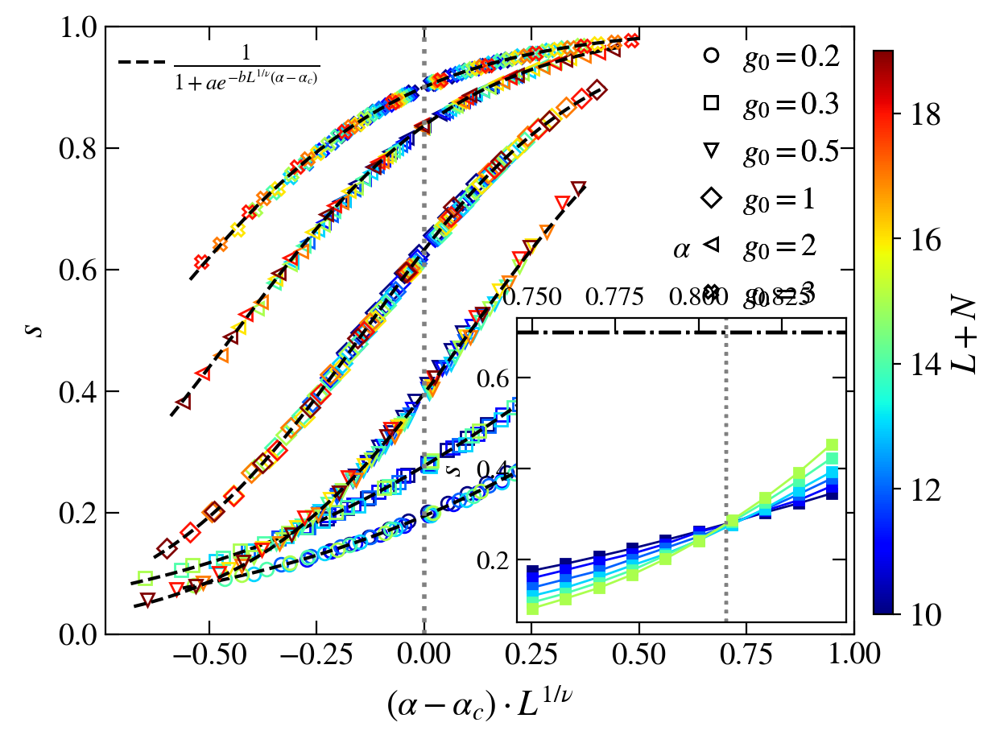

In [21]:

colors_ls = (list(mcolors.TABLEAU_COLORS)[:500])
colors_ls_cyc = itertools.cycle(colors_ls)
markers = itertools.cycle(['o','s','v', 'D', '*', 'X', '^', '<', '+'])

# print(markers)

L_total=15

J=3
alfa=1.0
h=1.0
w=0.5
zeta=0.2
N=3
gamma=1.0
ini_ave=0
L = L_total - N

scaled_disorder = 0

alfa_vals = np.linspace(0.65, 0.94, 30)

interpolate = 0
delta = 0.05
use_two_parameter_ansatz = 0
use_input_crit_point = 0

p = 1

nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

sizes = np.arange(10, 20, 1)
norm = matplotlib.colors.Normalize(
    vmin=np.min(sizes),
    vmax=np.max(sizes))


# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap='jet', norm=norm)
s_m.set_array([])

fig, axis = plt.subplots( nrows=1, ncols=1, figsize=(6, 5), dpi = 200)
inset = axis.inset_axes([0.55, 0.02, 0.44, 0.5])

handles_data = []
handles_fit  = []
for ii_J, J in enumerate([0.2, 0.3, 0.5, 1, 2, 3]):
    cross_col = next(colors_ls_cyc)
    mark = markers_ls[ii_J]
    
    handle, = axis.plot(np.nan, np.nan, marker=mark, lw=0, markersize=6, label=r"$g_0=%g$"%J, color='k', markerfacecolor='None')
    handles_data.append(handle)
    crit_exponents = []
    crit_alfas = []
    crit_entropy = []
    crit_omega = []
    crit_const = []
    for seed in [25346322, 5324, 6342436, 144354, 423452]:

        # for ii_al, alfa_center in enumerate(alfa_vals_centers):
        #     figa, axa = plt.subplots( nrows=1, ncols=3, figsize=(10, 3), dpi = 200)
            
            # sizes = np.arange(13, 17, 1) if J < 1 else np.arange(12, 17, 1)


        folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
        folder = folder_base + base_dir[3:] + f"nu={nu}/"
        os.makedirs(folder_base, exist_ok=True)
        os.makedirs(folder, exist_ok=True)
            
        xlab = r"$\alpha$"
        alfa_crit = 0.75
        Lstep = 1 if p > 0 else 2
        if J == 0.2:    alfa_crit = 0.8342560846296337;   sizes = np.arange(10, 16, Lstep);
        elif J == 0.3:    alfa_crit = 0.7969816538376154;   sizes = np.arange(10, 16, Lstep);
        elif J == 0.5:  alfa_crit = 0.7585106313054992;   sizes = np.arange(10, 20, Lstep);
        elif J == 1:    alfa_crit = 0.7299645551916056;   sizes = np.arange(10, 20, Lstep);
        elif J == 2:    alfa_crit = 0.7176543291659800;   sizes = np.arange(10, 20, Lstep);
        elif J == 3:    alfa_crit = 0.7166694248221162;   sizes = np.arange(10, 19, Lstep);
        else:           alfa_crit = 1/np.sqrt(2)
        # alfa_crit = 1/np.sqrt(2)
        
        interaction = []
        ydata = []
        found_sizes = []
        for L_total in sizes:
            sub_sizes = np.arange(0, L_total+1)
            L = L_total - N
            LA = L_total - p if p > 0 else L_total // 2
            name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

            if exists(name_out):
                found_sizes.append(L_total) 
                with h5py.File(name_out, "r") as file:
                    alfa_vals    = np.array(file.get('interaction'))
                    gap_ratio    = np.array(file.get('gap_ratio'))
                    entropy      = np.array(file.get('entropy'))
                    entropy_site = np.array(file.get('single_site_entropy'))
                S = entropy[LA] / (p*np.log(2)) if p > 0 else entropy[LA] / page(LA, L_total - LA)
                indices = np.transpose(np.argwhere(~np.isnan(S)))[0]
                # print(L_total, indices)
                interaction.append(alfa_vals[indices])
                ydata.append(S[indices]) 
            else:
                print(name_out)
        
        found_sizes = np.array(found_sizes)

        ansatz = 'classic'
        rescale_fun = cost.resc_functions_dict[ansatz]
        critical_fun = cost.crit_functions_dict['const']
        markers = itertools.cycle(markers_ls)
        
        xx_data = []
        yy_data = []
        for ii, L in enumerate(found_sizes - N):
            col = s_m.to_rgba(L + N)
            
            indices = np.where(np.logical_and(interaction[ii] >= np.round(alfa_crit - delta, 3), interaction[ii] < np.round(alfa_crit + delta, 3)))[0]
            xx = interaction[ii][indices]
            yy = ydata[ii][indices]
            
            if interpolate:
                entropy_spl = make_spline(xx, yy)
                xx  = np.linspace(xx[0], xx[-1], 20)
                yy = entropy_spl(xx)
            
            
            xx_data.append(xx)    
            yy_data.append(yy)
        # crit_exp, crit_pars, costfun, status = cost.get_crit_points(x=np.array(xx_data), y=np.array(yy_data), vals=found_sizes - N, crit_fun='free', scaling_ansatz='classic', seed=2849423424, two_parameter_ansatz=False, use_input_criticals=use_input_crit_point, _crit_in=[alfa_crit])
        # print(J, crit_pars, crit_exp)
        if use_two_parameter_ansatz:
            crit_exp, omega, const, crit_pars, costfun, status = cost.get_crit_points(x=np.array(xx_data), y=np.array(yy_data), vals=found_sizes - N, crit_fun='const', scaling_ansatz=ansatz, seed=seed, two_parameter_ansatz=True, use_input_criticals=use_input_crit_point, _crit_in=[alfa_crit])
            print("\n\ng0=", J, "\nalfa_c=", alfa_crit, "\nnu=", crit_exp, "\nc=", const, "\nomega=", omega, "\nalfa*=", crit_pars, "\nCF=", costfun, "\nstatus=", status) 
        else:
            crit_exp, crit_pars, costfun, status = cost.get_crit_points(x=np.array(xx_data), y=np.array(yy_data), vals=found_sizes - N, crit_fun='const', scaling_ansatz=ansatz, seed=seed, two_parameter_ansatz=False, use_input_criticals=use_input_crit_point, _crit_in=[alfa_crit])
            print("\n\ng0=", J, "\nalfa_c=", alfa_crit, "\nnu=", crit_exp, "\nalfa*=", crit_pars, "\nCF=", costfun, "\nstatus=", status) 
        crit_exponents.append(crit_exp)
        crit_alfas.append(crit_pars[0])
        
        alfa_crit_found = crit_pars[0]
        
    print("----------------------------g0 = ", J)
    print("nu = ", 1/np.array(crit_exponents))
    print("alfa_c = ", crit_alfas)
    # print("s1^c = ", crit_entropy)
    print("omega = ", crit_omega)
    print("const = ", crit_const)
    print("\alpha_c = ", tools.typical(crit_alfas), "s_c = ", tools.typical(crit_entropy), "nu = ", tools.typical(crit_exponents))
        
    xfit = 1 / (found_sizes - N)
    
    s1_crit = 10
    crit_exp = tools.typical(crit_exponents)
    omega = tools.typical(crit_omega)
    const = np.mean(np.array(crit_const))
    print("w/2 + 1/v = ", omega / 2 + 1 / crit_exp)
    xxful = []
    yyful = []
    for ii, L in enumerate(found_sizes - N):
        xdats = rescale_fun(xx_data[ii], (found_sizes - N), ii, critical_fun, crit_exp, tools.typical(crit_alfas))
        # xdats /= (found_sizes[-1] - N)**((crit_exp))
        
        ydats = None
        if use_two_parameter_ansatz:
            ydats = yy_data[ii] - const * L**(-omega)
        else:
            ydats = yy_data[ii]
        
        xxful.append(xdats)
        yyful.append(ydats)
        permut = np.argsort(xdats)
        idx = np.argmin(np.abs(xdats))
        # s1_crit += yy_data[ii][idx]
        if yy_data[ii][idx] < s1_crit: s1_crit = yy_data[ii][idx]
        
    xmin = min(xdats.flatten())
    xmax = max(xdats.flatten())
    for ii, L in enumerate(found_sizes - N):
        col = s_m.to_rgba(L + N)
        axis.plot((xxful[ii]) / (xmax - xmin), yyful[ii], marker=mark, lw=0, markersize=6, color=col, markerfacecolor='None') #, label=r"$L=%d$"%L)
        if J == 0.5: 
            inset.plot(xx_data[ii], yy_data[ii], marker=mark, lw=1, markersize=4, color=col) #, label=r"$L=%d$"%L)
            inset.axvline(x=crit_pars[0], ls=':', c='gray')
            inset.axhline(y=0.7, ls='-.', c='k')
            # inset.axvspan(xmin=alfa_crit - delta, xmax=alfa_crit + delta, color='gray', alpha=0.5)
        # axis.scatter(xxful[ii], yyful[ii], marker=mark, s=30, color=col, facecolor='None') #, label=r"$L=%d$"%L)
        
    xxful = np.array(xxful).flatten()
    yyful = np.array(yyful).flatten()
    
    def ansatz_fun(x, a, b):
        # a = 1/s1_crit - 1
        # return a + b * np.tanh(c*x)
        return (1 / (1 + a * np.exp(-b * x)))# + shift
    
    pars, pconv= fit(ansatz_fun,
                    xdata = xxful,
                    ydata = yyful,
                    maxfev = 20000)
    z = np.linspace(1.05 * min(xxful), 1.05*max(xxful), 1000)
    handle, = axis.plot((z)/ (xmax - xmin), ansatz_fun(z, *pars), lw=1.5, color='k', ls = '--', label=r"$\frac{1}{1+ae^{-bL^{1/\nu}(\alpha-\alpha_c)}}$")
    handles_fit.append(handle)
    # axis.plot(z, ansatz(z, *pars), lw=1.5, color='k', ls = '--')
    print(J, L, "s1^c_num = ", s1_crit, "s1^c_fit = ", 1/(1+pars[0]), "b = ", pars[1])#, "shift = ", pars[2])
    crit_entropy.append(s1_crit)
            

axis.axvline(x=0, lw=2, ls=':', c='gray')


ylab = r"$\bar{s}_{1}-c\cdot L^{-\omega}$" if use_two_parameter_ansatz else r"$s$"
xlab = r"$%s$"%cost.scale_ansatz_label[ansatz]('\\alpha')
fig_help.set_plot_elements(axis, ylabel=ylab, xlabel=xlab, font_size=14, set_legend=False, xscale='linear')
first_legend = fig_help.set_legend(axis, fontsize=14, loc='upper left', handles=[handles_fit[0]])
ax = plt.gca().add_artist(first_legend)
 
fig_help.set_plot_elements(inset, ylabel=ylab, xlabel=r"$\alpha$", font_size=12, set_legend=False, xscale='linear')

inset.xaxis.set_label_position("top")
inset.xaxis.set_label_coords(.5, 1.2)
inset.xaxis.tick_top()

second_legend = fig_help.set_legend(axis, fontsize=14, loc='upper right', handles=handles_data)

ax = plt.gca().add_artist(second_legend)

axis.set_xlim(None, 1)
if not use_two_parameter_ansatz: axis.set_ylim(0, 1)

fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$L+N$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

fig.subplots_adjust(wspace = 0.25, hspace=0.25)


# axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.55, 0.07), xycoords='axes fraction')
# axis[1].annotate(r"(b) $g_0=1.0$", fontsize=18, xy=(0.55, 0.07), xycoords='axes fraction')
# axis[2].annotate(r"(c) $g_0=2.0$", fontsize=18, xy=(0.55, 0.07), xycoords='axes fraction')
# axis[3].annotate(r"(d)", fontsize=18, xy=(0.85, 0.07), xycoords='axes fraction')

# fig.savefig("plots_beta/Fig1.pdf", bbox_inches = 'tight', pad_inches=0.02)
# fig3.savefig("plots_beta/Fig_collapsed.pdf", bbox_inches = 'tight', pad_inches=0.02)

0.1 12 s1^c_num =  0.11413422920079448 s1^c_fit =  0.1149214702457995 a =  7.701594209168682 b =  0.3872790566296053
0.2 12 s1^c_num =  0.11413422920079448 s1^c_fit =  0.19903542363240628 a =  4.024231273759971 b =  0.40635652095730446
0.3 12 s1^c_num =  0.11413422920079448 s1^c_fit =  0.27539570993752965 a =  2.631138626766693 b =  0.4158304319717465
0.5 16 s1^c_num =  0.11413422920079448 s1^c_fit =  0.39732168191717687 a =  1.5168523277530412 b =  0.4144636507468895
1 16 s1^c_num =  0.11413422920079448 s1^c_fit =  0.6330072065351363 a =  0.5797608458103599 b =  0.7920689984132219
2 16 s1^c_num =  0.11413422920079448 s1^c_fit =  0.8386956971994689 a =  0.1923275668864767 b =  1.2457137711135362
3 15 s1^c_num =  0.11413422920079448 s1^c_fit =  0.8994186951913785 a =  0.11182923520087594 b =  1.3309056579883183


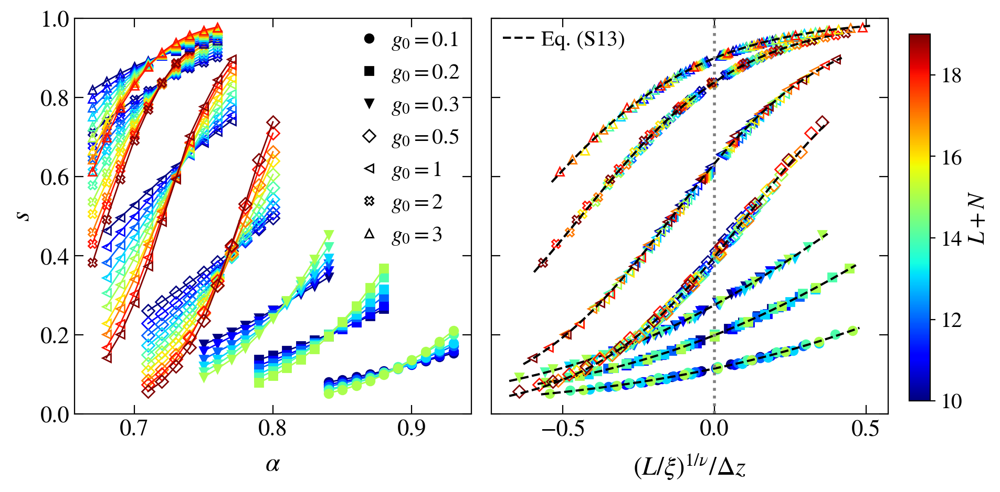

In [169]:

colors_ls = (list(mcolors.TABLEAU_COLORS)[:500])
colors_ls_cyc = itertools.cycle(colors_ls)
markers = itertools.cycle(['o','s','v', 'D', '*', 'X', '^', '<', '+'])

# print(markers)

L_total=15

J=3
alfa=1.0
h=1.0
w=0.5
zeta=0.2
N=3
gamma=1.0
ini_ave=0
L = L_total - N

scaled_disorder = 0

alfa_vals = np.linspace(0.65, 0.94, 30)

interpolate = 0
delta = 0.05
use_two_parameter_ansatz = 0
use_input_crit_point = 0


USE_PREVIOUS_DATA = 1


folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)


p = 1
Lmax = 20

nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

sizes = np.arange(10, Lmax, 1)
norm = matplotlib.colors.Normalize(
    vmin=np.min(sizes),
    vmax=np.max(sizes))


# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap='jet', norm=norm)
s_m.set_array([])

fig, axis = plt.subplots( nrows=1, ncols=2, figsize=(10, 5), dpi = 200, sharey=True)
# inset = axis.inset_axes([0.55, 0.02, 0.44, 0.5])
axis = [axis[1], axis[0]]

_scs_   = [0.116, 0.199, 0.281, 0.408, 0.605, 0.836, 0.909]
_nuus_  = [0.650, 0.629, 0.616, 0.597, 0.691, 0.790, 0.807]
_alfas_ = [0.889, 0.840, 0.808, 0.768, 0.734, 0.721, 0.716]

for ii_J, J in enumerate([0.1, 0.2, 0.3, 0.5, 1, 2, 3]):
    cross_col = next(colors_ls_cyc)
    mark = markers_ls[ii_J]
    
    axis[1].plot(np.nan, np.nan, marker=mark, lw=0, markersize=6, label=r"$g_0=%g$"%J, color='k', markerfacecolor='None' if J > 0.4 else 'k')
    

    xlab = r"$\alpha$"
    alfa_crit = 0.75
    Lstep = 1 if p > 0 else 2
    if J == 0.1:    alfa_crit = 0.8845176698499674;   sizes = np.arange(10, 16, Lstep);
    elif J == 0.2:  alfa_crit = 0.8342560846296337;   sizes = np.arange(10, 16, Lstep);
    elif J == 0.3:  alfa_crit = 0.7969816538376154;   sizes = np.arange(10, 16, Lstep);
    elif J == 0.5:  alfa_crit = 0.7585106313054992;   sizes = np.arange(10, Lmax, Lstep);
    elif J == 1:    alfa_crit = 0.7299645551916056;   sizes = np.arange(10, Lmax, Lstep);
    elif J == 2:    alfa_crit = 0.7176543291659800;   sizes = np.arange(10, Lmax, Lstep);
    elif J == 3:    alfa_crit = 0.7166694248221162;   sizes = np.arange(10, 19, Lstep);
    else:           alfa_crit = 1/np.sqrt(2)
    
    if not USE_PREVIOUS_DATA:
        crit_exponents = []
        crit_alfas = []
        crit_entropy = []
        crit_omega = []
        crit_const = []
        crit_const2 = []
        # for seed in [25346322, 5324, 6342436, 144354, 423452]:
        # for seed in [25346322]:
        for r in range(100):
            seed = np.random.randint(0, int(2**30) )
            # alfa_crit = 1/np.sqrt(2)
            
            interaction = []
            ydata = []
            found_sizes = []
            for L_total in sizes:
                sub_sizes = np.arange(0, L_total+1)
                L = L_total - N
                LA = L_total - p if p > 0 else L_total // 2
                name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

                if exists(name_out):
                    found_sizes.append(L_total) 
                    with h5py.File(name_out, "r") as file:
                        alfa_vals    = np.array(file.get('interaction'))
                        gap_ratio    = np.array(file.get('gap_ratio'))
                        entropy      = np.array(file.get('entropy'))
                        entropy_site = np.array(file.get('single_site_entropy'))
                    S = entropy[LA] / (p*np.log(2)) if p > 0 else entropy[LA] / page(LA, L_total - LA)
                    indices = np.transpose(np.argwhere(~np.isnan(S)))[0]
                    # print(L_total, indices)
                    interaction.append(alfa_vals[indices])
                    ydata.append(S[indices]) 
                else:
                    print(name_out)
            
            found_sizes = np.array(found_sizes)

            ansatz = 'classic'
            rescale_fun = cost.resc_functions_dict[ansatz]
            critical_fun = cost.crit_functions_dict['const']
            markers = itertools.cycle(markers_ls)
            
            xx_data = []
            yy_data = []
            for ii, L in enumerate(found_sizes - N):
                col = s_m.to_rgba(L + N)
                
                indices = np.where(np.logical_and(interaction[ii] >= np.round(alfa_crit - delta, 3), interaction[ii] < np.round(alfa_crit + delta, 3)))[0]
                xx = interaction[ii][indices]
                yy = ydata[ii][indices]
                
                if interpolate:
                    entropy_spl = make_spline(xx, yy)
                    xx  = np.linspace(xx[0], xx[-1], 20)
                    yy = entropy_spl(xx)
                
                
                xx_data.append(xx)    
                yy_data.append(yy)
            # crit_exp, crit_pars, costfun, status = cost.get_crit_points(x=np.array(xx_data), y=np.array(yy_data), vals=found_sizes - N, crit_fun='free', scaling_ansatz='classic', seed=2849423424, two_parameter_ansatz=False, use_input_criticals=use_input_crit_point, _crit_in=[alfa_crit])
            # print(J, crit_pars, crit_exp)
            if use_two_parameter_ansatz:
                [crit_exp, omega, const], crit_pars, costfun, status = cost.get_crit_points(x=np.array(xx_data), y=np.array(yy_data), vals=found_sizes - N, crit_fun='const', scaling_ansatz=ansatz, seed=seed, two_parameter_ansatz=True, use_input_criticals=use_input_crit_point, _crit_in=[alfa_crit])
                print("\n\ng0=", J, "\nalfa_c=", alfa_crit, "\nnu=", crit_exp, "\nc=", const, "\nomega=", omega, "\nalfa*=", crit_pars, "\nCF=", costfun, "\nstatus=", status) 
                crit_omega.append(omega)
                crit_const.append(const)
            else:
                [crit_exp], crit_pars, costfun, status = cost.get_crit_points(x=np.array(xx_data), y=np.array(yy_data), vals=found_sizes - N, crit_fun='const', scaling_ansatz=ansatz, seed=seed, two_parameter_ansatz=False, use_input_criticals=use_input_crit_point, _crit_in=[alfa_crit])
                print("\n\ng0=", J, "\nalfa_c=", alfa_crit, "\nnu=", crit_exp, "\nalfa*=", crit_pars, "\nCF=", costfun, "\nstatus=", status) 
            crit_exponents.append(crit_exp)
            if ansatz == 'RGcorr':
                crit_const2.append(crit_pars[0])
                crit_alfas.append(crit_pars[1])
            else:
                crit_alfas.append(crit_pars[0])
            for ii, L in enumerate(found_sizes - N):
                xdats = rescale_fun(xx_data[ii], (found_sizes - N), ii, critical_fun, crit_exp, crit_pars[0], crit_pars[1:])\
                        if ansatz == 'RGcorr' else rescale_fun(xx_data[ii], (found_sizes - N), ii, critical_fun, crit_exp, crit_pars)
                # xdats /= (found_sizes[-1] - N)**((crit_exp))
                
                ydats = None
                if use_two_parameter_ansatz:
                    ydats = yy_data[ii] - const * L**(-omega)
                else:
                    ydats = yy_data[ii]
                permut = np.argsort(xdats)
                idx = np.argmin(np.abs(xdats))
                s1_crit = yy_data[ii][idx]
                # if yy_data[ii][idx] < s1_crit: s1_crit = yy_data[ii][idx]
            
                crit_entropy.append(s1_crit)
            alfa_crit_found = crit_pars[0]
            
        print("----------------------------g0 = ", J)
        print("nu = ", 1/np.array(crit_exponents))
        print("alfa_c = ", crit_alfas)
        print("s1^c = ", crit_entropy)
        print("omega = ", crit_omega)
        print("const = ", crit_const)
        print("const2 = ", crit_const2)
        print("\alpha_c = ", tools.typical(crit_alfas), "s_c = ", tools.typical(crit_entropy), "nu = ", 1/tools.typical(crit_exponents))
        print("std(alpha_c) = ", np.std(crit_alfas), "std(s_c) = ", np.std(crit_entropy), "std(nu) = ", np.std(crit_exponents))
        print("ds_c- = ", tools.typical(crit_entropy) - np.min(crit_entropy), "ds_c+ = ", -tools.typical(crit_entropy) + np.max(crit_entropy))
        
        xfit = 1 / (found_sizes - N)
        
        s1_crit = 10
        crit_exp = tools.typical(crit_exponents)
        omega = tools.typical(crit_omega)
        const = np.mean(np.array(crit_const))
        const2 = np.mean(np.array(crit_const2))
        print("w/2 + 1/v = ", omega / 2 + crit_exp)
        alpha_c = tools.typical(crit_alfas)
    else:
        crit_exp = 1 / _nuus_[ii_J]
        alpha_c  = _alfas_[ii_J]
        omega    = 0
        const    = 0
        const2   = 0
        found_sizes = []
        interaction = []
        ydata = []
        for L_total in sizes:
            sub_sizes = np.arange(0, L_total+1)
            L = L_total - N
            LA = L_total - p if p > 0 else L_total // 2
            name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

            if exists(name_out):
                found_sizes.append(L_total) 
                with h5py.File(name_out, "r") as file:
                    alfa_vals    = np.array(file.get('interaction'))
                    entropy      = np.array(file.get('entropy'))
                S = entropy[LA] / (p*np.log(2)) if p > 0 else entropy[LA] / page(LA, L_total - LA)
                indices = np.transpose(np.argwhere(~np.isnan(S)))[0]
                interaction.append(alfa_vals[indices])
                ydata.append(S[indices]) 
            else:
                print(name_out)
        
        found_sizes = np.array(found_sizes)

        xx_data = []
        yy_data = []
        for ii, L in enumerate(found_sizes - N):
            col = s_m.to_rgba(L + N)
            
            indices = np.where(np.logical_and(interaction[ii] >= np.round(alfa_crit - delta, 3), interaction[ii] < np.round(alfa_crit + delta, 3)))[0]
            xx = interaction[ii][indices]
            yy = ydata[ii][indices]
            
            if interpolate:
                entropy_spl = make_spline(xx, yy)
                xx  = np.linspace(xx[0], xx[-1], 20)
                yy = entropy_spl(xx)
            
            
            xx_data.append(xx)    
            yy_data.append(yy)
    xxful = []
    yyful = []
    for ii, L in enumerate(found_sizes - N):
        xdats = rescale_fun(xx_data[ii], (found_sizes - N), ii, critical_fun, crit_exp, const2, alpha_c)\
                if ansatz == 'RGcorr' else rescale_fun(xx_data[ii], (found_sizes - N), ii, critical_fun, crit_exp, alpha_c)
        # xdats /= (found_sizes[-1] - N)**((crit_exp))
        
        ydats = None
        if use_two_parameter_ansatz:
            ydats = yy_data[ii] - const * L**(-omega)
        else:
            ydats = yy_data[ii]
        
        xxful.append(xdats)
        yyful.append(ydats)
        permut = np.argsort(xdats)
        idx = np.argmin(np.abs(xdats))
        # s1_crit += yy_data[ii][idx]
        if yy_data[ii][idx] < s1_crit: s1_crit = yy_data[ii][idx]
        
    xmin = min(xdats.flatten())
    xmax = max(xdats.flatten())
    for ii, L in enumerate(found_sizes - N):
        col = s_m.to_rgba(L + N)
        axis[0].plot((xxful[ii]) / (xmax - xmin), yyful[ii], marker=mark, lw=0, markersize=6, color=col, markerfacecolor='None' if J > 0.4 else col) #, label=r"$L=%d$"%L)
        axis[1].plot(xx_data[ii], yy_data[ii],               marker=mark, lw=1, markersize=6, color=col, markerfacecolor='None' if J > 0.4 else col) #, label=r"$L=%d$"%L)
        
    xxful = np.array(xxful).flatten()
    yyful = np.array(yyful).flatten()
    
    crit_exp = 1/crit_exp
    
    def ansatz_fun(x, a, b):
        # a = 1/s1_crit - 1
        # return a + b * np.tanh(c*x)
        # return sc + (1 - 1 / ( (x / 0.01)**2 + 1)) / (1 + np.exp(-b * x))
        return 1 / (1 + a * np.exp(-b * x) )
    
    pars, pconv= fit(ansatz_fun,
                    xdata = xxful,
                    ydata = yyful,
                    maxfev = 20000)
    z = np.linspace(1.05 * min(xxful), 1.05*max(xxful), 1000)
    # axis[0].plot((z)/ (xmax - xmin), ansatz_fun(z, *pars), lw=1.5, color='k', ls = '--', label=r"$\frac{1}{1+ae^{-bL^{1/\nu}(\alpha-\alpha_c)}}$" if J==0.5 else '')
    axis[0].plot((z)/ (xmax - xmin), ansatz_fun(z, *pars), lw=1.5, color='k', ls = '--', label=r"Eq. (S13)" if J==0.5 else '')
    
    # axis.plot(z, ansatz(z, *pars), lw=1.5, color='k', ls = '--')
    print(J, L, "s1^c_num = ", s1_crit, "s1^c_fit = ", 1/(1+pars[0]), "a = ", pars[0], "b = ", pars[1])#, "shift = ", pars[2])
    crit_entropy.append(s1_crit)
            

axis[0].axvline(x=0, lw=2, ls=':', c='gray')


ylab = r"$\bar{s}_{1}-c\cdot L^{-\omega}$" if use_two_parameter_ansatz else r"$s$"
# xlab = r"$%s/\Delta z$"%cost.scale_ansatz_label[ansatz]('\\alpha')
xlab = r"$(L/\xi)^{1/\nu}/\Delta z$"

fig_help.set_plot_elements(axis[0], ylabel='', xlabel=xlab, font_size=16, set_legend=False, xscale='linear')
fig_help.set_legend(axis[0], fontsize=15, loc='upper left')
 
fig_help.set_plot_elements(axis[1], ylabel=ylab, xlabel=r"$\alpha$", font_size=16, set_legend=False, xscale='linear')
fig_help.set_legend(axis[1], fontsize=15, loc='upper right')

if not use_two_parameter_ansatz: axis[0].set_ylim(0, 1)

fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$L+N$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

fig.subplots_adjust(wspace = 0.05, hspace=0.25)


# axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.55, 0.07), xycoords='axes fraction')
# axis[1].annotate(r"(b) $g_0=1.0$", fontsize=18, xy=(0.55, 0.07), xycoords='axes fraction')
# axis[2].annotate(r"(c) $g_0=2.0$", fontsize=18, xy=(0.55, 0.07), xycoords='axes fraction')
# axis[3].annotate(r"(d)", fontsize=18, xy=(0.85, 0.07), xycoords='axes fraction')

fig.savefig("plots_beta/FigS1.pdf", bbox_inches = 'tight', pad_inches=0.02)
# fig.savefig("plots_beta/FigA1.pdf", bbox_inches = 'tight', pad_inches=0.02)
# fig3.savefig("plots_beta/Fig_collapsed.pdf", bbox_inches = 'tight', pad_inches=0.02)

## Fig 3

[0.65 0.66 0.67 0.68 0.69 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78
 0.79 0.8  0.81 0.82 0.83 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92
 0.93 0.94]


No handles with labels found to put in legend.


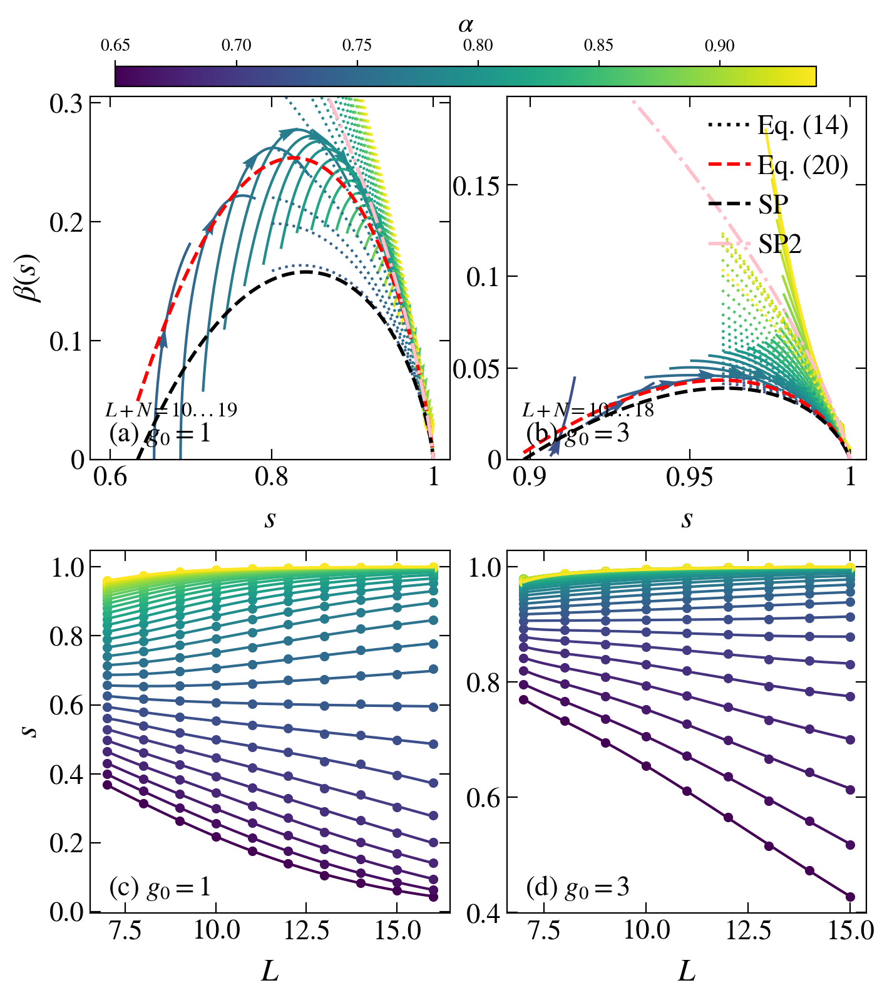

In [188]:
L_total=15
J=0.5
alfa=1.0
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0

alfa_vals = np.linspace(0.65, 0.94, 30)
print(alfa_vals)

sub_sizes = np.arange(0, L+1)
fig, ax = plt.subplots( nrows=2, ncols=2, figsize=(8,8), dpi = 200)
axis = np.array(ax[0,:])
axis2 = np.array(ax[1,:])


interpolate = 1
use_fit = 1
bin_size = 5
use_area_collapse = 1
dalfa = 0.06

def envelope_pred(x, nu, s1c):
    return -1/nu * (1 - x) * np.log( s1c * (1 - x) / ( x * (1-s1c) ))
    

def entropy_fit(L, c, eta):
    return c * np.exp(-eta * L)
            
def beta0_fun(x, c_ = 1):
    return -(1 - x) / x * np.log( (1 - x) / c_ )

def pade_fun(x, c0, c1, d0, d1):#, c0, d0):
    return (x**2 + c1 * x + c0) / (x**2 + d1 * x + d0)

def other_fit(x, c0, c1, c2, c3, c4):#, b): 
    return c4 / x**0.5 + c3 / x**3 + c2 / x**2 + c1 / x + c0 # + a / x**4 + b / x**5

def pade_fun_deriv(x, c1, c2, d1, d2):
    return -(x**2 + c1 * x + c2) * (d1 + 2*x) / (x**2 + d1 * x + d2)**2 + (c1 + 2*x) / (d2 + d1*x + x**2)

def other_fit_deriv(x, c1, c2, c3, c4):
    return -3 * c1 / x**4 - 2 * c2 / x**3 - c3 / x**2


p = 1       # number of last spins
nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu
Lstep = 1 if p > 0 else 2

sizes = np.arange(6, 19, 1 if p > 0 else 2)

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
ylab = r"$\beta(X)$"
alfa_min = 0.7

# def other_fit(x, c1, c2, c3, c4, c5):
#     return c1 * (x)**4 + c2 * (x)**3 + c3 * (x)**2 + c4 * (x) + c5
for idx1, J in enumerate([1, 3]):
    if J == 0.5:  pars2 = [4.092695889007306, 0.28438454954494563]
    if J == 1.0:  pars2 = [3.656472341847031, 0.08124292114018893]
    if J == 2.0:  pars2 = [2.765914674806553, 0.04100142006507729]
    if J == 3.0:  pars2 = [2.368117374274424, 0.03226345622890216]
    sizes = np.arange(10, 19, Lstep)
    
    alfa_crit = 0.75
    s1_crit = 1
    if J == 0.1:    alfa_crit = 0.8838011380886784; s1_crit = 0.11432584064242023; sizes = np.arange(10, 15, Lstep); nu = 0.66573; s1_min = 0.2; 
    elif J == 0.2:  alfa_crit = 0.8088393000000000; s1_crit = 0.19575772032771582; sizes = np.arange(10, 16, Lstep); nu = 0.63364; s1_min = 0.4; 
    elif J == 0.3:  alfa_crit = 0.7969816538376154; s1_crit = 0.27426435352423423; sizes = np.arange(10, 16, Lstep); nu = 0.61334; s1_min = 0.5; 
    elif J == 0.5:  alfa_crit = 0.7612779024078085; s1_crit = 0.39861912483317125; sizes = np.arange(10, 20, Lstep); nu = 0.60945; s1_min = 0.6; 
    elif J == 1:    alfa_crit = 0.7294402852322444; s1_crit = 0.63371037671674502; sizes = np.arange(10, 20, Lstep); nu = 0.68639; s1_min = 0.8; 
    elif J == 2:    alfa_crit = 0.720371246397683;  s1_crit = 0.83680062093580853; sizes = np.arange(10, 20, Lstep); nu = 0.79797; s1_min = 0.95;
    elif J == 3:    alfa_crit = 0.7167352842108217; s1_crit = 0.89797378899120622; sizes = np.arange(10, 19, Lstep); nu = 0.80775; s1_min = 0.96;
    else:           alfa_crit = 1/np.sqrt(2)
    
    
    
    
    
    alfa_min = alfa_crit + 0.0
    
    interaction = []
    ydata = []
    for L_total in sizes:
        sub_sizes = np.arange(0, L_total+1)
        L = L_total - N
        LA = L_total - p if p > 0 else L_total // 2

        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
        else:
            print(name_out)
        entropy = entropy_site[LA] / (p*np.log(2)) if p > 0 else entropy[LA] / page(LA, L_total-LA)
        interaction.append(alfa_vals)
        ydata.append( entropy )

    # alfa_min = alfa_crit - 0.06

    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    norm = matplotlib.colors.Normalize(
        vmin=np.min(alfa_vals),
        vmax=np.max(alfa_vals))


    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])

    ydata = np.transpose( np.array(ydata) )

    idx_c = 0

    envelope_ydata = []
    envelope_xdata = []
    yax_max = -10
    yax_min = 10
    for ii_a, alfa in enumerate(alfa_vals):
        # if alfa < alfa_min: continue
        if alfa == alfa_crit: idx_c = ii_a
        # col = 'red' if alfa==alfa_crit else s_m.to_rgba(alfa)
        col = s_m.to_rgba(alfa)

        xx = sizes - N
        yy = ydata[ii_a]
        
        axis2[idx1].scatter(xx, yy, color=col, s=20)
        if alfa > alfa_min:
            pars, pconv = fit(entropy_fit,
                            xdata = xx[-6:],
                            ydata = 1 - yy[-6:],
                            maxfev = 10000
                            )
            eta = -pars[0]
            c = pars[1]
            sp = np.linspace(s1_min, 1, 1000)
            axis[idx1].plot(sp, beta0_fun(sp, c_=pars[0]), lw=1.5, color=col, ls=':')
        # sp = np.linspace(s1_min, 1, 1000)
        # axis[idx1].plot(sp, envelope_pred(sp, nu, s1_crit) + np.log(c) * (1 - sp) * (sp - s1_crit)**0.5, lw=1.5, color=col, ls='-.')
        if interpolate:
            spl = splrep(xx, yy, k=3 if alfa < alfa_crit + 0.05 else 3, s=0)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
            yy = splev(xx, spl)
            
        # xx = 2**xx
        if not use_fit:
            # f = splrep(xx, yy, k=3 if alfa < alfa_crit + 0.08 else 5, s=1)
            # xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
            # yy = splev(xx, f)
            if use_area_collapse: xx = np.log(xx)
            beta = diff_central(xx, np.log(yy))
            xx_beta = yy[1:-1]
            
            envelope_ydata.append(beta[-1])
            envelope_xdata.append(xx_beta[-1])
            
            if alfa > alfa_min:
                axis[idx1].plot(xx_beta, beta, marker='o', markersize=2, lw=1.5, color=col)
            
            if min(beta) < yax_min: yax_min = min(beta)
            if max(beta) > yax_max: yax_max = max(beta)
            i1 = xx.size // 2-1
            u = xx_beta[i1+1] - xx_beta[i1]
            v = beta[i1+1] - beta[i1]
            pos_x = xx_beta[i1] + u/2
            pos_y = beta[i1] + v/2
            norm = np.sqrt(u**2+v**2)

            if alfa > alfa_min:
                axis[idx1].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", color=col, lw=0)
        else:

            my_fit = pade_fun if alfa > alfa_crit else other_fit
            my_fit_deriv = pade_fun_deriv if alfa > alfa_crit else other_fit_deriv
            pars, pconv = fit(my_fit,
                                xdata = xx,
                                ydata = yy,
                                maxfev = 10000
                                )
            xL = np.linspace(xx[0], xx[-1], 10000)
            smooth_data = my_fit(xL, *pars)
            axis2[idx1].plot(xL, smooth_data, color=col)
            
            # deriv       = my_fit_deriv(xL, *pars) * xL / smooth_data
            deriv = np.gradient( np.log(smooth_data), np.log(xL) )

            if alfa > alfa_min:
                axis[idx1].plot(smooth_data, deriv, lw=1.5, color=col, zorder=-2)
            
            if min(deriv) < yax_min: yax_min = min(deriv)
            if max(deriv) > yax_max: yax_max = max(deriv)
            
            # envelope_ydata = [*envelope_ydata, *deriv]
            # envelope_xdata = [*envelope_xdata, *smooth_data]
            envelope_ydata = [*envelope_ydata, deriv[-1]]
            envelope_xdata = [*envelope_xdata, smooth_data[-1]]

            i1 = smooth_data.size // 2
            u = smooth_data[i1+1] - smooth_data[i1]
            v = deriv[i1+1] - deriv[i1]
            pos_x = smooth_data[i1] + u/2
            pos_y = deriv[i1] + v/2
            norm = np.sqrt(u**2+v**2)
        
            if alfa > alfa_min:
                axis[idx1].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=-1, pivot="mid", 
                               linewidth=0, width=0.02, headwidth=3, color=col, lw=0)
            
    # sorting X and Y data according to increasing X
    permut = np.argsort( np.array(envelope_xdata) )
    envelope_ydata = np.array(envelope_ydata)[permut]
    envelope_xdata = np.array(envelope_xdata)[permut]

    size = len(envelope_xdata)
    envelope = np.zeros( (size // bin_size) )
    xxx = np.zeros( (size // bin_size) )

    # Finding maximum Y in each bin of 20 points of interpolated data
    for k in range(envelope.size):
        idx_r = (k+1) * bin_size if k < envelope.size-1 else -1
        idx = np.argmax(envelope_ydata[k * bin_size : idx_r])
        envelope[k] = envelope_ydata[k * bin_size : idx_r][idx]
        xxx[k]      = envelope_xdata[k * bin_size : idx_r][idx]
    xxx = envelope_xdata
    envelope = envelope_ydata
    # axis[idx1].plot(xxx, envelope, lw=2, color='k', ls='--')

    def beta_sp(x):
        return -(1-x) * np.log(1-x) / x
    
    sp = np.linspace(s1_crit, 1, 10000)
    # print("aa", p)
    # axis[idx1].plot(sp, beta_sp(sp), lw=2, color='gray', ls='--', label=r"${\beta}_{0}$" if idx1 == 1 else "")
    # inset.plot(sp, beta_sp(sp), lw=1, color='gray', ls='--')
    axis[idx1].plot(np.nan, np.nan, lw=2, color='k', ls=':', label=r"Eq. (14)" if idx1 == 1 else "")
    # axis[idx1].plot(sp, envelope_pred(sp, nu, s1_crit), lw=2, color='red', ls='--', label=r"${\beta}^*$" if idx1 == 0 else "")
    
    def envelope_ansatz(x, A, C):
        return -(1 - x) * np.log((1 - x) / C) + np.log(x) - A * x * np.log(x)
    
    axis[idx1].plot(sp, envelope_ansatz(sp, *pars2), lw=2, color='red', ls='--', label=r"Eq. (20)" if idx1 == 1 else "")
    axis[idx1].plot(sp, envelope_sp(sp, s1_crit), lw=2, color='k', ls='--', label=r"SP" if idx1 == 1 else "")
    axis[idx1].plot(sp, -(1-sp) / sp * np.log(1-sp), lw=2, color='pink', ls='-.', label=r"SP2" if idx1 == 1 else "")

    # axis[idx1].set_xlim(min(envelope_xdata)*0.9, 1)
    axis[idx1].set_ylim(0, None)
    axis[idx1].set_ylim(0, 1.1*yax_max)
    # if J == 1:
    #     # axis[idx1].set_xlim(0.3, 1.0)
    #     axis[idx1].set_ylim(1.25*yax_min, 1.5*yax_max)
    # if J == 2:
    #     # axis[idx1].set_xlim(0.32, 1.0)
    #     axis[idx1].set_xlim(min(envelope_xdata)*0.99, 1)
    #     axis[idx1].set_ylim(1.5*yax_min, 1.5*yax_max)
    # if J == 3:
    #     # axis[idx1].set_xlim(0.35, 1.0)
    #     axis[idx1].set_xlim(min(envelope_xdata)*0.99, 1)
    #     axis[idx1].set_ylim(1.4*yax_min, 1.1*yax_max)
    
    # axis[idx1].scatter(s1_crit, 0.0, marker='s', color='red', zorder=0, label=r"$s_1^c$" if idx1 == 2 else "")
    
    axis[idx1].axhline(y=0, ls='-', c='k', lw=1)
    xlab = r"${s}$"
    # ylab = r"$\tilde{\beta}($" + xlab + "$)$" if use_area_collapse else r"${\beta}($" + xlab + "$)$"
    ylab = r"${\beta}($" + xlab + "$)$"
    fig_help.set_plot_elements(axis[idx1], xlabel=xlab, ylabel=ylab if idx1 == 0 else "", font_size=16, set_legend=False, xscale='linear')
    fig_help.set_legend(axis[idx1], loc = 'upper right', fontsize=16)

    fig_help.set_plot_elements(axis2[idx1], xlabel=r"$L$", ylabel=xlab if idx1 == 0 else "", font_size=16, set_legend=False, xscale='linear', yscale='linear')

    axis[idx1].annotate(r"$L+N=%d...%d$"%(min(sizes), max(sizes)), fontsize=12, xy=(0.04, 0.12), xycoords='axes fraction')

# cbar = None

# divider = make_axes_locatable(axis[0])
# cax = divider.new_vertical(size = '4%', pad = 0.05)

# fig.add_axes(cax)
# cbar = fig.colorbar(s_m, cax = cax, orientation = 'horizontal')
# cax.xaxis.set_ticks_position('top')
# cax.xaxis.set_label_position('top')

# cbar.set_label(r"$\alpha$", fontsize=16)
    
fig.subplots_adjust(top=0.94)
cbar_ax = fig.add_axes([0.15, 0.95, 0.7, 0.02])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1, orientation = 'horizontal')
cbar.set_label(r"$\alpha$", fontsize=16)
cbar_ax.xaxis.set_ticks_position('top')
cbar_ax.xaxis.set_label_position('top')

for aa in [axis]:
    for ax in np.array(aa).flatten():
        ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))

axis[0].annotate(r"(a) $g_0=1$", fontsize=16, xy=(0.05, 0.05), xycoords='axes fraction')
axis[1].annotate(r"(b) $g_0=3$", fontsize=16, xy=(0.05, 0.05), xycoords='axes fraction')
# axis[2].annotate(r"(c) $g_0=3.0$", fontsize=16, xy=(0.05, 0.05), xycoords='axes fraction')
axis2[0].annotate(r"(c) $g_0=1$", fontsize=16, xy=(0.05, 0.05), xycoords='axes fraction')
axis2[1].annotate(r"(d) $g_0=3$", fontsize=16, xy=(0.05, 0.05), xycoords='axes fraction')
# axis2[2].annotate(r"(f) $g_0=3.0$", fontsize=16, xy=(0.05, 0.05), xycoords='axes fraction')
# axis[3].annotate(r"(d) $g_0=3.0$", fontsize=14, xy=(0.02, 0.94), xycoords='axes fraction')
# axis[0].set_title(r"$N=3, \gamma=%.1f$"%(gamma), fontsize=16)
# axis[1].set_title(r"$N=5, \gamma=%.1f$"%(gamma), fontsize=16)

fig.subplots_adjust(wspace = 0.16, hspace=0.25)
fig.savefig("plots_beta/FigS3.pdf", bbox_inches = 'tight', pad_inches=0.02)
# 

No handles with labels found to put in legend.


[0.65 0.66 0.67 0.68 0.69 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78
 0.79 0.8  0.81 0.82 0.83 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92
 0.93 0.94]
J= 2   alfa= 0.73   eta= 0.026095253959596065   c= 0.1743438154447218
J= 2   alfa= 0.74   eta= 0.051745554950471416   c= 0.18367437255754204
J= 2   alfa= 0.75   eta= 0.07814713291215818   c= 0.19443895513444567
J= 2   alfa= 0.76   eta= 0.10577138133693766   c= 0.2079168152799188
J= 2   alfa= 0.77   eta= 0.13381920387322485   c= 0.22309737804420646
J= 2   alfa= 0.78   eta= 0.16039173752315491   c= 0.23647927307419658
J= 2   alfa= 0.79   eta= 0.187879351300882   c= 0.2528407825752468
J= 2   alfa= 0.8   eta= 0.2154735853007548   c= 0.2714004711580246
J= 2   alfa= 0.81   eta= 0.242719979103747   c= 0.2907868937623706
J= 2   alfa= 0.82   eta= 0.269786564649981   c= 0.3126659306926047
J= 2   alfa= 0.83   eta= 0.2972539174194151   c= 0.3379178717158351
J= 2   alfa= 0.84   eta= 0.32409102824890107   c= 0.3650427627570487
J= 2   alfa= 0.85   e

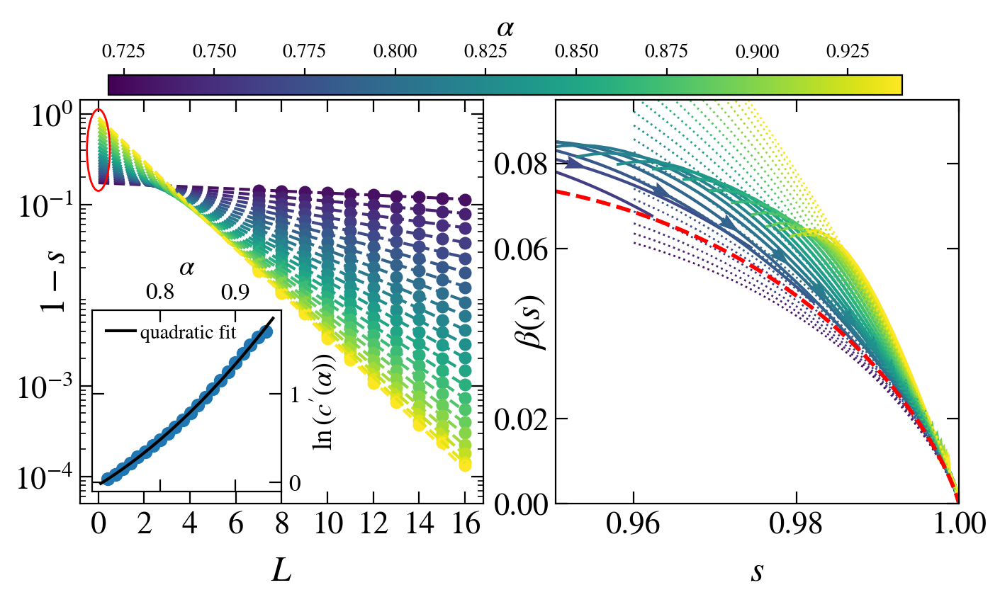

In [254]:
L_total=15
J=2
alfa=1.0
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0

alfa_vals = np.linspace(0.65, 0.94, 30)
print(alfa_vals)

sub_sizes = np.arange(0, L+1)
fig, axes = plt.subplots( nrows=1, ncols=2, figsize=(8,3.5), dpi = 200)
axis = [axes[1], axes[0]]

inset = axis[1].inset_axes([0.03, 0.03, 0.47, 0.45])

interpolate = 0
use_fit = 1
bin_size = 5
use_area_collapse = 1
dalfa = 0.04


def beta0_fun(x, c_ = 1):
    return -(1 - x) / x * np.log( (1 - x) / c_ )

def entropy_fit(L, c, eta):
    return c * np.exp(-eta * L)

def pade_fun(x, c1, c2, d1, d2):
    return ( x**2 + c1 * x + c2) / (x**2 + d1 * x + d2)

def other_fit(x, c1, c2, c3, c4):
    return c1 / x**3 + c2 / x**2 + c3 / x**1 + c4


p = 1       # number of last spins
nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

sizes = np.arange(6, 19, 1 if p > 0 else 2)

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
ylab = r"$\beta(X)$"

alfa_min = 0.75

sizes = np.arange(10, 19, 1 if p > 0 else 2)

alfa_crit = 0.75
s1_crit = 1
s1_crit = 1

if J == 0.5:  pars2 = [4.092695889007306, 0.28438454954494563]
if J == 1.0:  pars2 = [3.656472341847031, 0.08124292114018893]
if J == 2.0:  pars2 = [2.765914674806553, 0.04100142006507729]
if J == 3.0:  pars2 = [2.368117374274424, 0.03226345622890216]

if J == 0.1:    alfa_crit = 0.8838011380886784; s1_crit = 0.11432584064242023; sizes = np.arange(10, 15, Lstep); nu = 0.66573; s1_min = 0.2; 
elif J == 0.2:  alfa_crit = 0.8088393000000000; s1_crit = 0.19575772032771582; sizes = np.arange(10, 16, Lstep); nu = 0.63364; s1_min = 0.4; 
elif J == 0.3:  alfa_crit = 0.7969816538376154; s1_crit = 0.27426435352423423; sizes = np.arange(10, 16, Lstep); nu = 0.61334; s1_min = 0.5; 
elif J == 0.5:  alfa_crit = 0.7612779024078085; s1_crit = 0.3975596423927653; s1_min = 0.6;  sizes = np.arange(10, 20, 1 if p > 0 else 2); nu = 0.61
elif J == 1:    alfa_crit = 0.7294402852322444; s1_crit = 0.5976612536491842; s1_min = 0.83; sizes = np.arange(10, 20, 1 if p > 0 else 2); nu = 0.68
elif J == 2:    alfa_crit = 0.7207704442893257; s1_crit = 0.8326330851556897; s1_min = 0.96; sizes = np.arange(10, 20, 1 if p > 0 else 2); nu = 0.79
elif J == 3:    alfa_crit = 0.71795404;         s1_crit = 0.9063184653468818; s1_min = 0.98; sizes = np.arange(10, 17, 1 if p > 0 else 2); nu=0.8
else:           alfa_crit = 1/np.sqrt(2)


alfa_min = alfa_crit + 0.0

interaction = []
ydata = []
for L_total in sizes:
    sub_sizes = np.arange(0, L_total+1)
    L = L_total - N
    LA = L_total - p if p > 0 else L_total // 2

    name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

    if exists(name_out):
        with h5py.File(name_out, "r") as file:
            alfa_vals    = np.array(file.get('interaction'))
            gap_ratio    = np.array(file.get('gap_ratio'))
            entropy      = np.array(file.get('entropy'))
            entropy_site = np.array(file.get('single_site_entropy'))
    else:
        print(name_out)
    entropy = entropy[LA] / (p*np.log(2)) if p > 0 else entropy[LA] / page(LA, L_total-LA)
    interaction.append(alfa_vals)
    ydata.append(entropy)

# alfa_min = alfa_crit - 0.06

# norm is a class which, when called, can normalize data into the
# [0.0, 1.0] interval.
norm = matplotlib.colors.Normalize(
    vmin=max(alfa_min, np.min(alfa_vals)),
    vmax=np.max(alfa_vals))


# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
s_m.set_array([])

ydata = np.transpose( np.array(ydata) )

idx_c = 0

envelope_ydata = []
envelope_xdata = []
yax_max = -10
yax_min = 10
prefactor = []
alfa_plot = []
for ii_a, alfa in enumerate(alfa_vals):
    if alfa < alfa_min: continue
    if alfa == alfa_crit: idx_c = ii_a
    # col = 'red' if alfa==alfa_crit else s_m.to_rgba(alfa)
    col = s_m.to_rgba(alfa)

    xx = sizes - N
    yy = ydata[ii_a]
    axis[1].scatter(xx, 1 - yy, marker='o', s=30, color=s_m.to_rgba(alfa))
    
    try:
        ii_cut = -10 if interpolate else -6
        ii_cut = -6
        pars, pconv= fit(entropy_fit,
                        xdata = xx,
                        ydata = 1 - yy)

        eta = pars[1]
        c = pars[0]
        print("J=", J, "  alfa=", np.round(alfa, 2), "  eta=", eta, "  c=", c)
        prefactor.append(c / (1-s1_crit))
        alfa_plot.append(alfa)
        dense_sizes = np.linspace(0*xx[ii_cut], xx[-1], 1000)
        axis[1].plot(dense_sizes, entropy_fit(dense_sizes, *pars), lw=1.5, color=s_m.to_rgba(alfa), ls = '--')
    except RuntimeError:
        print(alfa)
        
    sp = np.linspace(s1_min, 1, 1000)
    axis[0].plot(sp, beta0_fun(sp, c_=c), lw=1, color=col, ls=':')
    
    if interpolate:
        # print(alfa, xx, yy)
        # spl = make_spline(xx, yy)
        # yy = spl(xx)
        f = splrep(xx, yy, k=3 if alfa < alfa_crit + 0.08 else 5, s=5)
        xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 3)
        yy = splev(xx, f)
        
    if not use_fit:
        f = splrep(xx, yy, k=3 if alfa < alfa_crit + 0.08 else 3, s=2)
        yy = splev(xx, f)
        # if use_area_collapse: xx = np.log(xx)
        beta = diff_central(xx, (yy)) * xx[1:-1] / yy[1:-1]
        xx_beta = yy[1:-1]
        envelope_ydata.append(beta[-1])
        envelope_xdata.append(xx_beta[-1])
        
        axis[0].plot(xx_beta, beta, marker='o', markersize=2, lw=1.5, color=col)
        
        if min(beta) < yax_min: yax_min = min(beta)
        if max(beta) > yax_max: yax_max = max(beta)
        i1 = xx.size // 2
        u = xx_beta[i1+1] - xx_beta[i1]
        v = beta[i1+1] - beta[i1]
        pos_x = xx_beta[i1] + u/2
        pos_y = beta[i1] + v/2
        norm = np.sqrt(u**2+v**2)

        axis[0].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", color=col, lw=0)
    else:

        my_fit = pade_fun if alfa > alfa_crit else other_fit
        my_fit_deriv = pade_fun_deriv if alfa > alfa_crit else other_fit_deriv
        pars, pconv = fit(my_fit,
                            xdata = xx,
                            ydata = yy,
                            maxfev = 10000
                            )
        xL = np.linspace(xx[0], xx[-1], 50)
        smooth_data = my_fit(xL, *pars)
        deriv       = my_fit_deriv(xL, *pars) * xL / smooth_data
        # deriv = np.gradient( np.log(smooth_data), np.log(xL) )

        axis[0].plot(smooth_data, deriv, lw=1.5, color=col, zorder=-2)
        
        if min(deriv) < yax_min: yax_min = min(deriv)
        if max(deriv) > yax_max: yax_max = max(deriv)
        
        # envelope_ydata = [*envelope_ydata, *deriv]
        # envelope_xdata = [*envelope_xdata, *smooth_data]
        envelope_ydata = [*envelope_ydata, deriv[-1]]
        envelope_xdata = [*envelope_xdata, smooth_data[-1]]

        i1 = smooth_data.size // 2
        u = smooth_data[i1+1] - smooth_data[i1]
        v = deriv[i1+1] - deriv[i1]
        pos_x = smooth_data[i1] + u/2
        pos_y = deriv[i1] + v/2
        norm = np.sqrt(u**2+v**2)
    
        axis[0].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=-1, pivot="mid", 
                            linewidth=0, width=0.02, headwidth=3, color=col, lw=0)


axis[0].set_ylim(0, None)
axis[0].set_ylim(0, 1.1*yax_max)

alfa_plot = np.array(alfa_plot)
prefactor = np.array(prefactor)


def shit_fit(x, a, b, c):
    return a * x**2 + b * x + c

inset.plot((alfa_plot), np.log(prefactor), marker='o')
pars, pconv = fit(shit_fit,
                        xdata = alfa_plot,
                        ydata = np.log(prefactor),
                        maxfev = 10000
                        )
print("fitting c: ", *pars)
x = np.linspace(alfa_min, 0.95, 1000)
# print(lin_fit(x, *pars))
inset.plot(x, (shit_fit(x, *pars)), ls='-', c='k', label=r'quadratic fit')
c = np.exp(shit_fit(1, *pars)) #prefactor[-1]

axis[0].axhline(y=0, ls='-', c='k', lw=1)
xlab = r"$s$"
# ylab = r"$\tilde{\beta}($" + xlab + "$)$" if use_area_collapse else r"${\beta}($" + xlab + "$)$"
ylab = r"${\beta}($" + xlab + "$)$"
fig_help.set_plot_elements(axis[0], xlabel=xlab, ylabel=ylab, font_size=16, set_legend=False, xscale='linear')
fig_help.set_legend(axis[0], loc = 'lower left', fontsize=16)
cbar = None

# fig.subplots_adjust(right=0.94)
# cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
# # fig.colorbar(im, cax=cbar_ax)
# cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
# cbar.set_label(r"$\alpha$", fontsize=16)
# cbar.ax.tick_params(labelsize=15)
fig.subplots_adjust(top=0.94)
cbar_ax = fig.add_axes([0.15, 0.95, 0.7, 0.04])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1, orientation = 'horizontal')
cbar.set_label(r"$\alpha$", fontsize=16)
cbar_ax.xaxis.set_ticks_position('top')
cbar_ax.xaxis.set_label_position('top')


axis[0].plot(np.nan, np.nan, lw=2, color='k', ls=':', label=r"Eq. (14)")
sp = np.linspace(s1_crit, 1, 10000)        
axis[0].plot(sp, envelope_ansatz(sp, *pars2), lw=2, color='red', ls='--', label=r"Eq. (20)")
# axis[0].plot(sp, envelope_sp(sp, s1_crit), lw=2, color='k', ls='--', label=r"SP" if idx1 == 1 else "")


# axis[0].plot(sp, -(1-sp) / sp * np.log(1-sp) + (1-sp) * np.log(c), lw=2, color='pink', ls='-.', label=r"SP2" if idx1 == 1 else "")


fig_help.set_plot_elements(axis[1], ylabel=r"$1-s$", xlabel=r"$L$", font_size=16, set_legend=False, xscale='linear', yscale='log')
axis[1].set_xticks([0, 2, 4, 6, 8, 10, 12, 14, 16])

axis[1].yaxis.set_label_coords(-0.02, 0.55)
axis[1].set_yticks([1e-4, 1e-3, 1e-1, 1e0])
axis[0].yaxis.set_label_coords(-0.02, 0.45)
axis[0].set_yticks([0, 0.02, 0.06, 0.08])


hajt = 2
if J == 0.5:    hajt = 0.8;   ypos = 7
elif J == 1:    hajt = 0.5;   ypos = 1.5
elif J == 2:    hajt = 0.9;     ypos = 0.4
else:           alfa_crit = 1/np.sqrt(2)
x, y = 0, ypos

# use the axis scale tform to figure out how far to translate 
ell_offset = matplotlib.transforms.ScaledTranslation(x, y, axis[1].transScale)

# construct the composite tform
ell_tform = ell_offset + axis[1].transLimits + axis[1].transAxes

axis[1].add_patch(matplotlib.patches.Ellipse(xy=(0, 0), width=1, height=hajt, color="red", fill=False, lw=1, zorder=5, transform=ell_tform))
axis[1].set_ylim(5e-5, None)
axis[0].set_xlim(0.99*s1_min, 1)
# inset.set_ylim(0.251, 0.9)

inset.xaxis.set_label_position("top")
# inset.xaxis.set_label_coords(.5, 1.2)
inset.xaxis.tick_top()
inset.yaxis.set_label_position("right")
# inset.yaxis.set_label_coords(.5, 1.2)
inset.yaxis.tick_right()
fig_help.set_plot_elements(inset, ylabel=r"$\ln{(c'(\alpha))}$", xlabel=r"$\alpha$", font_size=12, set_legend=False, xscale='linear', yscale='linear')
fig_help.set_legend(inset, loc = 'upper left', fontsize=10)

# inset.set_yticks([0.3, 0.4, 0.5, 0.6, 0.8])
# inset.set_yticklabels(['0.3', '0.4', '0.5', '0.6', '0.8'])

fig.subplots_adjust(wspace = 0.18, hspace=0.13)
fig.savefig("plots_beta/Fig2.pdf", bbox_inches = 'tight', pad_inches=0.02)
# 

[0.65 0.66 0.67 0.68 0.69 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78
 0.79 0.8  0.81 0.82 0.83 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92
 0.93 0.94]
J= 0.5   alfa= 0.79   eta= 0.04245892692222062   c= 0.7489083238914406
J= 0.5   alfa= 0.8   eta= 0.06774057178578158   c= 0.8562993759452356
J= 0.5   alfa= 0.81   eta= 0.09707249922648152   c= 1.0043438307572818
J= 0.5   alfa= 0.82   eta= 0.125819641461412   c= 1.161018514401374
J= 0.5   alfa= 0.83   eta= 0.156457548333147   c= 1.3530255681679968
J= 0.5   alfa= 0.84   eta= 0.1868991663573186   c= 1.5626665580633152
J= 0.5   alfa= 0.85   eta= 0.21640595567558737   c= 1.781799001892686
J= 0.5   alfa= 0.86   eta= 0.24582327304130336   c= 2.0207579798738773
J= 0.5   alfa= 0.87   eta= 0.27444045323218025   c= 2.2696587687919885
J= 0.5   alfa= 0.88   eta= 0.30282331256033795   c= 2.534489783179736
J= 0.5   alfa= 0.89   eta= 0.3316158397885706   c= 2.8320161107381407
J= 0.5   alfa= 0.9   eta= 0.3597331889973158   c= 3.140409016127185


No handles with labels found to put in legend.


J= 0.5   alfa= 0.91   eta= 0.38744878241667385   c= 3.464386244891987
J= 0.5   alfa= 0.92   eta= 0.41538060508851826   c= 3.8225405742031096
J= 0.5   alfa= 0.93   eta= 0.44282231497454855   c= 4.196123736487366
J= 0.5   alfa= 0.94   eta= 0.4692506449809856   c= 4.565687845306296
fitting c:  9.587730624600862 -7.4858530154474


No handles with labels found to put in legend.


J= 1   alfa= 0.75   eta= 0.03942916494335789   c= 0.4262233809019315
J= 1   alfa= 0.76   eta= 0.0677096335987427   c= 0.4756459983989109
J= 1   alfa= 0.77   eta= 0.0984663309266536   c= 0.537555893367723
J= 1   alfa= 0.78   eta= 0.1278125394843079   c= 0.596390110472604
J= 1   alfa= 0.79   eta= 0.15647228391793605   c= 0.654451612016402
J= 1   alfa= 0.8   eta= 0.18435723456600497   c= 0.7115382680641934
J= 1   alfa= 0.81   eta= 0.21224339398955783   c= 0.7718484745253187
J= 1   alfa= 0.82   eta= 0.24011473812554604   c= 0.8354133960413163
J= 1   alfa= 0.83   eta= 0.2673945291066967   c= 0.8991708534443711
J= 1   alfa= 0.84   eta= 0.29366230266027804   c= 0.9602407688823854
J= 1   alfa= 0.85   eta= 0.3200280441620834   c= 1.0270850201653672
J= 1   alfa= 0.86   eta= 0.34527986056624177   c= 1.0903246424867412
J= 1   alfa= 0.87   eta= 0.37061710989446217   c= 1.1579982865459608
J= 1   alfa= 0.88   eta= 0.3958643467300082   c= 1.2332695373286753
J= 1   alfa= 0.89   eta= 0.41921431195305703

No handles with labels found to put in legend.


J= 2   alfa= 0.75   eta= 0.07814713291215818   c= 0.19443895513444567
J= 2   alfa= 0.76   eta= 0.10577138133693766   c= 0.2079168152799188
J= 2   alfa= 0.77   eta= 0.13381920387322485   c= 0.22309737804420646
J= 2   alfa= 0.78   eta= 0.16039173752315491   c= 0.23647927307419658
J= 2   alfa= 0.79   eta= 0.187879351300882   c= 0.2528407825752468
J= 2   alfa= 0.8   eta= 0.2154735853007548   c= 0.2714004711580246
J= 2   alfa= 0.81   eta= 0.242719979103747   c= 0.2907868937623706
J= 2   alfa= 0.82   eta= 0.269786564649981   c= 0.3126659306926047
J= 2   alfa= 0.83   eta= 0.2972539174194151   c= 0.3379178717158351
J= 2   alfa= 0.84   eta= 0.32409102824890107   c= 0.3650427627570487
J= 2   alfa= 0.85   eta= 0.35190002897334854   c= 0.39920132286359217
J= 2   alfa= 0.86   eta= 0.37897082786514175   c= 0.4361984129131623
J= 2   alfa= 0.87   eta= 0.4056696326757174   c= 0.47878721992509393
J= 2   alfa= 0.88   eta= 0.43203301373250363   c= 0.5281046640375356
J= 2   alfa= 0.89   eta= 0.457434714740

No handles with labels found to put in legend.


J= 3   alfa= 0.77   eta= 0.1473176356373129   c= 0.13865135062410536
J= 3   alfa= 0.78   eta= 0.176398552381595   c= 0.15064040386427296
J= 3   alfa= 0.79   eta= 0.20570546036555376   c= 0.1646072305213938
J= 3   alfa= 0.8   eta= 0.23629262434421772   c= 0.1827845416829045
J= 3   alfa= 0.81   eta= 0.26724545161958957   c= 0.20465281450414713
J= 3   alfa= 0.82   eta= 0.2987730944834175   c= 0.23166619053996185
J= 3   alfa= 0.83   eta= 0.3313705853596533   c= 0.2667124168054787
J= 3   alfa= 0.84   eta= 0.3656268892434619   c= 0.31417435885627654
J= 3   alfa= 0.85   eta= 0.4008089290646449   c= 0.3769672021627656
J= 3   alfa= 0.86   eta= 0.4368927005657184   c= 0.4610323088153504
J= 3   alfa= 0.87   eta= 0.4746457234365179   c= 0.580343715690971
J= 3   alfa= 0.88   eta= 0.5118506156372234   c= 0.740357896313466
J= 3   alfa= 0.89   eta= 0.5467210021846463   c= 0.9456862770177428
J= 3   alfa= 0.9   eta= 0.5767714341886855   c= 1.1854729596300524
J= 3   alfa= 0.91   eta= 0.6013170855462407  

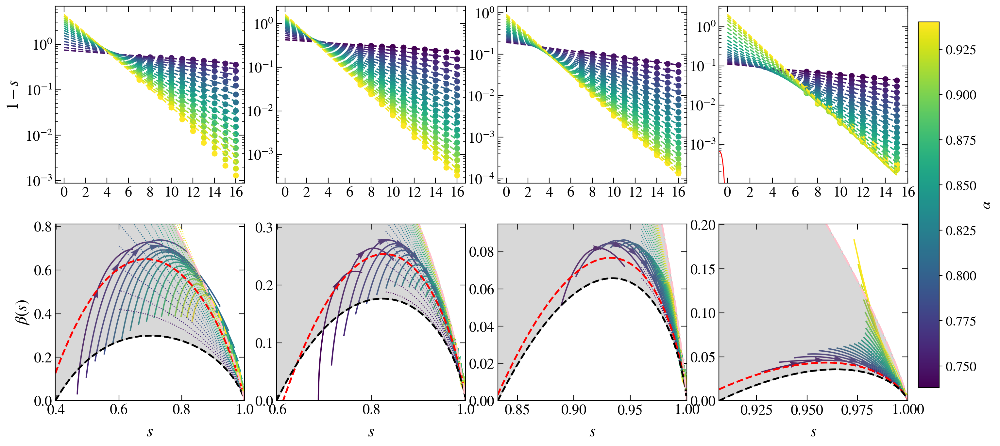

In [498]:
L_total=15
J=2
alfa=1.0
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0

alfa_vals = np.linspace(0.65, 0.94, 30)
print(alfa_vals)

sub_sizes = np.arange(0, L+1)
fig, axes = plt.subplots( nrows=2, ncols=4, figsize=(16, 8), dpi = 200)



interpolate = 0
use_fit = 1
bin_size = 5
use_area_collapse = 1
dalfa = 0.04


def beta0_fun(x, c_ = 1):
    return -(1 - x) / x * np.log( (1 - x) / c_ )

def entropy_fit(L, c, eta):
    return c * np.exp(-eta * L)

def pade_fun(x, c1, c2, d1, d2):
    return ( x**2 + c1 * x + c2) / (x**2 + d1 * x + d2)

def other_fit(x, c1, c2, c3, c4):
    return c1 / x**3 + c2 / x**2 + c3 / x**1 + c4


p = 1       # number of last spins
nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

sizes = np.arange(6, 19, 1 if p > 0 else 2)

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
ylab = r"$\beta(X)$"
alfa_min = 0.8

sizes = np.arange(10, 19, 1 if p > 0 else 2)

alfa_crit = 0.75
s1_crit = 1
s1_crit = 1

for idx1, J in enumerate( [0.5, 1, 2, 3] ):

    axis = [axes[1][idx1], axes[0][idx1]]
    
    if J == 0.5:  pars2 = [4.092695889007306, 0.28438454954494563]
    if J == 1.0:  pars2 = [3.656472341847031, 0.08124292114018893]
    if J == 2.0:  pars2 = [2.765914674806553, 0.04100142006507729]
    if J == 3.0:  pars2 = [2.368117374274424, 0.03226345622890216]

    if J == 0.1:    alfa_crit = 0.8838011380886784; s1_crit = 0.11432584064242023; sizes = np.arange(10, 15, Lstep); nu = 0.66573; s1_min = 0.2; 
    elif J == 0.2:  alfa_crit = 0.8088393000000000; s1_crit = 0.19575772032771582; sizes = np.arange(10, 16, Lstep); nu = 0.63364; s1_min = 0.4; 
    elif J == 0.3:  alfa_crit = 0.7969816538376154; s1_crit = 0.27426435352423423; sizes = np.arange(10, 16, Lstep); nu = 0.61334; s1_min = 0.5; 
    elif J == 0.5:  alfa_crit = 0.7612779024078085; s1_crit = 0.3975596423927653; s1_min = 0.6;  sizes = np.arange(10, 20, 1 if p > 0 else 2); nu = 0.61
    elif J == 1:    alfa_crit = 0.7294402852322444; s1_crit = 0.5976612536491842; s1_min = 0.83; sizes = np.arange(10, 20, 1 if p > 0 else 2); nu = 0.68
    elif J == 2:    alfa_crit = 0.7207704442893257; s1_crit = 0.8326330851556897; s1_min = 0.96; sizes = np.arange(10, 20, 1 if p > 0 else 2); nu = 0.79
    elif J == 3:    alfa_crit = 0.71795404;         s1_crit = 0.9063184653468818; s1_min = 0.98; sizes = np.arange(10, 19, 1 if p > 0 else 2); nu=0.8
    else:           alfa_crit = 1/np.sqrt(2)


    alfa_min = alfa_crit + 0.02

    interaction = []
    ydata = []
    for L_total in sizes:
        sub_sizes = np.arange(0, L_total+1)
        L = L_total - N
        LA = L_total - p if p > 0 else L_total // 2

        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
        else:
            print(name_out)
        entropy = entropy[LA] / (p*np.log(2)) if p > 0 else entropy[LA] / page(LA, L_total-LA)
        interaction.append(alfa_vals)
        ydata.append(entropy)

    # alfa_min = alfa_crit - 0.06

    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    norm = matplotlib.colors.Normalize(
        vmin=max(alfa_min, np.min(alfa_vals)),
        vmax=np.max(alfa_vals))


    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])

    ydata = np.transpose( np.array(ydata) )

    idx_c = 0

    envelope_ydata = []
    envelope_xdata = []
    yax_max = -10
    yax_min = 10
    prefactor = []
    alfa_plot = []
    for ii_a, alfa in enumerate(alfa_vals):
        if alfa < alfa_min: continue
        if alfa == alfa_crit: idx_c = ii_a
        # col = 'red' if alfa==alfa_crit else s_m.to_rgba(alfa)
        col = s_m.to_rgba(alfa)

        xx = sizes - N
        yy = ydata[ii_a]
        axis[1].scatter(xx, 1 - yy, marker='o', s=30, color=s_m.to_rgba(alfa))
        
        try:
            ii_cut = -10 if interpolate else -6
            ii_cut = -6
            pars, pconv= fit(entropy_fit,
                            xdata = xx,
                            ydata = 1 - yy)

            eta = pars[1]
            c = pars[0]
            print("J=", J, "  alfa=", np.round(alfa, 2), "  eta=", eta, "  c=", c)
            prefactor.append(c)
            alfa_plot.append(alfa)
            dense_sizes = np.linspace(0*xx[ii_cut], xx[-1], 1000)
            axis[1].plot(dense_sizes, entropy_fit(dense_sizes, *pars), lw=1.5, color=s_m.to_rgba(alfa), ls = '--')
        except RuntimeError:
            print(alfa)
            
        sp = np.linspace(s1_min, 1, 1000)
        axis[0].plot(sp, beta0_fun(sp, c_=c), lw=1, color=col, ls=':')
        
        if interpolate:
            # print(alfa, xx, yy)
            # spl = make_spline(xx, yy)
            # yy = spl(xx)
            f = splrep(xx, yy, k=3 if alfa < alfa_crit + 0.08 else 5, s=5)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 3)
            yy = splev(xx, f)
            
        if not use_fit:
            f = splrep(xx, yy, k=3 if alfa < alfa_crit + 0.08 else 3, s=2)
            yy = splev(xx, f)
            # if use_area_collapse: xx = np.log(xx)
            beta = diff_central(xx, (yy)) * xx[1:-1] / yy[1:-1]
            xx_beta = yy[1:-1]
            envelope_ydata.append(beta[-1])
            envelope_xdata.append(xx_beta[-1])
            
            axis[0].plot(xx_beta, beta, marker='o', markersize=2, lw=1.5, color=col)
            
            if min(beta) < yax_min: yax_min = min(beta)
            if max(beta) > yax_max: yax_max = max(beta)
            i1 = xx.size // 2
            u = xx_beta[i1+1] - xx_beta[i1]
            v = beta[i1+1] - beta[i1]
            pos_x = xx_beta[i1] + u/2
            pos_y = beta[i1] + v/2
            norm = np.sqrt(u**2+v**2)

            axis[0].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", color=col, lw=0)
        else:

            my_fit = pade_fun if alfa > alfa_crit else other_fit
            my_fit_deriv = pade_fun_deriv if alfa > alfa_crit else other_fit_deriv
            pars, pconv = fit(my_fit,
                                xdata = xx,
                                ydata = yy,
                                maxfev = 10000
                                )
            xL = np.linspace(xx[0], xx[-1], 50)
            smooth_data = my_fit(xL, *pars)
            deriv       = my_fit_deriv(xL, *pars) * xL / smooth_data
            # deriv = np.gradient( np.log(smooth_data), np.log(xL) )

            axis[0].plot(smooth_data, deriv, lw=1.5, color=col, zorder=-2)
            
            if min(deriv) < yax_min: yax_min = min(deriv)
            if max(deriv) > yax_max: yax_max = max(deriv)
            
            # envelope_ydata = [*envelope_ydata, *deriv]
            # envelope_xdata = [*envelope_xdata, *smooth_data]
            envelope_ydata = [*envelope_ydata, deriv[-1]]
            envelope_xdata = [*envelope_xdata, smooth_data[-1]]

            i1 = smooth_data.size // 2
            u = smooth_data[i1+1] - smooth_data[i1]
            v = deriv[i1+1] - deriv[i1]
            pos_x = smooth_data[i1] + u/2
            pos_y = deriv[i1] + v/2
            norm = np.sqrt(u**2+v**2)
        
            axis[0].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=-1, pivot="mid", 
                                linewidth=0, width=0.02, headwidth=3, color=col, lw=0)


    axis[0].set_ylim(0, None)
    axis[0].set_ylim(0, 1.1*yax_max)

    alfa_plot = np.array(alfa_plot)
    prefactor = np.array(prefactor)


    def shit_fit(x, a, b):
        return a * x + b

    inset.plot((alfa_plot), np.log(prefactor), marker='o')
    pars, pconv = fit(shit_fit,
                            xdata = alfa_plot[-6:],
                            ydata = np.log(prefactor)[-6:],
                            maxfev = 10000
                            )
    print("fitting c: ", *pars)
    x = np.linspace(0.8, 0.9999, 1000)
    # print(lin_fit(x, *pars))
    inset.plot(x, (shit_fit(x, *pars)), ls='-', c='k', label=r'linear fit')
    c = np.exp(shit_fit(1, *pars)) #prefactor[-1]

    axis[0].axhline(y=0, ls='-', c='k', lw=1)
    xlab = r"$s$"
    # ylab = r"$\tilde{\beta}($" + xlab + "$)$" if use_area_collapse else r"${\beta}($" + xlab + "$)$"
    ylab = r"${\beta}($" + xlab + "$)$"
    fig_help.set_plot_elements(axis[0], xlabel=xlab, ylabel=ylab if idx1==0 else "", font_size=16, set_legend=False, xscale='linear')
    fig_help.set_legend(axis[0], loc = 'lower left', fontsize=16)
    
    axis[0].plot(np.nan, np.nan, lw=2, color='k', ls=':', label=r"Eq. (14)")
    sp = np.linspace(s1_crit, 1, 10000)        
    axis[0].plot(sp, envelope_ansatz(sp, *pars2), lw=2, color='red', ls='--', label=r"Eq. (20)")
    axis[0].plot(sp, envelope_sp(sp, s1_crit), lw=2, color='k', ls='--', label=r"SP" if idx1 == 1 else "")


    axis[0].plot(sp, -(1-sp) / 1 * np.log( (1-sp) /c), lw=2, color='pink', ls='-.', label=r"SP2" if idx1 == 1 else "")

    axis[0].fill_between(sp, envelope_sp(sp, s1_crit), -(1-sp) / 1 * np.log( (1-sp) /c), color='gray', alpha=0.3)


    fig_help.set_plot_elements(axis[1], ylabel=r"$1-s$" if idx1==0 else "", xlabel=r"$L$" if idx1>3 else "", font_size=16, set_legend=False, xscale='linear', yscale='log')
    axis[1].set_xticks([0, 2, 4, 6, 8, 10, 12, 14, 16])

    # hajt = 2
    # if J == 0.5:    hajt = 0.8;   ypos = 7
    # elif J == 1:    hajt = 0.5;   ypos = 1.5
    # elif J == 2:    hajt = 0.7;     ypos = 0.5
    # else:           alfa_crit = 1/np.sqrt(2)
    # x, y = 0, ypos

    # # use the axis scale tform to figure out how far to translate 
    # ell_offset = matplotlib.transforms.ScaledTranslation(x, y, axis[1].transScale)

    # # construct the composite tform
    # ell_tform = ell_offset + axis[1].transLimits + axis[1].transAxes

    axis[1].add_patch(matplotlib.patches.Ellipse(xy=(0, 0), width=1, height=hajt, color="red", fill=False, lw=1, zorder=5, transform=ell_tform))
    # axis[1].set_ylim(5e-5, None)
    axis[0].set_xlim( np.mean([s1_crit, s1_crit]), 1)
    # inset.set_ylim(0.251, 0.9)

    # inset.set_yticks([0.3, 0.4, 0.5, 0.6, 0.8])
    # inset.set_yticklabels(['0.3', '0.4', '0.5', '0.6', '0.8'])
cbar = None

fig.subplots_adjust(right=0.94)
cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$\alpha$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

fig.subplots_adjust(wspace = 0.17, hspace=0.23)
    # fig.savefig("plots_beta/Fig2.pdf", bbox_inches = 'tight', pad_inches=0.02)
    # z

## Fig 4

J= 0.5   alfa= 0.77   eta= 0.008004651122595258   c= 0.6557443869825897   zeta= 0
J= 0.5   alfa= 0.78   eta= 0.028329166565380322   c= 0.7411804082045729   zeta= 0
J= 0.5   alfa= 0.79   eta= 0.05656417399316172   c= 0.9033580022290353   zeta= 0
J= 0.5   alfa= 0.8   eta= 0.08967213194243243   c= 1.1405229337971337   zeta= 0
J= 0.5   alfa= 0.81   eta= 0.12999619730346146   c= 1.530526770193937   zeta= 0
J= 0.5   alfa= 0.82   eta= 0.16907261659427422   c= 1.9946545764723513   zeta= 0
J= 0.5   alfa= 0.83   eta= 0.2126219004794394   c= 2.686520250623637   zeta= 0
J= 0.5   alfa= 0.84   eta= 0.2558487443185617   c= 3.551307791667405   zeta= 0
J= 0.5   alfa= 0.85   eta= 0.2966772461974224   c= 4.528853555656698   zeta= 0
J= 0.5   alfa= 0.86   eta= 0.33733482816954985   c= 5.710826975653607   zeta= 0
J= 0.5   alfa= 0.87   eta= 0.37517095420693963   c= 6.942887640884616   zeta= 0
J= 0.5   alfa= 0.88   eta= 0.411215582021575   c= 8.23910256257254   zeta= 0
J= 0.5   alfa= 0.89   eta= 0.44759278467

No handles with labels found to put in legend.


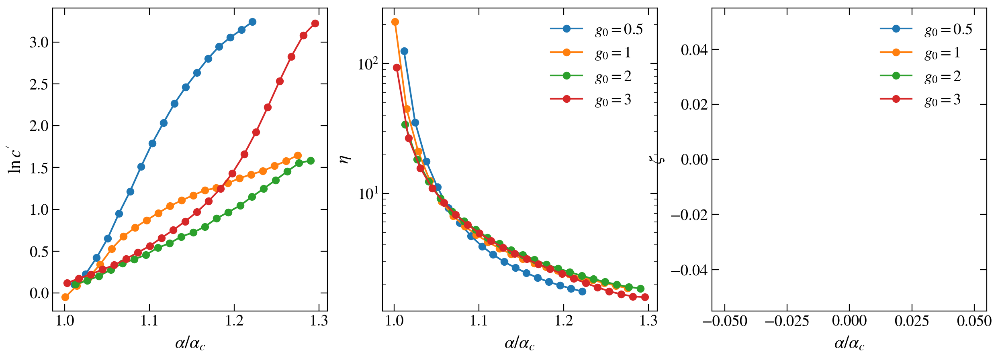

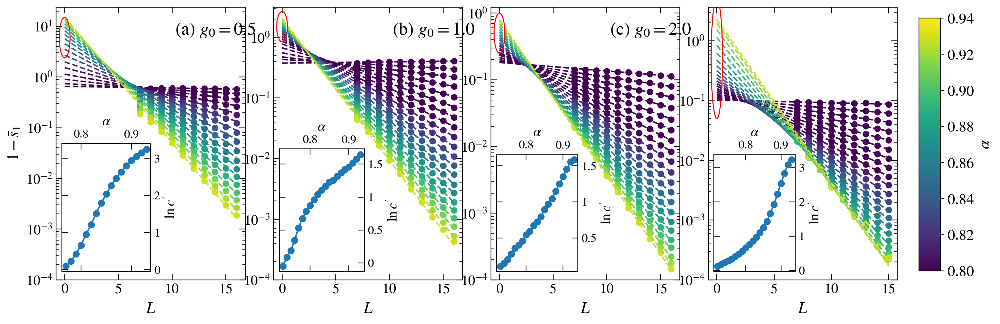

In [256]:
import matplotlib.transforms


L_total=15

J=2


alfa=1
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0


fig2, ax_fit = plt.subplots( nrows=1, ncols=3, figsize=(15,5), dpi = 200)

fig, axes = plt.subplots( nrows=1, ncols=4, figsize=(15,5), dpi = 200)
# fig, ax = plt.subplots( nrows=1, ncols=1, figsize=(5,5), dpi = 200)

axis = axes.flatten()

sizes = np.arange(6, 17, 1)

interpolate = 0

alfa_min = 0.8
alfa_max = 0.94
p = 1       # number of last spins
nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
xlab = r"$L$"

for idx1, J in enumerate([0.5, 1, 2, 3]):
    
    if idx1 == 0: inset = axis[idx1].inset_axes([0.03, 0.03, 0.47, 0.47])
    if idx1 == 1: inset = axis[idx1].inset_axes([0.03, 0.03, 0.45, 0.45])
    if idx1 == 2: inset = axis[idx1].inset_axes([0.03, 0.03, 0.43, 0.43])
    if idx1 == 3: inset = axis[idx1].inset_axes([0.03, 0.03, 0.43, 0.43])
    
    alfa_crit = 0.75
    if J == 0.5:    alfa_crit = 0.7612779024078085; s1_crit = 0.40776; s1_min = 0.6;  sizes = np.arange(10, 20, 1 if p > 0 else 2); nu = 0.59720
    elif J == 1:    alfa_crit = 0.7294402852322444; s1_crit = 0.60544; s1_min = 0.83; sizes = np.arange(10, 20, 1 if p > 0 else 2); nu = 0.69137
    elif J == 2:    alfa_crit = 0.7207704442893257; s1_crit = 0.83596; s1_min = 0.92; sizes = np.arange(10, 20, 1 if p > 0 else 2); nu = 0.78930
    elif J == 3:    alfa_crit = 0.71795404;         s1_crit = 0.90909; s1_min = 0.6;  sizes = np.arange(10, 19, 1 if p > 0 else 2); nu = 0.80702
    else:           alfa_crit = 1/np.sqrt(2)
    
    interaction = []
    ydata = []
    for L_total in sizes:
        L = L_total - N
        LA = L_total - p

        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
                Sinfo_vN     = np.array(file.get('vN info entropy'))
        else:
            print(name_out)
        alfa_vals_original = alfa_vals
        # print(L_total, entropy.shape)
        # entropy = 1 - entropy_site[LA] / ( np.log(2) )#page(LA, L_total-LA)
        entropy = 1 - entropy[LA] / ( p*np.log(2) )#page(LA, L_total-LA)
        interaction.append(alfa_vals)
        ydata.append(entropy)
        

    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    
    norm = matplotlib.colors.Normalize(
            vmin=alfa_min,
            vmax=alfa_max)

    # choose a colormap
    # c_m = matplotlib.cm.cool

    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])

    ydata = np.transpose( np.array(ydata) )
    # print(ydata.shape)
    beta_0 = np.zeros( (alfa_vals.size) )
    new_xx = np.zeros( (alfa_vals.size) )
    
    alfa_plot = []
    prefactor = []
    etas = []
    zetas = []
    for ii_a, alfa in enumerate(alfa_vals):
        if alfa < alfa_crit + 0.0 or alfa >= alfa_max: continue

        xx = (sizes - N)#**1/nu
        yy = ydata[ii_a]
        axis[idx1].scatter(xx, yy, marker='o', s=30, color=s_m.to_rgba(alfa))
        if interpolate:
            # axis[idx1].scatter(sizes, ydata[ii_a], marker='o', s=10, color=s_m.to_rgba(alfa))
            spl = make_spline(xx, yy)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
            yy = spl(xx)
            axis[idx1].scatter(xx, yy, marker='s', s=20, color=s_m.to_rgba(alfa))
        
        try:
            ii_cut = -6 if interpolate else -7
            pars, pconv= fit(entropy_fit,
                            xdata = xx[ii_cut:],
                            ydata = yy[ii_cut:])

            eta = pars[1]
            c = pars[0]
            zeta = 0
            print("J=", J, "  alfa=", np.round(alfa, 2), "  eta=", eta, "  c=", c, "  zeta=", zeta)
            prefactor.append(c / (1 - s1_crit) )
            etas.append(eta)
            zetas.append(zeta)
            alfa_plot.append(alfa)
            dense_sizes = np.linspace(0*xx[ii_cut], xx[-1], 1000)
            axis[idx1].plot(dense_sizes, entropy_fit(dense_sizes, *pars), lw=1.5, color=s_m.to_rgba(alfa), ls = '--')
        except RuntimeError:
            print(alfa)
    
    alfa_plot = np.array(alfa_plot)
    ax_fit[0].plot((alfa_plot / alfa_crit), np.log(prefactor), marker='o')
    ax_fit[1].plot((alfa_plot / alfa_crit), np.abs(1 / np.array(etas)), marker='o', label=r"$g_0=%g$"%J)
    ax_fit[2].plot((alfa_plot / alfa_crit), np.abs(1 / np.array(zetas)), marker='o', label=r"$g_0=%g$"%J)
    inset.plot((alfa_plot - 0*alfa_crit), np.log(prefactor), marker='o')
    # inset.axhline(y= np.log(s1_crit / (1-s1_crit) ) / nu, ls=':', c='gray' )

    fig_help.set_plot_elements(axis[idx1], ylabel=r"$1-\bar{s}_{%d}$"%p if idx1 == 0 else "", xlabel=xlab, font_size=14, set_legend=False, xscale='linear', yscale='log')

    hajt = 2
    if J == 0.5:    hajt = 0.8;   ypos = 6
    elif J == 1:    hajt = 0.5;   ypos = 1.5
    elif J == 2:    hajt = 0.6;     ypos = 0.5
    else:           alfa_crit = 1/np.sqrt(2)
    x, y = 0, ypos

    # use the axis scale tform to figure out how far to translate 
    ell_offset = matplotlib.transforms.ScaledTranslation(x, y, axis[idx1].transScale)

    # construct the composite tform
    ell_tform = ell_offset + axis[idx1].transLimits + axis[idx1].transAxes

    axis[idx1].add_patch(matplotlib.patches.Ellipse(xy=(0, 0), width=1, height=hajt, color="red", fill=False, lw=1, zorder=5, transform=ell_tform))
    axis[idx1].set_ylim(1e-4, None)
    
    inset.xaxis.set_label_position("top")
    # inset.xaxis.set_label_coords(.5, 1.2)
    inset.xaxis.tick_top()
    inset.yaxis.set_label_position("right")
    # inset.yaxis.set_label_coords(.5, 1.2)
    inset.yaxis.tick_right()
    fig_help.set_plot_elements(inset, ylabel=r"$\ln{c'}$", xlabel=r"$\alpha$", font_size=12, set_legend=False, xscale='linear', yscale='linear')

    inset.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
    inset.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
    inset.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
    inset.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
    
# adnas = np.linspace(0, 0.2)
# ax_fit[0].plot(adnas, 25 * adnas - 0.75, ls='--', c='k', label=r"$18(\alpha-\alpha_c)-0.75$")
# ax_fit[0].plot(adnas, 9 * adnas - 1, ls='--', c='k', label=r"$9(\alpha-\alpha_c)-1$")
# ax_fit[0].plot(adnas, 8 * adnas - 2, ls='--', c='k', label=r"$8(\alpha-\alpha_c)-2$")
# ax_fit[1].plot(adnas, 3*adnas, ls='--', c='k', label=r"$3(\alpha-\alpha_c)$")


fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$\alpha$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

fig_help.set_plot_elements(ax_fit[0], ylabel=r"$\ln{c'}$", xlabel=r"$\alpha / \alpha_c$", font_size=14, set_legend=True, xscale='linear', yscale='linear')
fig_help.set_plot_elements(ax_fit[1], ylabel=r"$\eta$",    xlabel=r"$\alpha / \alpha_c$", font_size=14, set_legend=True, xscale='linear', yscale='log')
fig_help.set_plot_elements(ax_fit[2], ylabel=r"$\zeta$",   xlabel=r"$\alpha / \alpha_c$", font_size=14, set_legend=True, xscale='linear', yscale='linear')
# for aa in [axis]:
#     for ax in np.array(aa).flatten():
#         ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))

axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.63, 0.9), xycoords='axes fraction')
axis[1].annotate(r"(b) $g_0=1.0$", fontsize=18, xy=(0.63, 0.9), xycoords='axes fraction')
axis[2].annotate(r"(c) $g_0=2.0$", fontsize=18, xy=(0.63, 0.9), xycoords='axes fraction')

fig.subplots_adjust(wspace = 0.15, hspace=0.05)
fig.savefig("plots_beta/Fig4.pdf", bbox_inches = 'tight', pad_inches=0.02)

## Supplementary

0.5 ALFA CROSSING ALL L [0.8092492492492492, 0.8056456456456457, 0.8014414414414415, 0.797987987987988, 0.7942342342342342, 0.7910810810810811, 0.7873273273273274, 0.7841741741741741, 0.7814714714714714, 0.7808708708708708, 0.7777177177177177, 0.7772672672672672]
0.5 alfa_c:   1.0 0.7545580280478446 0.4737174553281427
1 ALFA CROSSING ALL L [0.7549249249249249, 0.7561261261261262, 0.7550750750750751, 0.7532732732732733, 0.7510210210210211, 0.7490690690690691, 0.7477177177177177, 0.7456156156156156, 0.7453153153153154, 0.7435135135135136, 0.7436636636636637, 0.742912912912913]
1 alfa_c:   1.0 0.7325281435611448 0.22231421453176628
2 ALFA CROSSING ALL L [0.7542342342342342, 0.7483783783783784, 0.744024024024024, 0.7411711711711712, 0.7386186186186187, 0.7363663663663663, 0.7345645645645645, 0.7336636636636636, 0.732012012012012, 0.732012012012012, 0.7305105105105105, 0.7300600600600601]
2 alfa_c:   1.0 0.7199839246280458 0.22418732607441907


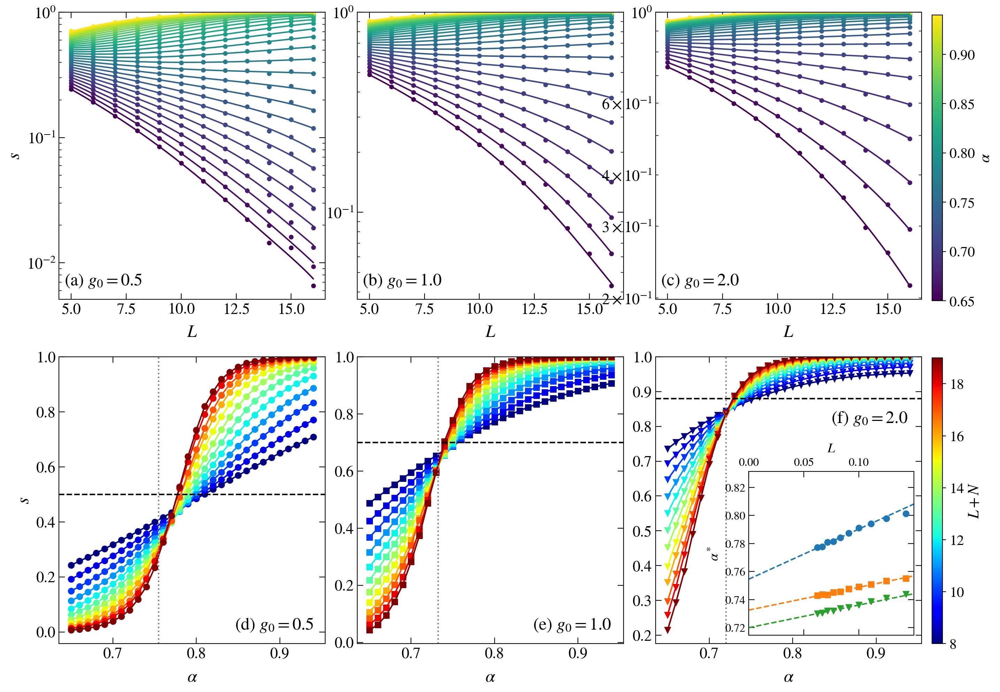

In [36]:
colors_ls_cyc = itertools.cycle(colors_ls)
markers = itertools.cycle(['o','s','v', 'D', '<', 'X', '^', '*', '+'])

L_total=15

J=2


alfa=1
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0

sub_sizes = np.arange(0, L+1)

# fig, ax = plt.subplots( nrows=1, ncols=1, figsize=(5,5), dpi = 200)

options = ['s1', 'r', 'D1']

interpolate = 0
plot_fractal = 1

dalfa = 0.1
interpolate_or_fit = 1
p = 1       # number of last spins
nu = 500
sizes = np.arange(6, 17, 1 if p > 0 else 2)

option = 's1'
if option not in options:
    print(option, "Not found! Using s1 instead")
    print(1/0)
xlabs = {'s1': r"${s}$" if p > 0 else r"$\bar{s}_A$", 'r': r"$\bar{r}$", 'D1': r"$\bar{D}_1$"}

plot_fractal = (option == 'D1')


frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu
folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
xlab = r"$L$"

def collapse_ansatz(x, a, b, x0):
    return (1 / (1 + a*np.exp(-b * (x - x0))))
    # return (1 / (1 + a * (np.abs(x - x0)**b)))
    # return (erf(b * (x - x0)) + 1) / 2
 
def pade_fun(x, c1, c2, d1, d2):
    # return c1 * np.arctan(c2 * x - d1)
    # return (x**3 + c1*x**2 + c2*x + c3) / (x**3 + d1*x**2 + d2 * x + d3)
    return (x**2 + c1 * x + c2) / (x**2 + d1 * x + d2)
    # return c1 / x**3 + c2 / x**2 + d1 / x**1 + d2
    # return 1 - (c1 / x**3 + c2 / x**2 + c3 / x**1 + d1)

def other_fit(x, c1, c2, c3, c4, c5, c6):
    # return (x**2 + c1 * x + c2) / (x**2 + c3 * x + c4)
    return c1 / np.log(x)**3 + c2 / np.log(x)**2 + c3 / np.log(x)**1 + c4
    # return c1 * np.exp(-c2*x) + c3
    # return c1 / x**3 + c2 / x**2 + c3 / x**1 + c4# + c5/x**4 + c6 / x**5

fig, axes = plt.subplots( nrows=2, ncols=3, figsize=(15,12), dpi = 200, sharex='row')#, sharey='col')
ax = axes[1]
axis = axes[0]

inset = ax[2].inset_axes([0.35, 0.03, 0.62, 0.57])
# for idx1, J in enumerate([0.5, 2, 3] if plot_fractal else [0.5, 1, 2]):
for idx1, J in enumerate([0.5, 1, 2]):
    
    mar = next(markers)
    cross_col = next(colors_ls_cyc)
    alfa_crit = 0.75
    s1_crit = 1
    if J == 0.5:    alfa_crit = 0.76071119; s1_crit = 0.3975596423927653; sizes = np.arange(8, 20, 1 if p > 0 else 2); s1_cut = 0.50;
    elif J == 1:    alfa_crit = 0.73503829; s1_crit = 0.5976612536491842; sizes = np.arange(8, 20, 1 if p > 0 else 2); s1_cut = 0.70;
    elif J == 2:    alfa_crit = 0.72054518; s1_crit = 0.8326330851556897; sizes = np.arange(8, 20, 1 if p > 0 else 2); s1_cut = 0.88;
    elif J == 3:    alfa_crit = 0.71795404; s1_crit = 0.9073984827790079; sizes = np.arange(8, 19, 1 if p > 0 else 2); s1_cut = 0.92;
    else:           alfa_crit = 1/np.sqrt(2)
    
    norm = matplotlib.colors.Normalize(
        vmin=8,
        vmax=19)

    s_m_L = matplotlib.cm.ScalarMappable(cmap='jet', norm=norm)
    s_m_L.set_array([])
    
    interaction = []
    S = []
    Sinfo = []
    xx_data = []
    yy_data = []
    yy_deriv_data = []
    for L_total in sizes:
        L = L_total - N
        LA = L_total - p if p > 0 else L_total // 2

        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
                Sinfo_vN     = np.array(file.get('vN info entropy'))
        else:
            print(name_out)
        alfa_vals_original = alfa_vals

        ent = entropy[LA] / ( p*np.log(2) ) if p > 0 else entropy[LA] / page(LA, L_total-LA)
        interaction.append(alfa_vals)
        S.append(ent)
        Sinfo.append(Sinfo_vN)
        
        ax[idx1].plot(alfa_vals, ent, lw=1.5, marker=mar, color=s_m_L.to_rgba(L_total))
        indices = np.where(np.logical_and(alfa_vals >= alfa_crit - 0.06, alfa_vals < alfa_crit + dalfa))[0]
        xx = alfa_vals[indices]
        yy = ent[indices]
        
        alfa_vals_interpolated  = np.linspace(xx[0], xx[-1], 1000)
        
        if interpolate_or_fit:
            entropy_spl = InterpolateSpline(xx, yy, k=3, s=3)#make_spline(xx, yy, k=5)
            S_interpol = entropy_spl(alfa_vals_interpolated)
            deriv = entropy_spl.derivative(1)(alfa_vals_interpolated)
        else:
            pars, pconv = fit(collapse_ansatz,
                        xdata = xx,
                        ydata = yy,
                        maxfev = 100000
            )
            print(J, "pars:  ", *pars)
            S_interpol = collapse_ansatz(alfa_vals_interpolated, *pars)
            deriv = np.gradient( S_interpol, alfa_vals_interpolated[1] - alfa_vals_interpolated[0] )
                
        xx_data.append(alfa_vals_interpolated)
        yy_data.append(S_interpol)
        yy_deriv_data.append(deriv)

    alfa_cross = []
    s1_cross = []
    s1_der_cross = []
    for ii in range(0, sizes.size):
        # idx = np.argmax( np.abs(yy_deriv_data[ii]) )
        idx = np.argmin( np.abs(yy_data[ii] - s1_cut) )
        alfa_cross.append(xx_data[ii][idx])
        s1_cross.append(yy_data[ii][idx])
        s1_der_cross.append(yy_deriv_data[ii][idx])
    
    print(J, "ALFA CROSSING ALL L", alfa_cross)

    ax[idx1].axhline(y=s1_cut, ls=':', c='k')
    
    # CROSSING POINTS
    xfit = 1 / (sizes)
    
    def fitt(x, psi, alfa_c, const):
        return alfa_c * (1 + const * x)
    
    xfit = 1 / (sizes-N)
    try:
        pars, pconv = fit(fitt,
                        xdata = xfit[6:],
                        ydata = alfa_cross[6:], maxfev = 10000)
        print(J, "alfa_c:  ", *pars)
        Linv = np.linspace(0, max(xfit), 100)
        inset.plot(Linv, fitt(Linv, *pars), ls='--', color=cross_col)
        
        ax[idx1].axvline(x=pars[1], ls=':', c='gray', lw=1.5)
        # axis[3].scatter(1 / (found_sizes-N), alfa_cross, label = r"$g_0=%.1f;\quad\alpha_c={%.3f};\quad\psi=-%.2f\quad a=%.2f$"%(J, pars[1], pars[0], pars[2]), color=cross_col)
        inset.scatter(1 / (sizes-N), alfa_cross, label = r"$g_0=%.1f;\quad\alpha_c={%.3f};\quad a=%.2f$"%(J, pars[1], pars[2]), color=cross_col, marker=mar)
    except RuntimeError:
        inset.scatter(1 / (sizes-N), alfa_cross, label = r"$g_0=%.1f$"%(J), color=cross_col, marker=mar)

    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    norm = matplotlib.colors.Normalize(
        vmin=min(alfa_vals),
        vmax=max(alfa_vals))

    # choose a colormap
    # c_m = matplotlib.cm.cool

    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])
    
    ydata = Sinfo if plot_fractal else S
    ydata = np.transpose( np.array(ydata) )

    beta_0 = np.zeros( (alfa_vals.size) )
    new_xx = np.zeros( (alfa_vals.size) )
    
    for ii_a, alfa in enumerate(alfa_vals):
        # if alfa > alfa_crit + dalfa or alfa < alfa_crit - dalfa: continue

        xx = sizes - N
        yy = ydata[ii_a]
        if plot_fractal:
            D1 = np.diff(yy) / np.log(2)
            yy = ( D1[:-1] + D1[1:] ) / 2.0
            xx = sizes[1:-1]
            
        axis[idx1].scatter(xx, yy, marker='o', s=15, color=s_m.to_rgba(alfa))
        if interpolate:
            # axis[idx1].scatter(sizes, ydata[ii_a], marker='o', s=10, color=s_m.to_rgba(alfa))
            spl = make_spline(xx, yy)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
            yy = spl(xx)
            axis[idx1].scatter(xx, yy, marker='s', s=5, color=s_m.to_rgba(alfa))
        
        # my_fit = pade_fun if alfa > alfa_crit else other_fit
        # try:
        #     # xx = xx - N
        #     pars, pconv, fit_info, msg, _ = fit(my_fit,
        #                     xdata = xx,
        #                     ydata = yy,
        #                     full_output=True)
        #     print(J, alfa, np.abs(np.sqrt(np.diag(pconv)) / pars))#fit_info['fvec'])
        #     dense_sizes = np.linspace(xx[0], xx[-1], 10000)
        #     axis[idx1].plot(1/dense_sizes, my_fit(dense_sizes, *pars), lw=1.5, color=s_m.to_rgba(alfa), ls = '--' if alfa == alfa_crit else '-')
        # except RuntimeError:
        #     print(alfa)
        yy_interpol = InterpolateSpline(xx, yy, k=3, s=3)
        dense_sizes = np.linspace(xx[0], xx[-1], 1000)
        # dense_sizes = xx
        axis[idx1].plot(dense_sizes, yy_interpol(dense_sizes), lw=1.5, color=s_m.to_rgba(alfa), ls = '--' if alfa == alfa_crit else '-')#, marker='s', markerfacecolor='None')
        
    fig_help.set_plot_elements(axis[idx1], ylabel=xlabs[option] if idx1==0 else "", xlabel=xlab, font_size=16, set_legend=False, xscale='linear', yscale='log')
    axis[idx1].set_ylim(None, 1)
    fig_help.set_plot_elements(ax[idx1], ylabel=xlabs[option] if idx1==0 else "", xlabel=r"$\alpha$", font_size=16, set_legend=False, xscale='linear', yscale='linear')
    ax[idx1].set_ylim(None, 1)
    ax[idx1].axhline(y=s1_cut, ls='--', c='k', lw=1.5)
    
fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.96, 0.125, 0.01, 0.342])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m_L, cax=cbar_ax, aspect=1)
cbar.set_label(r"$L+N$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

cbar_ax = fig.add_axes([0.96, 0.535, 0.01, 0.342])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$\alpha$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

# fig.subplots_adjust(right=0.9)
# cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
# # fig.colorbar(im, cax=cbar_ax)

# cbar.ax.tick_params(labelsize=15)

# for aa in [axis]:
#     for ax in np.array(aa).flatten():
#         ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))

inset.xaxis.set_label_position("top")
inset.xaxis.set_label_coords(.5, 1.12)
inset.xaxis.tick_top()
inset.set_xlim(0, 0.1499)
    
fig_help.set_plot_elements(inset, ylabel=r"$\alpha^*$", xlabel=r"$L$", font_size=12, set_legend=False, xscale='linear')

axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.02, 0.05), xycoords='axes fraction')
axis[1].annotate(r"(b) $g_0=1.0$", fontsize=18, xy=(0.02, 0.05), xycoords='axes fraction')
axis[2].annotate(r"(c) $g_0=2.0$", fontsize=18, xy=(0.02, 0.05), xycoords='axes fraction')

ax[0].annotate(r"(d) $g_0=0.5$", fontsize=18, xy=(0.66, 0.05), xycoords='axes fraction')
ax[1].annotate(r"(e) $g_0=1.0$", fontsize=18, xy=(0.66, 0.05), xycoords='axes fraction')
ax[2].annotate(r"(f) $g_0=2.0$", fontsize=18, xy=(0.66, 0.77), xycoords='axes fraction')


fig.subplots_adjust(wspace = 0.12, hspace=0.2)
# fig.savefig("plots_beta/FigS1.pdf", bbox_inches = 'tight', pad_inches=0.02)

[0.68 0.69 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78 0.79 0.8 ]


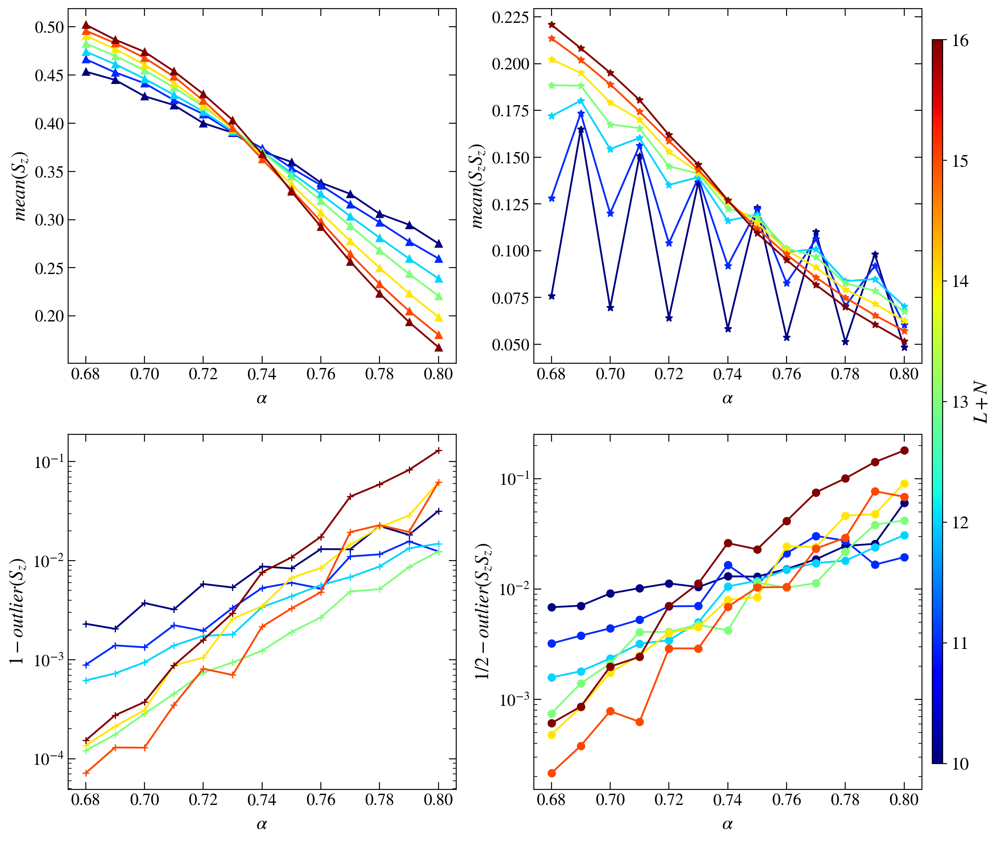

In [117]:
L_total=15

J=1
if J == 0.5:    alfa_crit = 0.76071119; s1_crit = 0.3975596423927653; sizes = np.arange(8, 20); s1_cut = 0.50;
elif J == 1:    alfa_crit = 0.73503829; s1_crit = 0.5976612536491842; sizes = np.arange(8, 20); s1_cut = 0.70;
elif J == 2:    alfa_crit = 0.72054518; s1_crit = 0.8326330851556897; sizes = np.arange(8, 20); s1_cut = 0.88;
elif J == 3:    alfa_crit = 0.71795404; s1_crit = 0.9073984827790079; sizes = np.arange(8, 19); s1_cut = 0.92;
else:           alfa_crit = 1/np.sqrt(2)
    
alfa=1.0
h=1.0
w=0.5
zeta=0.2
N=3
gamma=1.0
ini_ave=0
L = L_total - N

alfa_vals = np.linspace(0.68, 0.8, 13)
print(alfa_vals)

sizes = np.arange(10, 17, 1)

mean_Sz = np.zeros((alfa_vals.size, sizes.size));  mean_Sz.fill(np.nan)
mean_SzSz = np.zeros((alfa_vals.size, sizes.size));  mean_SzSz.fill(np.nan)
outlier_Sz = np.zeros((alfa_vals.size, sizes.size));  outlier_Sz.fill(np.nan)
outlier_SzSz = np.zeros((alfa_vals.size, sizes.size));  outlier_SzSz.fill(np.nan)

fig, axis = plt.subplots( nrows=2, ncols=2, figsize=(12,12), dpi = 200)
axis = axis.flatten()

for ii_a, alfa in enumerate(alfa_vals):
    name = base_dir + 'Correlators/Spectrals_g0=%g,alfa=%.2f.hdf5'%(J, alfa)
    if exists(name):
        with h5py.File(name, "r") as file:
            Ls = np.array(file.get('sizes'))
            indices = np.nonzero(np.in1d(Ls, sizes))[0]
            mean_Sz[ii_a] = (np.array(file.get('state2state_fluct_Sz')))[indices]
            mean_SzSz[ii_a] = (np.array(file.get('state2state_fluct_SzSz')))[indices]
            outlier_Sz[ii_a] = 1-(np.array(file.get('state2state_outlier_Sz')))[indices]
            outlier_SzSz[ii_a] = 1/2-(np.array(file.get('state2state_outlier_SzSz')))[indices]
    else:
        print(name)

for idx1, ydata in enumerate([mean_Sz, mean_SzSz, outlier_Sz, outlier_SzSz]):
    
    ydata = np.transpose(ydata)
    mar = next(markers)
    cross_col = next(colors_ls_cyc)
    alfa_crit = 0.75
    s1_crit = 1
    
    norm = matplotlib.colors.Normalize(
        vmin=min(sizes),
        vmax=max(sizes))

    s_m = matplotlib.cm.ScalarMappable(cmap='jet', norm=norm)
    s_m.set_array([])
   
    for ii, L_total in enumerate(sizes):
        L = L_total - N
        axis[idx1].plot(alfa_vals, ydata[ii], lw=1.5, marker=mar, color=s_m.to_rgba(L_total))
    

fig_help.set_plot_elements(axis[0], ylabel=r"$mean(S_z)$", xlabel=r"$\alpha$", font_size=14, set_legend=False, xscale='linear')
fig_help.set_plot_elements(axis[1], ylabel=r"$mean(S_zS_z)$", xlabel=r"$\alpha$", font_size=14, set_legend=False, xscale='linear')
fig_help.set_plot_elements(axis[2], ylabel=r"$1-outlier(S_z)$", xlabel=r"$\alpha$", font_size=14, set_legend=False, yscale='log')
fig_help.set_plot_elements(axis[3], ylabel=r"$1/2-outlier(S_zS_z)$", xlabel=r"$\alpha$", font_size=14, set_legend=False, yscale='log')

    
fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.96, 0.15, 0.01, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$L+N$", fontsize=16)
cbar.ax.tick_params(labelsize=15)



# axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.02, 0.05), xycoords='axes fraction')
# axis[1].annotate(r"(b) $g_0=1.0$", fontsize=18, xy=(0.02, 0.05), xycoords='axes fraction')
# axis[2].annotate(r"(c) $g_0=2.0$", fontsize=18, xy=(0.02, 0.05), xycoords='axes fraction')


sc other fit [0.95968816 0.89711059] [[4.14694118e-05 8.62742107e-07]
 [8.62742107e-07 3.59200356e-05]] 

c other fit [-2.20313737  1.58938951] [[ 2.88506949e-06 -9.22200827e-07]
 [-9.22200827e-07  1.19427793e-06]] 



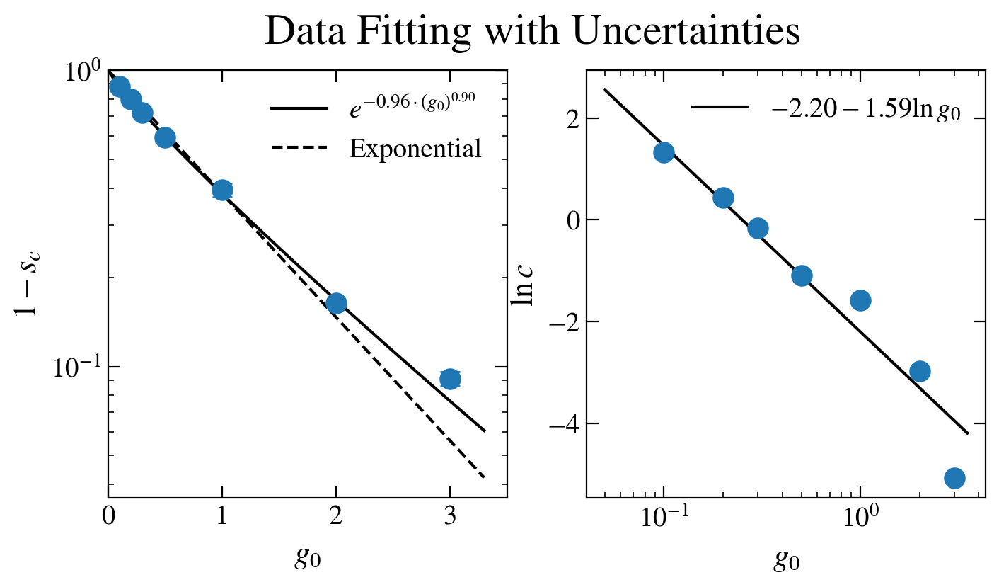

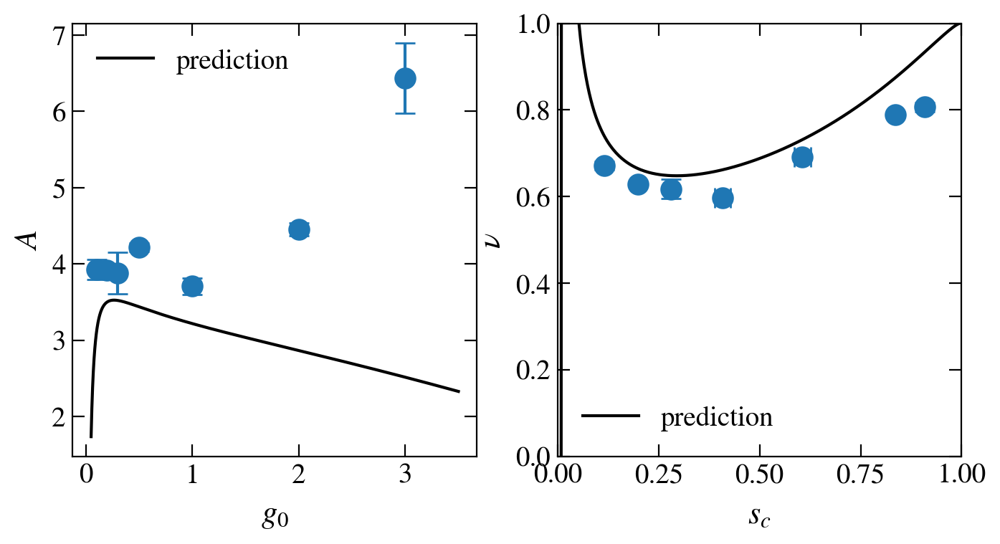

In [163]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit


g0 = np.array([0.1, 0.2, 0.3, 0.5, 1.0, 2.0, 3])

# Data points and uncertainties
sc_data = np.array([0.11630, 0.19886, 0.28093, 0.40776, 0.60544, 0.83596, 0.90909])
v_data = np.array([ 0.67176, 0.62873, 0.61728, 0.59701, 0.69174, 0.78976, 0.80702])

sc_err = np.array([0.00282, 0.00310, 0.00522, 0.01936, 0.02037, 0.00261, 0.00489])
v_err = np.array([ 0.00953, 0.00555, 0.02216, 0.00297, 0.00183, 0.00328, 0.01037])

def A_func(s, v):
    return 1 - (1 - s) * (1 - v) / (1 - s + np.log(s)) / (s * v)
def Aerr_func(s, v, ds, dv):
    term1 = s**2 * (1-s)**2 * (1 - s + np.log(s))**2
    term2 = v**2 * (1-v)**2 * (2 - 3*s + s**2 + np.log(s))**2
    return np.sqrt(dv**2 * term1 + ds**2 * term2) / (1 - s + np.log(s))**2 / (s * v)**2 

def C_func(s, v):
    return np.exp(-np.log(s) * (1 - s*v + v*np.log(s)) / (1 - s + np.log(s)) / v)
def Cerr_func(s, v, ds, dv):
    term1 = s ** ( -4 - 2*(1-v) / (1 - s + np.log(s)) / v)
    term2 = dv**2 * s**2 * np.log(s)**2 * (1 - s + np.log(s))**2 + ds**2 * v**2 * ( (1-s)*(1-s*v) + np.log(s)*(s + 2*v - 3*s*v + v*np.log(s)))**2
    return np.sqrt(term1 * term2) / (1 - s + np.log(s))**2 / v**2

# Define a linear model for initial fitting
def sc_fit(x, a, b):
    return np.exp(-a * x**b)

# Define a polynomial model for better fitting (let's try quadratic)
def polynomial_model(x, a, b, c, d, e):
    return e * x ** 4 + d * x**3 + a * x**2 + b * x + c


# Plotting the data and the fits
fig, axis = plt.subplots(ncols=2, nrows=1, figsize=(8, 4), dpi=200)

y_data = 1 - sc_data
y_err = sc_err

axis[0].errorbar(g0, y_data, yerr=y_err, fmt='o', capsize=5, markersize=10)
# Generate fine x data for plotting the fit
x_fine = np.linspace(0, 1.1*max(g0), 400)
try:
    # Fit the data using the linear model
    popt, pcov = curve_fit(sc_fit, g0, y_data, sigma=y_err, absolute_sigma=True, maxfev = 100000)
    print('sc', 'other fit', popt, pcov, "\n")
    
    y_fine_linear = sc_fit(x_fine, *popt)
    axis[0].plot(x_fine, y_fine_linear, '-', label=r'$e^{-%.2f\cdot(g_0)^{%.2f}}$'%(popt[0], popt[1]), color='black')
    axis[0].plot(x_fine, np.exp(-popt[0]*x_fine), '--', label='Exponential', color='black')
except RuntimeError:
    print("failed1")
popt_sc = popt

fig_help.set_plot_elements(axis[0], ylabel=r"$1 - s_c$", xlabel=r"$g_0$", font_size=14, set_legend=True, yscale = 'log', xscale='linear', xlim=(-0.0, 3.5), ylim=(0,1.0))

fig.suptitle('Data Fitting with Uncertainties', fontsize=22)


def another_fit(x, a, b):
    return a - b * np.log(x)


y_data = np.log( C_func(sc_data, v_data) )
# y_err = Cerr_func(sc_data, v_data, sc_err, v_err)
axis[1].errorbar(g0, y_data, yerr=y_err, fmt='o', capsize=5, markersize=10)
# Generate fine x data for plotting the fit
x_fine = np.linspace(0.05, 3.5, 400)
try:
    # Fit the data using the linear model
    popt, pcov = curve_fit(another_fit, g0, y_data, sigma=y_err, absolute_sigma=True, maxfev = 100000)
    print('c', 'other fit', popt, pcov, "\n")
    
    y_fine_linear = another_fit(x_fine, *popt)
    axis[1].plot(x_fine, y_fine_linear, '-', label=r'$%.2f-%.2f\ln{g_0}$'%(popt[0], popt[1]), color='black')
except RuntimeError:
    print("failed1")

popt_c = popt

fig_help.set_plot_elements(axis[1], ylabel=r"$\ln{c}$", xlabel=r"$g_0$", font_size=14, set_legend=True, yscale = 'linear', xscale='log')


fig, axis = plt.subplots(ncols=2, nrows=1, figsize=(8, 4), dpi=200)
def Aguess(x):
    _sc = 1 - sc_fit(x, *popt_sc)
    _c = np.exp( another_fit(x, *popt_c) )
    return ( np.log(_sc) - (1 - _sc) * np.log( (1-_sc) / _c) ) / (_sc * np.log(_sc))


y_data = A_func(sc_data, v_data)
y_err = Aerr_func(sc_data, v_data, sc_err, v_err)
axis[0].errorbar(g0, y_data, yerr=y_err, fmt='o', capsize=5, markersize=10)
# Generate fine x data for plotting the fit
x_fine = np.linspace(0.05, 3.5, 2000)
axis[0].plot(x_fine, Aguess(x_fine), '-', label='prediction', color='black')
    
fig_help.set_plot_elements(axis[0], ylabel=r"$A$", xlabel=r"$g_0$", font_size=14, set_legend=True, yscale = 'linear', xscale='linear')



def v_guess(x):
    _sc = 1 - sc_fit(x, *popt_sc)
    _c = np.exp( another_fit(x, *popt_c) )
    return -np.log(_sc) / (np.log( (1-_sc)/_c ) * (-1+_sc-np.log(_sc)) + np.log(_sc) * (-_sc + np.log(_sc)) )

x_data = sc_data
x_err = sc_err
y_data = v_data
y_err = v_err
g0_fine = np.linspace(0, 8, 2000)
axis[1].errorbar(x_data, y_data, xerr=x_err, yerr=y_err, fmt='o', capsize=5, markersize=10)
axis[1].plot(1 - sc_fit(g0_fine, *popt_sc), v_guess(g0_fine), '-', label='prediction', color='black')
# Generate fine x data for plotting the fit
    

fig_help.set_plot_elements(axis[1], ylabel=r"$\nu$", xlabel=r"$s_c$", font_size=14, set_legend=True, yscale = 'linear', xscale='linear', xlim=(0,1.), ylim=(0,1.))


### OTHER OBSERVABLES

[0.68 0.69 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78 0.79 0.8  0.81
 0.82 0.83 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92 0.93 0.94 0.95
 0.96 0.97 0.98 0.99]


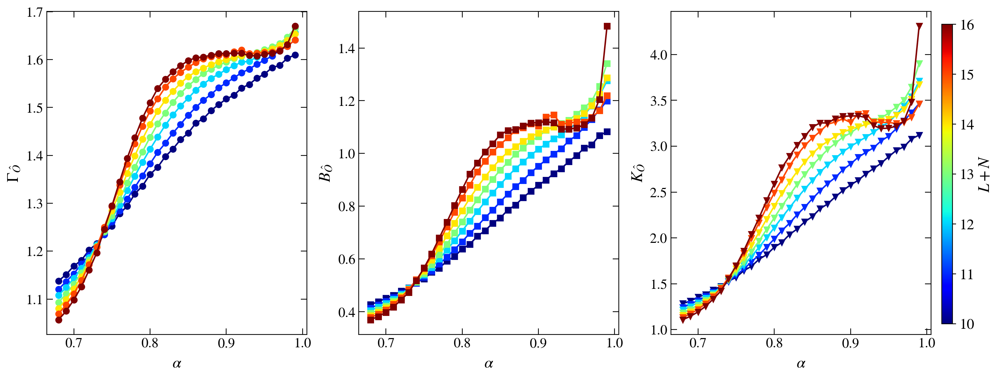

In [35]:
L_total=15

J=1
if J == 0.5:    alfa_crit = 0.76071119; s1_crit = 0.3975596423927653; sizes = np.arange(8, 20); s1_cut = 0.50;
elif J == 1:    alfa_crit = 0.73503829; s1_crit = 0.5976612536491842; sizes = np.arange(8, 20); s1_cut = 0.70;
elif J == 2:    alfa_crit = 0.72054518; s1_crit = 0.8326330851556897; sizes = np.arange(8, 20); s1_cut = 0.88;
elif J == 3:    alfa_crit = 0.71795404; s1_crit = 0.9073984827790079; sizes = np.arange(8, 19); s1_cut = 0.92;
else:           alfa_crit = 1/np.sqrt(2)
    
alfa=1.0
h=1.0
w=0.5
zeta=0.2
N=3
gamma=1.0
ini_ave=0
L = L_total - N

alfa_vals = np.linspace(0.68, 0.99, 32)
print(alfa_vals)

sizes = np.arange(10, 17, 1)

kurtosis = np.zeros((alfa_vals.size, sizes.size));  kurtosis.fill(np.nan)
gaussianity = np.zeros((alfa_vals.size, sizes.size));  gaussianity.fill(np.nan)
bindercumulant = np.zeros((alfa_vals.size, sizes.size));  bindercumulant.fill(np.nan)

fig, axis = plt.subplots( nrows=1, ncols=3, figsize=(15,6), dpi = 200)

for ii_a, alfa in enumerate(alfa_vals):
    name = base_dir + 'Correlators/Spectrals_g0=%g,alfa=%.2f.hdf5'%(J, alfa)
    if exists(name):
        with h5py.File(name, "r") as file:
            Ls = np.array(file.get('sizes'))
            indices = np.nonzero(np.in1d(Ls, sizes))[0]
            # print(indices)
            # indices = np.where()
            kurtosis[ii_a] = np.array(file.get('Kurtosis/Sz'))[indices]
            gaussianity[ii_a] = np.array(file.get('Gaussianity/Sz'))[indices]
            bindercumulant[ii_a] = 1-np.array(file.get('BinderCumulant/Sz'))[indices]
            # bindercumulant[ii_a] = np.array(file.get('state2state_outlier_SzSz'))[indices]
            # bindercumulant[ii_a] = (np.array(file.get('state2state_fluct_SzSz')))[indices]
    else:
        print(name)

for idx1, ydata in enumerate([gaussianity, bindercumulant, kurtosis]):
    
    ydata = np.transpose(ydata)
    mar = next(markers)
    cross_col = next(colors_ls_cyc)
    alfa_crit = 0.75
    s1_crit = 1
    
    norm = matplotlib.colors.Normalize(
        vmin=min(sizes),
        vmax=max(sizes))

    s_m = matplotlib.cm.ScalarMappable(cmap='jet', norm=norm)
    s_m.set_array([])
   
    for ii, L_total in enumerate(sizes):
        L = L_total - N
        axis[idx1].plot(alfa_vals, ydata[ii], lw=1.5, marker=mar, color=s_m.to_rgba(L_total))
    

fig_help.set_plot_elements(axis[0], ylabel=r"$\Gamma_{\hat{O}}$", xlabel=r"$\alpha$", font_size=14, set_legend=False, xscale='linear')
fig_help.set_plot_elements(axis[1], ylabel=r"$B_{\hat{O}}$", xlabel=r"$\alpha$", font_size=14, set_legend=False, xscale='linear')
fig_help.set_plot_elements(axis[2], ylabel=r"$K_{\hat{O}}$", xlabel=r"$\alpha$", font_size=14, set_legend=False, xscale='linear')

    
fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.96, 0.15, 0.01, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$L+N$", fontsize=16)
cbar.ax.tick_params(labelsize=15)



# axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.02, 0.05), xycoords='axes fraction')
# axis[1].annotate(r"(b) $g_0=1.0$", fontsize=18, xy=(0.02, 0.05), xycoords='axes fraction')
# axis[2].annotate(r"(c) $g_0=2.0$", fontsize=18, xy=(0.02, 0.05), xycoords='axes fraction')


In [111]:
for L in [5, 6, 10, 12]:
    for alfa in alfa_vals:
        print(L, alfa, alfa**(L-1), alfa**(L))

5 0.68 0.21381376000000007 0.14539335680000004
5 0.6900000000000001 0.22667121000000007 0.15640313490000007
5 0.7000000000000001 0.2401000000000001 0.16807000000000008
5 0.7100000000000001 0.2541168100000001 0.1804229351000001
5 0.7200000000000001 0.2687385600000001 0.1934917632000001
5 0.73 0.28398240999999996 0.2073071593
5 0.74 0.29986576 0.22190066239999998
5 0.75 0.31640625 0.2373046875
5 0.76 0.33362176 0.2535525376
5 0.77 0.35153041 0.2706784157
5 0.78 0.3701505600000001 0.28871743680000006
5 0.79 0.3895008100000001 0.30770563990000005
5 0.8 0.4096000000000001 0.3276800000000001
5 0.81 0.4304672100000001 0.3486784401000001
5 0.8200000000000001 0.45212176000000015 0.37073984320000014
5 0.8300000000000001 0.47458321000000014 0.3939040643000002
5 0.8400000000000001 0.4978713600000002 0.4182119424000002
5 0.8500000000000001 0.5220062500000002 0.4437053125000002
5 0.86 0.54700816 0.47042701759999994
5 0.87 0.57289761 0.4984209207
5 0.88 0.59969536 0.5277319168
5 0.89 0.62742241 0.558

[0.68 0.69 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78 0.79 0.8  0.81
 0.82 0.83 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92 0.93 0.94 0.95
 0.96 0.97 0.98 0.99]


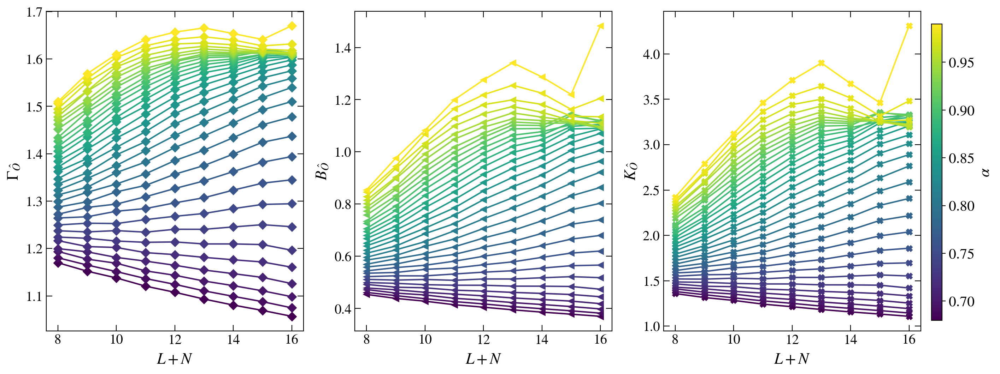

In [36]:
L_total=15

J=1
if J == 0.5:    alfa_crit = 0.76071119; s1_crit = 0.3975596423927653; sizes = np.arange(8, 20); s1_cut = 0.50;
elif J == 1:    alfa_crit = 0.73503829; s1_crit = 0.5976612536491842; sizes = np.arange(8, 20); s1_cut = 0.70;
elif J == 2:    alfa_crit = 0.72054518; s1_crit = 0.8326330851556897; sizes = np.arange(8, 20); s1_cut = 0.88;
elif J == 3:    alfa_crit = 0.71795404; s1_crit = 0.9073984827790079; sizes = np.arange(8, 19); s1_cut = 0.92;
else:           alfa_crit = 1/np.sqrt(2)
    
alfa=1.0
h=1.0
w=0.5
zeta=0.2
N=3
gamma=1.0
ini_ave=0
L = L_total - N

alfa_vals = np.linspace(0.68, 0.99, 32)
print(alfa_vals)

sizes = np.arange(8, 17, 1)
interpolate=0

fig, axis = plt.subplots( nrows=1, ncols=3, figsize=(15,6), dpi = 200)

_kurtosis = np.zeros((alfa_vals.size, sizes.size));  _kurtosis.fill(np.nan)
_gaussianity = np.zeros((alfa_vals.size, sizes.size));  _gaussianity.fill(np.nan)
_bindercumulant = np.zeros((alfa_vals.size, sizes.size));  _bindercumulant.fill(np.nan)

for ii_a, alfa in enumerate(alfa_vals):
    name = base_dir + 'Correlators/Spectrals_g0=%g,alfa=%.2f.hdf5'%(J, alfa)
    if exists(name):
        with h5py.File(name, "r") as file:
            _kurtosis[ii_a] = np.array(file.get('Kurtosis/Sz'))
            _gaussianity[ii_a] = np.array(file.get('Gaussianity/Sz'))
            _bindercumulant[ii_a] = 1-np.array(file.get('BinderCumulant/Sz'))
            # _bindercumulant[ii_a] = np.array(file.get('state2state_outlier_SzSz')) 
            # _bindercumulant[ii_a] = (np.array(file.get('state2state_fluct_SzSz')))
    else:
        print(name)

if interpolate:
    _kurtosis = np.transpose(_kurtosis)
    _gaussianity = np.transpose(_gaussianity)
    _bindercumulant = np.transpose(_bindercumulant)

    xx = np.linspace(alfa_vals[0], alfa_vals[-1], alfa_vals.size + (alfa_vals.size-1) * 2)
    kurtosis = np.zeros((sizes.size, xx.size));  kurtosis.fill(np.nan)
    gaussianity = np.zeros((sizes.size, xx.size));  gaussianity.fill(np.nan)
    bindercumulant = np.zeros((sizes.size, xx.size));  bindercumulant.fill(np.nan)
    for ii, L_total in enumerate(sizes):
        f = splrep(alfa_vals, _kurtosis[ii], k=5, s=10)
        kurtosis[ii] = splev(xx, f)
        
        f = splrep(alfa_vals, _gaussianity[ii], k=5, s=10)
        gaussianity[ii] = splev(xx, f)
        
        f = splrep(alfa_vals, _bindercumulant[ii], k=5, s=10)
        bindercumulant[ii] = splev(xx, f)

    kurtosis = np.transpose(kurtosis)
    gaussianity = np.transpose(gaussianity)
    bindercumulant = np.transpose(bindercumulant)
else:
    xx = alfa_vals
    kurtosis = (_kurtosis)
    gaussianity = (_gaussianity)
    bindercumulant = (_bindercumulant)
    
for idx1, ydata in enumerate([gaussianity, bindercumulant, kurtosis]):
    
    mar = next(markers)
    cross_col = next(colors_ls_cyc)
    
    
    norm = matplotlib.colors.Normalize(
        vmin=min(xx),
        vmax=max(xx))

    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])
   
    for ii_a, alfa in enumerate(xx):
        axis[idx1].plot(sizes, ydata[ii_a], lw=1.5, marker=mar, color=s_m.to_rgba(alfa))
    

fig_help.set_plot_elements(axis[0], ylabel=r"$\Gamma_{\hat{O}}$", xlabel=r"$L+N$", font_size=14, set_legend=False, xscale='linear')
fig_help.set_plot_elements(axis[1], ylabel=r"$B_{\hat{O}}$", xlabel=r"$L+N$", font_size=14, set_legend=False, yscale='linear')
fig_help.set_plot_elements(axis[2], ylabel=r"$K_{\hat{O}}$", xlabel=r"$L+N$", font_size=14, set_legend=False, xscale='linear')

    
fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.96, 0.15, 0.01, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$\alpha$", fontsize=16)
cbar.ax.tick_params(labelsize=15)



# axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.02, 0.05), xycoords='axes fraction')
# axis[1].annotate(r"(b) $g_0=1.0$", fontsize=18, xy=(0.02, 0.05), xycoords='axes fraction')
# axis[2].annotate(r"(c) $g_0=2.0$", fontsize=18, xy=(0.02, 0.05), xycoords='axes fraction')


[0.71       0.71903226 0.72806452 0.73709677 0.74612903 0.75516129
 0.76419355 0.77322581 0.78225806 0.79129032 0.80032258 0.80935484
 0.8183871  0.82741935 0.83645161 0.84548387 0.85451613 0.86354839
 0.87258065 0.8816129  0.89064516 0.89967742 0.90870968 0.91774194
 0.92677419 0.93580645 0.94483871 0.95387097 0.96290323 0.97193548
 0.98096774 0.99      ]


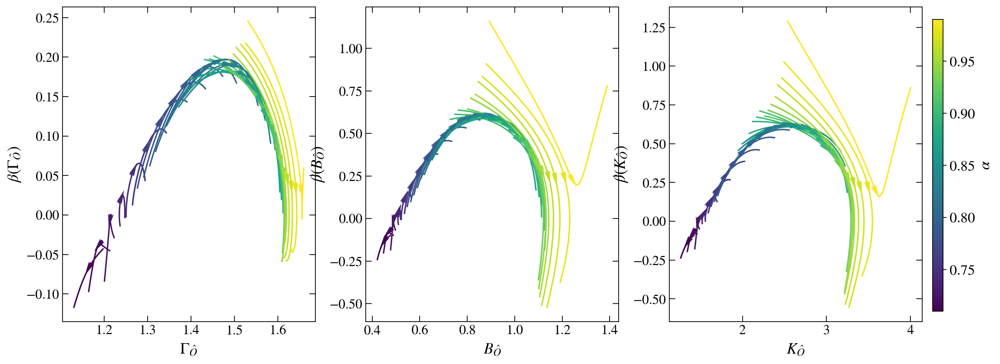

In [37]:
L_total=15

J=1
if J == 0.5:    alfa_crit = 0.76071119; s1_crit = 0.3975596423927653; sizes = np.arange(8, 20); s1_cut = 0.50;
elif J == 1:    alfa_crit = 0.73503829; s1_crit = 0.5976612536491842; sizes = np.arange(8, 20); s1_cut = 0.70;
elif J == 2:    alfa_crit = 0.72054518; s1_crit = 0.8326330851556897; sizes = np.arange(8, 20); s1_cut = 0.88;
elif J == 3:    alfa_crit = 0.71795404; s1_crit = 0.9073984827790079; sizes = np.arange(8, 19); s1_cut = 0.92;
else:           alfa_crit = 1/np.sqrt(2)
    
alfa=1.0
h=1.0
w=0.5
zeta=0.2
N=3
gamma=1.0
ini_ave=0
L = L_total - N

interpolate_in_alfa = 0
interpolate = 1
use_fit = 0
plot_inset = 0

alfa_vals = np.linspace(0.71, 0.99, 32)
print(alfa_vals)

sizes = np.arange(8, 17, 1)
alfa_max = 0.83
dalfa=0.05

fig, axis = plt.subplots( nrows=1, ncols=3, figsize=(15,6), dpi = 200)


_kurtosis = np.zeros((alfa_vals.size, sizes.size));  _kurtosis.fill(np.nan)
_gaussianity = np.zeros((alfa_vals.size, sizes.size));  _gaussianity.fill(np.nan)
_bindercumulant = np.zeros((alfa_vals.size, sizes.size));  _bindercumulant.fill(np.nan)

for ii_a, alfa in enumerate(alfa_vals):
    name = base_dir + 'Correlators/Spectrals_g0=%g,alfa=%.2f.hdf5'%(J, alfa)
    if exists(name):
        with h5py.File(name, "r") as file:
            _kurtosis[ii_a] = np.array(file.get('Kurtosis/Sz'))
            _gaussianity[ii_a] = np.array(file.get('Gaussianity/Sz'))
            _bindercumulant[ii_a] = 1-np.array(file.get('BinderCumulant/Sz'))  
            # _bindercumulant[ii_a] = (np.array(file.get('state2state_fluct_Sz')))
    else:
        print(name)

if interpolate_in_alfa:
    _kurtosis = np.transpose(_kurtosis)
    _gaussianity = np.transpose(_gaussianity)
    _bindercumulant = np.transpose(_bindercumulant)

    alfa_dense = np.linspace(alfa_vals[0], alfa_vals[-1], alfa_vals.size + (alfa_vals.size-1) * 2)
    kurtosis = np.zeros((sizes.size, xx.size));  kurtosis.fill(np.nan)
    gaussianity = np.zeros((sizes.size, xx.size));  gaussianity.fill(np.nan)
    bindercumulant = np.zeros((sizes.size, xx.size));  bindercumulant.fill(np.nan)
    for ii, L_total in enumerate(sizes):
        f = splrep(alfa_vals, _kurtosis[ii], k=5, s=10)
        kurtosis[ii] = splev(xx, f)
        
        f = splrep(alfa_vals, _gaussianity[ii], k=5, s=10)
        gaussianity[ii] = splev(xx, f)
        
        f = splrep(alfa_vals, _bindercumulant[ii], k=5, s=10)
        bindercumulant[ii] = splev(xx, f)

    kurtosis = np.transpose(kurtosis)
    gaussianity = np.transpose(gaussianity)
    bindercumulant = np.transpose(bindercumulant)
else:
    alfa_dense = alfa_vals
    kurtosis = (_kurtosis)
    gaussianity = (_gaussianity)
    bindercumulant = (_bindercumulant)

norm = matplotlib.colors.Normalize(
    vmin=min(alfa_dense),
    vmax=max(alfa_dense))

s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
s_m.set_array([])

for idx1, ydata in enumerate([gaussianity, bindercumulant, kurtosis]):
    
    envelope_ydata = []
    envelope_xdata = []
    yax_max = -10
    yax_min = 10
    
    x_inset_max = -10
    x_inset_min = 10
    for ii_a, alfa in enumerate(alfa_dense):
        # if alfa > alfa_max: continue
        col = s_m.to_rgba(alfa)

        xx = sizes - N
        yy = ydata[ii_a]
        if interpolate:
            f = splrep(xx, yy, k=3 if alfa < alfa_crit + 0.05 else 3, s=10)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
            yy = splev(xx, f)
            
        if not use_fit:
            
            beta = diff_central(xx, (yy)) * xx[1:-1] / yy[1:-1]
            xx_beta = yy[1:-1]
            
            envelope_ydata.append(beta[-1])
            envelope_xdata.append(xx_beta[-1])
            
            axis[idx1].plot(xx_beta, beta, marker='o', markersize=0, lw=1.5, color=col)
            if plot_inset and (alfa > alfa_crit - dalfa and alfa < alfa_crit + dalfa + 0.03):
                inset.plot(xx_beta, beta, marker='o', markersize=0, lw=1.5, color=col)
                if min(xx_beta) < x_inset_min: x_inset_min = min(xx_beta)
                if max(xx_beta) > x_inset_max: x_inset_max = max(xx_beta)
                
            if min(beta) < yax_min: yax_min = min(beta)
            if max(beta) > yax_max: yax_max = max(beta)
            i1 = xx_beta.size // 2
            u = xx_beta[i1+1] - xx_beta[i1]
            v = beta[i1+1] - beta[i1]
            pos_x = xx_beta[i1] + u/2
            pos_y = beta[i1] + v/2
            norm = np.sqrt(u**2+v**2)

            axis[idx1].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", color=col, linewidth=0, width=0.02, headwidth=2)
            if plot_inset and (alfa > alfa_crit - dalfa and alfa < alfa_crit + dalfa + 0.03):
                inset.quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", color=col, linewidth=0, width=0.02, headwidth=4)
            
        else:

            my_fit = pade_fun if alfa > alfa_crit else other_fit# if alfa > 0.69 else localized_fit)
            my_fit_deriv = pade_fun_deriv if alfa > alfa_crit else other_fit_deriv
            pars, pconv = fit(my_fit,
                                xdata = xx,
                                ydata = yy,
                                maxfev = 10000
                                )
            xL = np.linspace(xx[0], xx[-1], 100)
            smooth_data = my_fit(xL, *pars)
            deriv = diff_central(np.log(xL), np.log(smooth_data))
            smooth_data = smooth_data[1:-1]
            
            axis[idx1].plot(smooth_data, deriv, lw=1.5, color=col, zorder=-2)
            
            if plot_inset and (alfa > alfa_crit - dalfa and alfa < alfa_crit + dalfa + 0.03):
                inset.plot(smooth_data, deriv, lw=1.5, color=col)
                if min(smooth_data) < x_inset_min: x_inset_min = min(smooth_data)
                if max(smooth_data) > x_inset_max: x_inset_max = max(smooth_data)
            
            if min(deriv) < yax_min: yax_min = min(deriv)
            if max(deriv) > yax_max: yax_max = max(deriv)
            
            envelope_ydata = [*envelope_ydata, *(deriv)]
            envelope_xdata = [*envelope_xdata, *(smooth_data)]

            i1 = smooth_data.size // 2
            u = smooth_data[i1+1] - smooth_data[i1]
            v = deriv[i1+1] - deriv[i1]
            pos_x = smooth_data[i1] + u/2
            pos_y = deriv[i1] + v/2
            norm = np.sqrt(u**2+v**2)
        
            axis[idx1].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=-1, pivot="mid", 
                               linewidth=0, width=0.02, headwidth=3, color=col, lw=0)
            
            if plot_inset and (alfa > alfa_crit - dalfa and alfa < alfa_crit + dalfa + 0.03):
                inset.quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", 
                               linewidth=0, width=0.02, headwidth=3, color=col, lw=0)
    

fig_help.set_plot_elements(axis[0], ylabel=r"$\beta(\Gamma_{\hat{O}})$", xlabel=r"$\Gamma_{\hat{O}}$", font_size=14, set_legend=False, xscale='linear')
fig_help.set_plot_elements(axis[1], ylabel=r"$\beta(B_{\hat{O}})$", xlabel=r"$B_{\hat{O}}$", font_size=14, set_legend=False, xscale='linear')
fig_help.set_plot_elements(axis[2], ylabel=r"$\beta(K_{\hat{O}})$", xlabel=r"$K_{\hat{O}}$", font_size=14, set_legend=False, xscale='linear')

    
fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.96, 0.15, 0.01, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$\alpha$", fontsize=16)
cbar.ax.tick_params(labelsize=15)



# axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.02, 0.05), xycoords='axes fraction')
# axis[1].annotate(r"(b) $g_0=1.0$", fontsize=18, xy=(0.02, 0.05), xycoords='axes fraction')
# axis[2].annotate(r"(c) $g_0=2.0$", fontsize=18, xy=(0.02, 0.05), xycoords='axes fraction')


In [126]:
a = np.linspace(-1, 1, 100)
print(len(a))

print(len(a[25:77]))

100
52


### CARTOON

[]

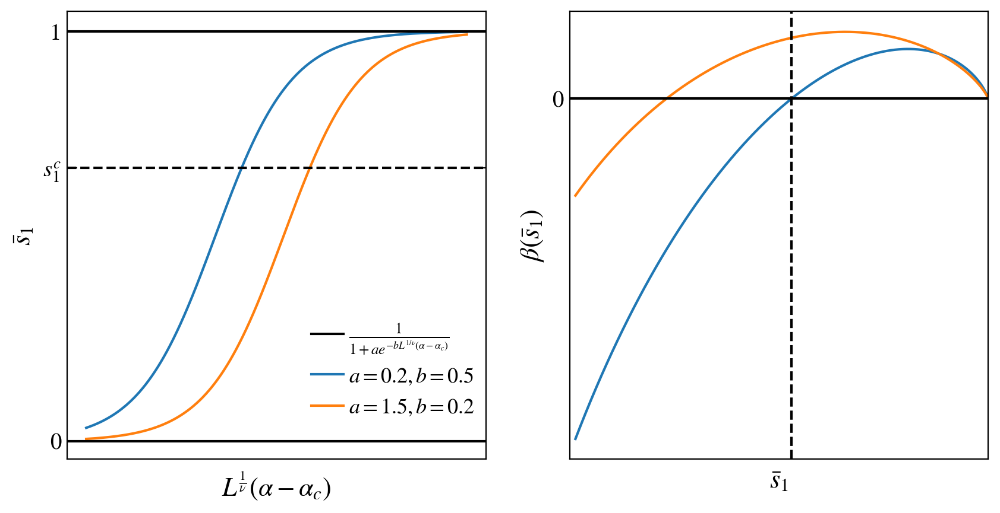

In [280]:
colors_ls_cyc = itertools.cycle(colors_ls)
fig, axis = plt.subplots( nrows=1, ncols=2, figsize=(10,5), dpi = 200)

def ansatz(x, b, a = 0.2):
    return (1 / (1 + a*np.exp(-b*x)))

axis[0].plot(np.nan, np.nan, c='k', label=r"$\frac{1}{1+ae^{-bL^{1/\nu}(\alpha-\alpha_c)}}$")
z = np.linspace(-10, 10, 1000)
# axis[0].plot(z, ansatz(z, 0.5), label=r"$b=0.5$")
axis[0].plot(z, ansatz(z, 0.5), label=r"$a=0.2,b=0.5$")
axis[0].plot(z, ansatz(z, 0.5, a=1.2), label=r"$a=1.5,b=0.2$", ls='-')
# axis[0].plot(z, ansatz(z, 1e6), label=r"$b=\infty$")
colors_ls_cyc = itertools.cycle(colors_ls)

axis[0].axhline(y=2/3, ls='--', c='k')
axis[0].axhline(y=0, ls='-', c='k')
axis[0].axhline(y=1, ls='-', c='k')
fig_help.set_plot_elements(axis[0], ylabel=r"$\bar{s}_1$", xlabel=r"$L^\frac{1}{\nu}(\alpha-\alpha_c)$", font_size=14, set_legend=True, xscale='linear', yscale='linear')
fig_help.set_legend(axis[0], loc = 'lower right', fontsize=13, anchor=(1.02, 0.05))
axis[0].tick_params(axis='y', which='both', bottom=False, top=False, labelbottom=False)
axis[0].set_yticks([0, 1/1.5, 1])
axis[0].set_yticklabels(['0', r"$s_1^c$", 1])
# axis[0].set_ylim(0, 1)
axis[0].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
axis[0].set_xticks([0, 1, -1])
axis[0].set_xticklabels(['0', '1', '-1'])

def beta_fun(x, nu = 0.5, a=0.5):
    s1c = 1/(1+a)
    return -1/nu * (1 - x) * np.log( s1c * (1 - x) / ( x * (1-s1c) ))

s = np.linspace(0.3, 1, 1000)
axis[1].plot(s, beta_fun(s, a=0.5, nu=0.66), label=r"$\nu=\frac{2}{3}$")
axis[1].plot(s, beta_fun(s, a=1.2, nu=1), label=r"$\nu=1$")
axis[1].axvline(x=2/3, ls='--', c='k')
fig_help.set_plot_elements(axis[1], ylabel=r"$\beta(\bar{s}_1)$", xlabel=r"$\bar{s}_1$", font_size=14, set_legend=False, xscale='linear', yscale='linear')
axis[1].set_xlim(0.29, 1)
axis[1].tick_params(axis='y', which='both', bottom=False, top=False, labelbottom=False)
axis[1].set_yticks([0])
axis[1].set_yticklabels(['0'])
axis[1].axhline(y=0, ls='-', c='k')
axis[1].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
axis[1].set_xticks([1/1.5, 1])
axis[1].set_xticklabels([r"$s_1^c$", 1])



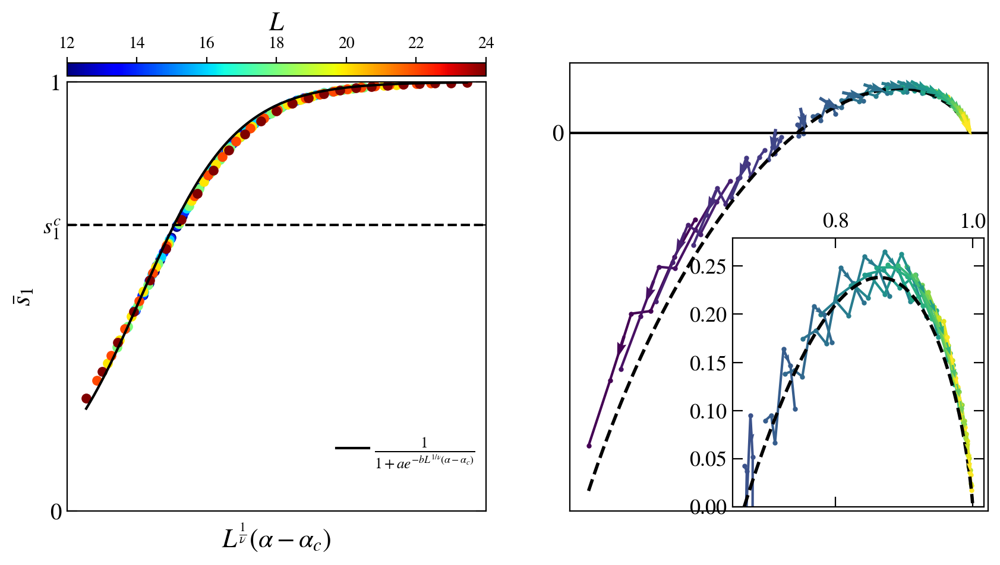

In [7]:
colors_ls_cyc = itertools.cycle(colors_ls)
fig, axis = plt.subplots( nrows=1, ncols=2, figsize=(10,5), dpi = 200)
inset = axis[1].inset_axes([0.39, 0.01, 0.6, 0.6])


a=0.5
b=1
nu=0.66
use_fit=0
Nsamples = 2000
interpolate = 0


def ansatz_inf(z):
    return (1 / (1 + a*np.exp(-b * z)))
def ansatz(alfa, L):
    return (1 / (1 + a*np.exp(-b * L**(1/nu)*alfa)))

axis[0].plot(np.nan, np.nan, c='k', label=r"$\frac{1}{1+ae^{-bL^{1/\nu}(\alpha-\alpha_c)}}$")
# z = np.linspace(-10, 10, 1000)

sizes = np.arange(12, 26, 2)

norm = matplotlib.colors.Normalize(
    vmin=np.min(sizes),
    vmax=np.max(sizes))


# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap='jet', norm=norm)
s_m.set_array([])

alfa = np.linspace(-0.015, 0.05, 25)
xmin = +2
xmax = -2
ydata = []
for L in sizes:
    xx = L**(1/nu)*alfa
    yy = np.zeros(xx.shape)
    for r in range(Nsamples):
        alfa2 = alfa + (np.random.random(1)[0] - 0.5) / (2*L)
        yy += ansatz(alfa2, L ) - (np.random.random(alfa.size) - 0.48) / (2*L)
    yy /= Nsamples
    ydata.append(yy)
    axis[0].scatter(xx, yy, s=25, color = s_m.to_rgba(L))
    if min(xx) < xmin: xmin = min(xx)
    if max(xx) > xmax: xmax = max(xx)
    
ydata = np.array(ydata)
z = np.linspace(xmin, xmax, 1000)
axis[0].plot(z, ansatz_inf(z), c='k', ls='-')

axis[0].axhline(y=2/3, ls='--', c='k')

fig_help.set_plot_elements(axis[0], ylabel=r"$\bar{s}_1$", xlabel=r"$L^\frac{1}{\nu}(\alpha-\alpha_c)$", font_size=14, set_legend=True, xscale='linear', yscale='linear')
fig_help.set_legend(axis[0], loc = 'lower right', fontsize=13, anchor=(1.02, 0.05))
axis[0].tick_params(axis='y', which='both', bottom=False, top=False, labelbottom=False)
axis[0].set_yticks([0, 1/1.5, 1])
axis[0].set_yticklabels(['0', r"$s_1^c$", 1])
axis[0].set_ylim(0, 1)
axis[0].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
# axis[0].set_xticks([0, 1, -1])
axis[0].set_xticklabels(['0', '1', '-1'])
cbar = None
    
divider = make_axes_locatable(axis[0])
cax = divider.new_vertical(size = '3%', pad = 0.05)

fig.add_axes(cax)
cbar = fig.colorbar(s_m, cax = cax, orientation = 'horizontal')
cax.xaxis.set_ticks_position('top')
cax.xaxis.set_label_position('top')

cbar.set_label(r"$L$", fontsize=16)

ydata = np.transpose(ydata)

norm = matplotlib.colors.Normalize(
    vmin=np.min(alfa),
    vmax=np.max(alfa))

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
s_m.set_array([])

def pade_fun(x, c1, c2, c3, d1, d2, d3):
    # return 1 - c1 * np.exp(-c2 * x)
    return (x**3 + c3*x**2 + c1 * x + c2) / (x**3 + d3*x**2 + d1 * x + d2)

def other_fit(x, a, c0, c1, c2, c3, c4): 
    return c1 / x**3 + c2 / x**2 + c3 / x**1 + c4 + a / x**5+ c0 / x**4
def localized_fit(x, c1, c2, c3, c4):
    return c1 * np.exp(-c2 * x**c3)

def pade_fun_deriv(x, c1, c2, c3, d1, d2, d3):
    return -(x**2 + c1 * x + c2) * (d1 + 2*x) / (x**2 + d1 * x + d2)**2 + (c1 + 2*x) / (d2 + d1*x + x**2)

def other_fit_deriv(x, a, c0, c1, c2, c3, c4):
    return - 3 * c1 / x**4 - 2 * c2 / x**3 - c3 / x**2 #-5 * a/ x**6 - 4 * c0 / x**5 

for ii, alfa in enumerate(alfa):
    col = s_m.to_rgba(alfa)

    xx = sizes
    yy = ydata[ii]
    if interpolate:
        f = splrep(xx, yy, k=5, s=5)
        xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
        yy = splev(xx, f)
        
    if use_fit:
        my_fit = pade_fun if alfa > alfa_crit else other_fit# if alfa > 0.69 else localized_fit)
        my_fit_deriv = pade_fun_deriv if alfa > alfa_crit else other_fit_deriv
        pars, pconv = fit(my_fit,
                            xdata = xx,
                            ydata = yy,
                            maxfev = 10000
                            )
        xL = np.linspace(xx[0], xx[-1], 100)
        smooth_data = my_fit(xL, *pars)
        
        # deriv = my_fit_deriv(xL, *pars) * xL / smooth_data
        deriv = np.gradient( np.log(smooth_data), np.log(xL) )
        
        axis[1].plot(smooth_data, deriv, lw=1.5, color=col, zorder=-2)
        
        i1 = smooth_data.size // 2
        u = smooth_data[i1+1] - smooth_data[i1]
        v = deriv[i1+1] - deriv[i1]
        pos_x = smooth_data[i1] + u/2
        pos_y = deriv[i1] + v/2
        norm = np.sqrt(u**2+v**2)

        axis[1].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=-1, pivot="mid", 
                            linewidth=0, width=0.02, headwidth=3, color=col, lw=0)
        if alfa > 0:
            inset.plot(smooth_data, deriv, lw=1.5, color=col, zorder=-2)
            inset.quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=-1, pivot="mid", 
                            linewidth=0, width=0.02, headwidth=3, color=col, lw=0)
        
    else:
        xx = np.log(xx)
        xx_beta = np.zeros( (xx.size - 1) )
        beta = np.zeros( (xx.size - 1) )
        for ii in range(xx.size - 1):
            xx_beta[ii] = yy[ii+1]
            beta[ii] = ( np.log(yy[ii+1]) - np.log(yy[ii])) / ( xx[ii+1] - xx[ii])
        
        axis[1].plot(xx_beta, beta, marker='o', markersize=2, lw=1.5, color=s_m.to_rgba(alfa))
        
        i1 = xx.size // 2
        u = xx_beta[i1+1] - xx_beta[i1]
        v = beta[i1+1] - beta[i1]
        pos_x = xx_beta[i1] + u/2
        pos_y = beta[i1] + v/2
        norm = np.sqrt(u**2+v**2)

        axis[1].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", color=s_m.to_rgba(alfa), lw=0)
        if alfa > 0:
            inset.plot(xx_beta, beta, marker='o', markersize=2, lw=1.5, color=s_m.to_rgba(alfa))
            inset.quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", color=s_m.to_rgba(alfa), lw=0)
        
    
def beta_fun(x):
    s1c = 1/(1+a)
    return -1/nu * (1 - x) * np.log( s1c * (1 - x) / ( x * (1-s1c) ))

s = np.linspace(min(ydata.flatten()), 1, 1000)
axis[1].plot(s, beta_fun(s), color='k', ls='--', lw=2)
s = np.linspace(1/(1+a), 1, 1000)
inset.plot(s, beta_fun(s), color='k', ls='--', lw=2)
fig_help.set_plot_elements(axis[1], ylabel=r"$\beta(\bar{s}_1)$", xlabel=r"$\bar{s}_1$", font_size=14, set_legend=False, xscale='linear', yscale='linear')
fig_help.set_plot_elements(axis[1], ylabel=r"", xlabel="", font_size=14, set_legend=False, xscale='linear', yscale='linear')
# axis[1].set_xlim(0.29, 1)
axis[1].tick_params(axis='y', which='both', bottom=False, top=False, labelbottom=False)
axis[1].set_yticks([0])
axis[1].set_yticklabels(['0'])
axis[1].axhline(y=0, ls='-', c='k')
axis[1].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
axis[1].set_xticks([1/1.5, 1])
axis[1].set_xticklabels([r"$s_1^c$", 1])

inset.xaxis.set_label_position("top")
inset.xaxis.set_label_coords(.5, 1.2)
inset.xaxis.tick_top()
inset.set_ylim(0, None)

fig_help.set_plot_elements(inset, xlabel="", ylabel="", font_size=13, set_legend=False, yscale='linear')